1. обработать 11й год
3. попробовать разобраться с картой

- Отлично: доля > 25%, дельта < 0.1
- Хорошо: доля > 25%, 0.1 < дельта < 0.2
- Норм: доля > 25%, 0.2 < дельта < 0.3
- Плохо: доля > 25%, дельта > 0.3
- Неуд: доля < 25%

# Intro

In [11]:
import seaborn as sns

In [12]:
import csv
import math
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib import cm
from tqdm.notebook import tqdm
from datetime import time 
import datetime as dt
from scipy.signal import coherence
from scipy.signal import periodogram
from scipy.signal import welch

In [12]:
def time_delta(time1, time2):
    '''Вычисляет time1 - time2'''
    duration_in_min = time1[0] * 60 + time1[1] - time2[0] * 60 - time2[1]
    return duration_in_min // 60, duration_in_min % 60

In [13]:
def basic_plots(station_name,
                Az_path, P_path, 
                P_time_start, P_time_stop, 
                Az_time_start, Az_time_stop,
                ):
    '''
    Построение начальных графиков расширенных и нормализованных данных
    '''
    # Расчет начальных и конечных функций
    ###### можно свернуть 2 блока в 1
    if P_time_stop[0] > Az_time_stop[0]: further_time_stop = P_time_stop
    elif P_time_stop[0] < Az_time_stop[0]: further_time_stop = Az_time_stop
    elif P_time_stop[1] >= Az_time_stop[1]: further_time_stop = P_time_stop
    else: further_time_stop = Az_time_stop

    if P_time_start[0] < Az_time_start[0]: further_time_start = P_time_start
    elif P_time_start[0] > Az_time_start[0]: further_time_start = Az_time_start
    elif P_time_start[1] <= Az_time_start[1]: further_time_start = P_time_start
    else: further_time_start = Az_time_start
    print(f'Время начала измерений: {further_time_start}', 
          f'Время конца измерений: {further_time_stop}', sep='\n')


    # запись численного массива ускорений
    f = open(Az_path, "r")
    az = f.read().split()                           # список строк 
    az = [float(x) for x in az]                     # численные значения
    az_mean = np.mean(az[:])                        # считаем среднее значение ускорения на всем промежутке
    az = [x - az_mean for x in az]                  # нормализация


    # запись численного массива давлений
    f = open(P_path, "r")
    P = f.read().split()                            # список строк 
    P = [int(x)/10 for x in P]                      # численные значения
    P_mean = np.mean(P)                             # считаем среднее значение давления на всем промежутке
    theoretical_ratio = (P_mean/9.80665)**2         # для графика отношения мощностей
    P = [x - P_mean for x in P]                     # нормализация


    # 1 сек = 10 промежутков
    # 1 мин = 600 промежутков
    # 1 час = 36000 промежутков  
    delta_in_time = time_delta(further_time_stop, further_time_start) # Длительность всех измерений
    duration_len = delta_in_time[0] * 36000 + delta_in_time[1] * 600  # Длительность в промежутках

    # Дополняем меньший из промежутков
    if further_time_stop == P_time_stop:
        delta_len = time_delta(further_time_stop, Az_time_stop)                 # Разница 
        az = az + [0 for x in range(delta_len[0] * 36000 + delta_len[1] * 600)] # Заполняем правую часть нулями
    else:
        delta_len = time_delta(further_time_stop, P_time_stop) 
        P = P + [0 for x in range(delta_len[0] * 36000 + delta_len[1] * 600)] 

    if further_time_start == P_time_start:
        delta_len = time_delta(Az_time_start, further_time_start) 
        az = [0 for x in range(delta_len[0] * 36000 + delta_len[1] * 600)] + az 
    else:
        delta_len = time_delta(P_time_start, further_time_start)
        P = [0 for x in range(delta_len[0] * 36000 + delta_len[1] * 600)] + P
        
    print(f'Проверка на равенство дополненных промежутков: {len(az) == len(P)}')


    # Az
    plt.figure(figsize=(15, 7))
    plt.plot(az, linewidth=1)
    plt.ylabel('Вертикальное ускорение Az')
    plt.xlabel('Время, 1c/10')
    plt.title(f'Норм расширенные данные Az - {station_name} ', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 30)
    plt.show()

    # Р
    plt.figure(figsize=(15, 7))
    plt.plot(P, linewidth=1)
    plt.ylabel('Давление столбца жидкости на 1м2')
    plt.xlabel('Время, 1c/10')
    plt.title(f'Норм расширенные данные P - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 30)
    plt.show()
    
    return az, P, theoretical_ratio

In [14]:
def analysis_Az_P(az_oscillations, P_oscillations,
                 freq_acoustic, freq_gravity, freq_experimental,
                 theoretical_ratio, station_name):
    '''
    Функция анализа рабочего участка Az и P.
    returns: MSC-график, S_Ratio-график, доля хороших частот, Дельта 
    '''
    #Рабочие участки P и Az
    plt.figure(figsize=(7, 4))
    plt.ylabel('Давление столбца жидкости на 1м2')
    plt.xlabel('Время, 1c/10')
    plt.title(f'Рабочий участок P - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 20)
    plt.plot(P_oscillations, linewidth=1)

    plt.figure(figsize=(7, 4))
    plt.ylabel('Вертикальное ускорение Az')
    plt.xlabel('Время, 1c/10')
    plt.title(f'Рабочий участок Az - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 20)
    plt.plot(az_oscillations, linewidth=1)
    plt.show()
    
    
    freq_array, MSC_array = coherence(az_oscillations, P_oscillations, fs=10, nperseg=8192)
    freq1, power_spectral_density_az = welch(az_oscillations, fs=10, nperseg=8192)
    freq2, power_spectral_density_P = welch(P_oscillations, fs=10, nperseg=8192)
    relation_Sp_and_Saz = power_spectral_density_P / power_spectral_density_az

    #MSC
    plt.figure(figsize=(9, 5))
    plt.plot(freq_array, MSC_array)
    plt.ylabel('MSC')
    plt.xlabel('частота, Гц')
    plt.title(f'MSC - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 20)
    plt.axvline(x=freq_acoustic, c='g', linestyle=':')
    plt.axvline(x=freq_gravity, c='g', linestyle=':')
    plt.axvline(x=freq_experimental, c='g', linestyle=':')
    plt.xscale('log')
    plt.xlim(1e-2, 25e-2)
    plt.show()

    #Power spectral density ratio
    plt.figure(figsize=(9, 5))
    plt.plot(freq1, relation_Sp_and_Saz)
    plt.ylabel('S_p / S_Az')
    plt.xlabel('частота, Гц')
    plt.title(f'Отношение спектров мощностей - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 20)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim(1e-2, 25e-2)
    plt.ylim(1e12, 1e14)
    plt.axvline(x=freq_acoustic, c='g', linestyle=':')
    plt.axvline(x=freq_gravity, c='g', linestyle=':')
    plt.axvline(x=freq_experimental, c='g', linestyle=':')
    plt.axhline(y=theoretical_ratio, c='g', linestyle=':')
    plt.show()

    #Доля частот и ДЕЛЬТА
    df = pd.DataFrame(data=[freq_array, MSC_array, relation_Sp_and_Saz]).T.rename(columns={0: 'freq', 1: 'msc', 2: 'ratio'})
    df_results = df.loc[(df.freq > freq_gravity) & (df.freq < freq_experimental)]
    df_good_freq = df_results.loc[df_results.msc >= 0.99]
    average_ratio = df_good_freq.ratio.mean()
    delta = np.sqrt(average_ratio) / np.sqrt(theoretical_ratio) - 1

    print(f'Доля хороших частот = {df_good_freq.shape[0]/df_results.shape[0]}')
    print(f'Дельта = {delta}')
    
    data_to_append = [[station_name, 
                      df_good_freq.shape[0]/df_results.shape[0],
                      delta]]
    with open('final_stations_data.csv', 'a', newline='') as f:
        writer = csv.writer(f)
        writer.writerows(data_to_append)

In [15]:
def develop_the_station(station_name, height,
                Az_path, P_path, 
                P_time_start, P_time_stop, 
                Az_time_start, Az_time_stop):
    '''
    Полное исследование станции.
    Проводится за счет объединения функций basic_plots и analysis_Az_P
    '''
    freq_gravity = 0.366 * np.sqrt(9.80665/height)
    freq_acoustic = 1500 / 4 / height
    freq_experimental = 0.1
    
    # построение базовых графиков
    az, P, theoretical_ratio = basic_plots(station_name,Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)
    
    oscillation_start = int(input('Введите промежуток начала колебаний: '))
    az_oscillations = az[oscillation_start:oscillation_start+36000] # измерений длятся один час
    P_oscillations = P[oscillation_start:oscillation_start+36000]
    
    # дальнейший анализ 
    analysis_Az_P(az_oscillations, P_oscillations, freq_acoustic, freq_gravity, freq_experimental, theoretical_ratio, station_name)

In [16]:
# словарь глубин станций
dict_of_depths = {
    'A01':2039,
    'A02':2011,
    'A03':2063,
    'A04':2054,
    'B05':1998,
    'B06':2499,
    'B07':1980,
    'B08':1924,
    'C09':3511,
    'C10':4247,
    'C11':4378,
    'C12':3784,
    'D13':2441,
    'D14':2350,
    'D15':1909,
    'D16':1970,
    'E17':2054,
    'E18':2052,
    'E19':1909,
    'E20':1977,
    'C21':4449,
    'E22':1841,
}

# ШАБЛОН - D16

In [28]:
station_name = 'D16'
height = 1970
Az_path = 'data/az_metrics/201801231535_6h/M.KMD16.ZL.10Hz.asc.txt'
P_path = 'data/p_metrics/201801231300_11h/M.KMD16.Pr.txt'
freq_gravity = 0.366 * np.sqrt(9.80665/height)
freq_acoustic = 1500 / 4 / height
freq_experimental = 0.1
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

## Az D16
**Начало - 15:35**\
**Длительность - 6 часов**

In [29]:
# запись численного массива ускорений
f = open(Az_path, "r")
d16_az = f.read().split() # список строк 
d16_az = [float(x) for x in d16_az] # численные значения

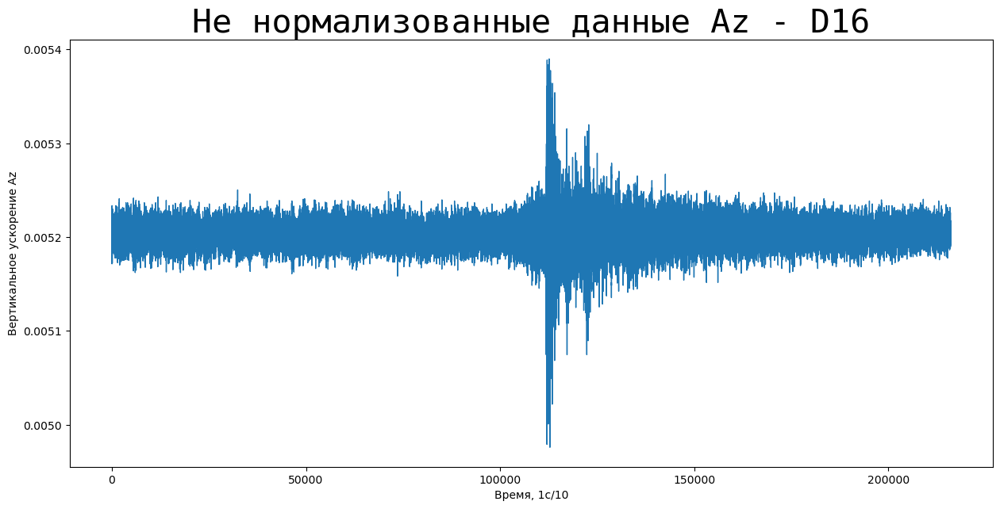

In [30]:
# не норм Az
plt.figure(figsize=(15, 7))
plt.plot(d16_az, linewidth=1)
plt.ylabel('Вертикальное ускорение Az')
plt.xlabel('Время, 1c/10')
plt.title(f'Не нормализованные данные Az - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 30)
plt.show()

In [31]:
# считаем среднее значение ускорения до возмущений
d16_az_mean = np.mean(d16_az[:])
# нормализация
d16_az = [x - d16_az_mean for x in d16_az]

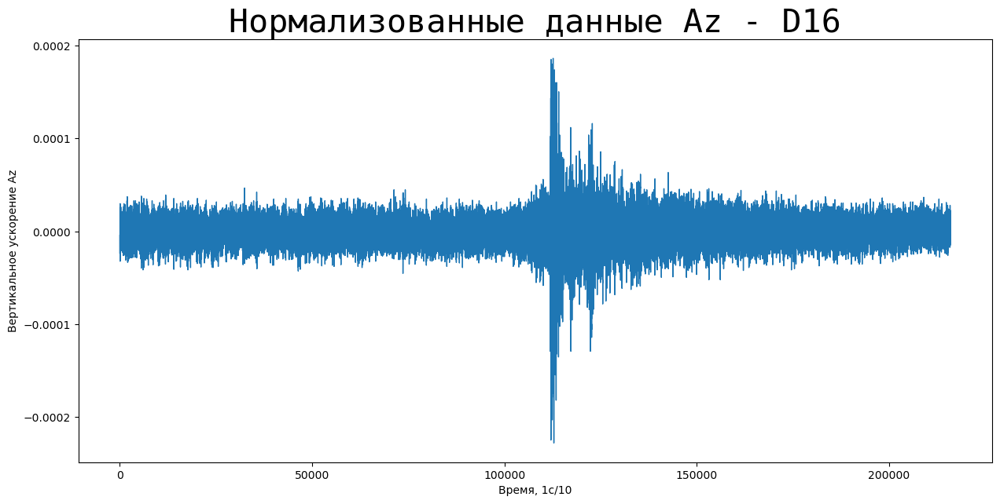

In [32]:
# норм Az
plt.figure(figsize=(15, 7))
plt.plot(d16_az, linewidth=1)
plt.ylabel('Вертикальное ускорение Az')
plt.xlabel('Время, 1c/10')
plt.title(f'Нормализованные данные Az - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 30)
plt.show()

**Дополним врем ряд ускорений до временного ряда давлений** 
- 396000 промежутков - Р - 13:00 до 00:00
- 216000 промежутков - А - 15:35 до 21:35

In [33]:
print(f'С 13:00 до 15:35 прошло {10*60*(60+60+35)} промежутков')
print(f'С 21:35 до 00:00 прошло {10*60*(25+60+60)} промежутков')

С 13:00 до 15:35 прошло 93000 промежутков
С 21:35 до 00:00 прошло 87000 промежутков


In [34]:
#проверка
93000+87000+216000 == 396000

True

In [35]:
# дополнение
d16_az = [0 for x in range(93000)] + d16_az + [0 for x in range(87000)]

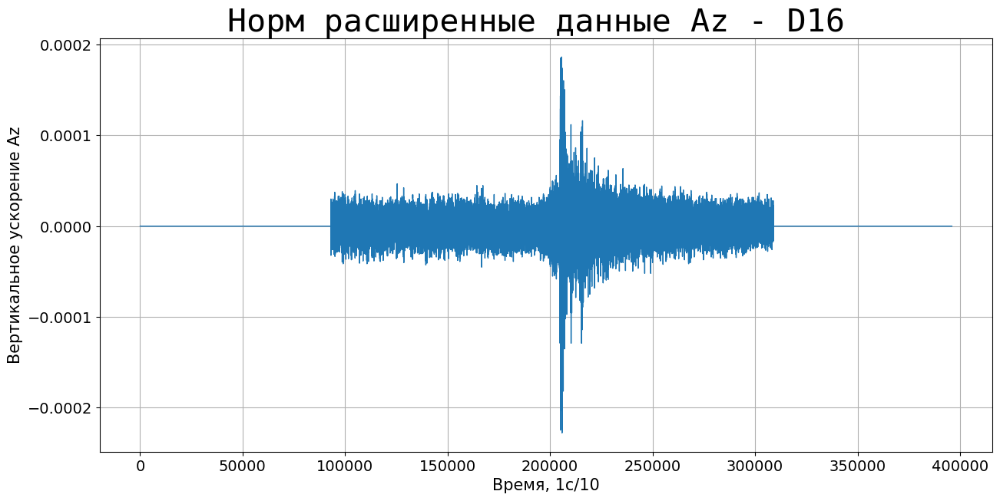

In [36]:
# норм Az
plt.figure(figsize=(15, 7))
plt.plot(d16_az, linewidth=1)
plt.ylabel('Вертикальное ускорение Az', fontsize=15)
plt.xlabel('Время, 1c/10', fontsize=15)
plt.tick_params(labelsize=14)
plt.grid()
plt.title(f'Норм расширенные данные Az - {station_name} ', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 30)
plt.show()

## P D16
**Начало - 13:00**\
**Длительность - 11 часов**

In [37]:
# запись численного массива давлений
f = open(P_path, "r")
d16_P = f.read().split() # список строк 
d16_P = [int(x)/10 for x in d16_P] # численные значения

In [38]:
# считаем среднее значение давления на всем промежутке
d16_P_mean = np.mean(d16_P)
# для графика отношения мощностей
theoretical_ratio = (d16_P_mean/9.80665)**2

In [39]:
# нормализация
d16_P = [x - d16_P_mean for x in d16_P]

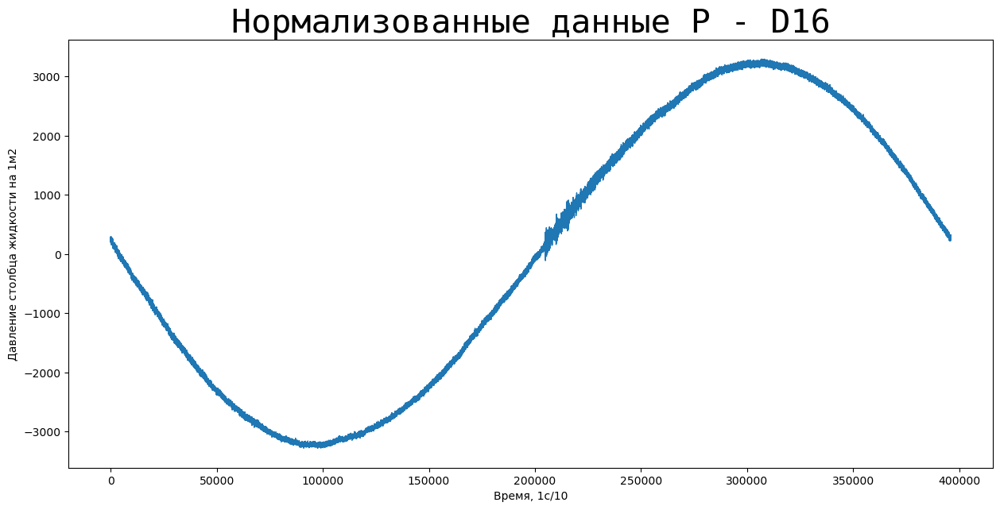

In [40]:
# норм Р
plt.figure(figsize=(15, 7))
plt.plot(d16_P, linewidth=1)
plt.ylabel('Давление столбца жидкости на 1м2')
plt.xlabel('Время, 1c/10')
plt.title(f'Нормализованные данные P - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 30)
plt.show()

## Выделение рабочего участска
1час = 3600сек = 36000промежутков

In [41]:
# уже рабочие участки
d16_az_oscillations = d16_az[200000:236000]
d16_P_oscillations = d16_P[200000:236000]

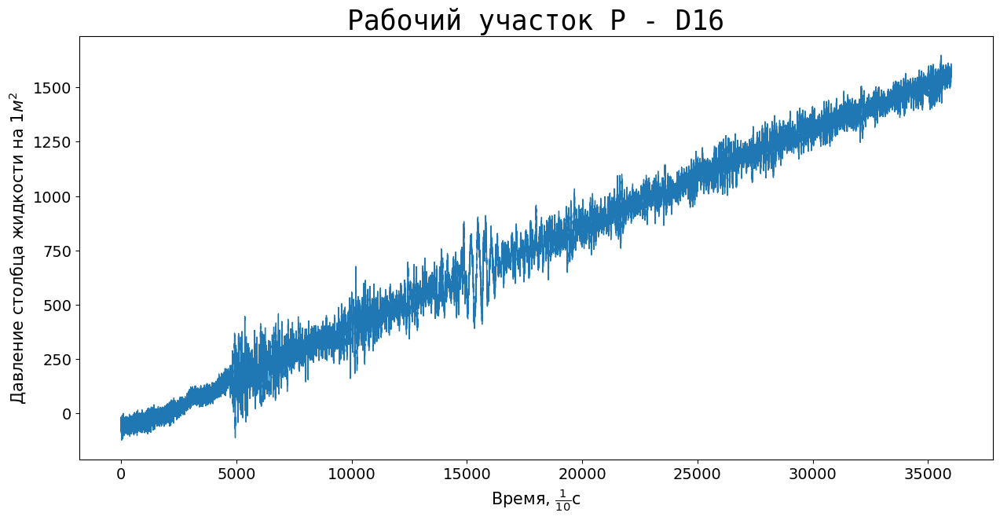

In [42]:
plt.figure(figsize=(15, 7))
plt.ylabel('Давление столбца жидкости на $1м^2$', fontsize=15)
plt.xlabel(r'Время, $\frac{1}{10}$с', fontsize=15)
r'Hertz $(\frac{1}{s})$'
plt.tick_params(labelsize=14)
plt.title(f'Рабочий участок P - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 25)
plt.plot(d16_P_oscillations, linewidth=1)
plt.show()

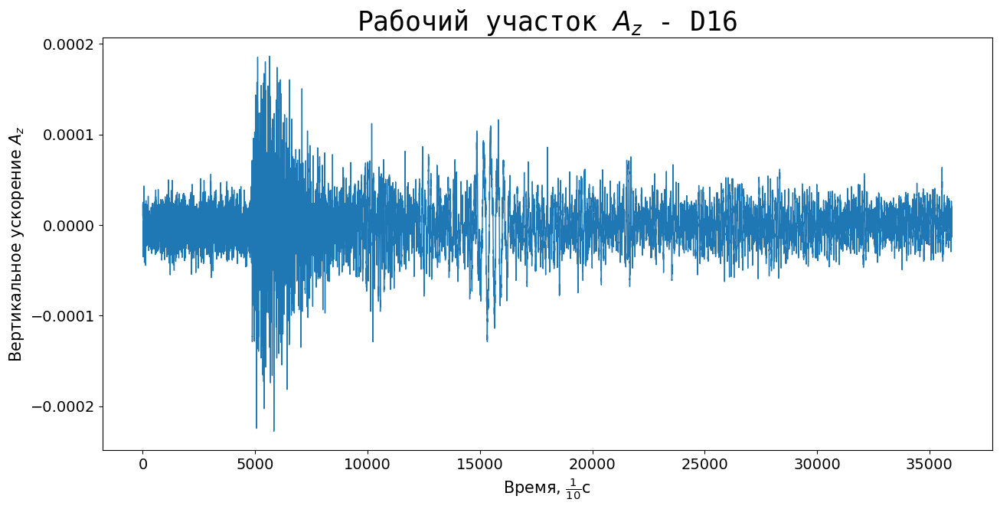

In [43]:
plt.figure(figsize=(15, 7))
plt.ylabel('Вертикальное ускорение $A_{z}$', fontsize=15)
plt.xlabel(r'Время, $\frac{1}{10}$с', fontsize=15)
plt.title('Рабочий участок $A_{z}$ - ' + f'{station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 25)
plt.plot(d16_az_oscillations, linewidth=1)
plt.tick_params(labelsize=14)
# plt.grid(color='k', linestyle='--', linewidth=0.5)
plt.show()

## MSC

In [44]:
freq_array, MSC_array = coherence(d16_az_oscillations, d16_P_oscillations, fs=10, nperseg=8192)

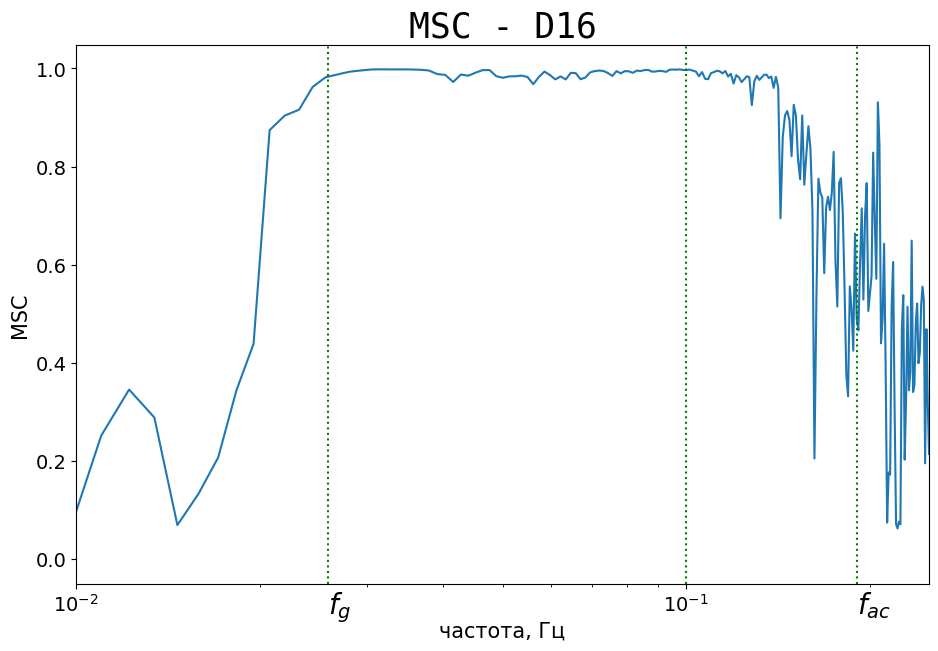

In [45]:
plt.figure(figsize=(11, 7))
plt.plot(freq_array, MSC_array)
plt.ylabel('MSC', fontsize=15)
plt.xlabel('частота, Гц', fontsize=15)
plt.tick_params(labelsize=14)
plt.title(f'MSC - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 25)
plt.axvline(x=freq_acoustic, c='g', linestyle=':')
plt.text(freq_acoustic,-0.11,'$f_{ac}$',rotation=0, fontsize=20)
plt.axvline(x=freq_gravity, c='g', linestyle=':')
plt.text(freq_gravity,-0.11,'$f_{g}$',rotation=0, fontsize=20)
plt.axvline(x=freq_experimental, c='g', linestyle=':')
plt.xscale('log')
plt.xlim(1e-2, 25e-2)
plt.show()

## Отношение спектров мощностей

In [46]:
freq1, power_spectral_density_az = welch(d16_az_oscillations, fs=10, nperseg=8192)
freq2, power_spectral_density_P = welch(d16_P_oscillations, fs=10, nperseg=8192)
relation_Sp_and_Saz = power_spectral_density_P / power_spectral_density_az

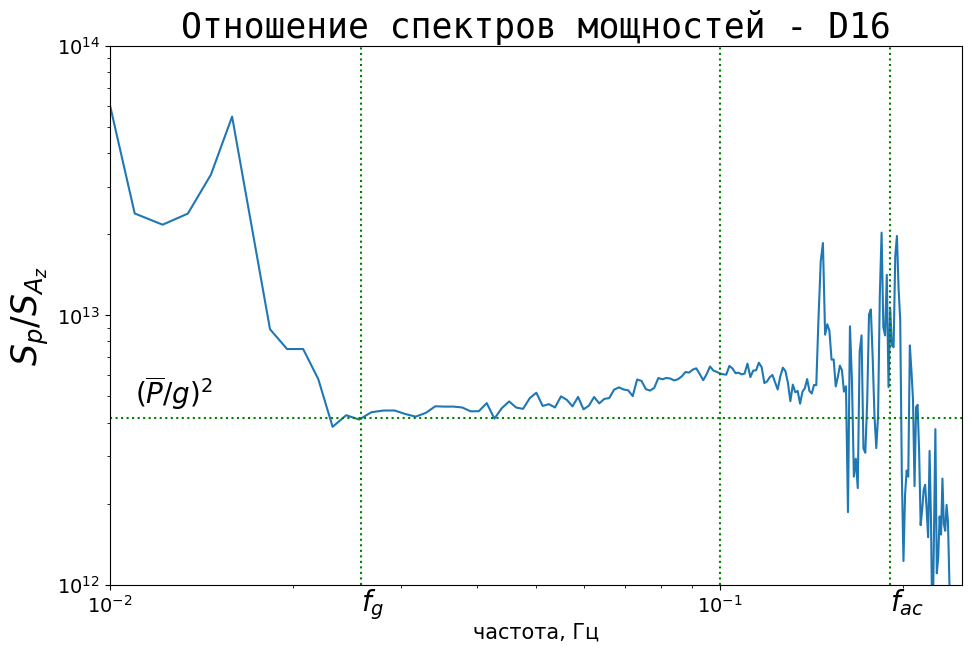

In [47]:
plt.figure(figsize=(11, 7))
plt.plot(freq1, relation_Sp_and_Saz)
plt.tick_params(labelsize=14)
plt.ylabel('$S_{p} / S_{A_{z}}$', fontsize=25)
plt.xlabel('частота, Гц', fontsize=15)
plt.title(f'Отношение спектров мощностей - {station_name}', fontfamily = 'monospace', fontstyle = 'normal', fontsize = 25)
plt.xscale('log')
plt.yscale('log')
plt.xlim(1e-2, 25e-2)
plt.ylim(1e12, 1e14)
plt.axvline(x=freq_acoustic, c='g', linestyle=':')
plt.text(freq_acoustic,0.8e12,'$f_{ac}$',rotation=0, fontsize=20)
plt.axvline(x=freq_gravity, c='g', linestyle=':')
plt.text(freq_gravity,0.8e12,'$f_{g}$',rotation=0, fontsize=20)
plt.axvline(x=freq_experimental, c='g', linestyle=':')
plt.axhline(y=theoretical_ratio, c='g', linestyle=':')
plt.text(1.1e-2,4.7e12,'$(\overline{P} / g)^2$',rotation=0, fontsize=20)
plt.show()

## Анализ результатов

In [48]:
df = pd.DataFrame(data=[freq_array, MSC_array, relation_Sp_and_Saz]).T.rename(columns={0: 'freq', 1: 'msc', 2: 'ratio'})

In [49]:
df_results = df.loc[(df.freq > freq_gravity) & (df.freq < freq_experimental)]
df_good_freq = df_results.loc[df_results.msc >= 0.99]
print(f'Доля хороших частот = {df_good_freq.shape[0]/df_results.shape[0]}')

Доля хороших частот = 0.65


In [50]:
average_ratio = df_good_freq.ratio.mean()

In [51]:
delta = np.sqrt(average_ratio) / np.sqrt(theoretical_ratio) - 1

In [52]:
print(f'Дельта = {delta}')

Дельта = 0.13613006098077762


# 2017-01-22
- P_time_start = 10, 0
- P_time_stop = 24, 0
- Az_time_start = 10, 30
- Az_time_stop = 16, 30

## A01 - отлично (0.88, 0.09)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


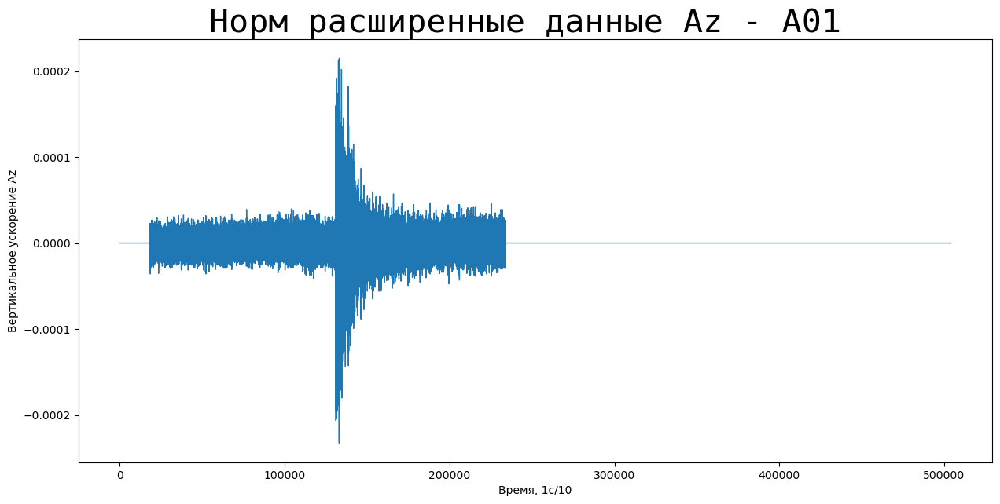

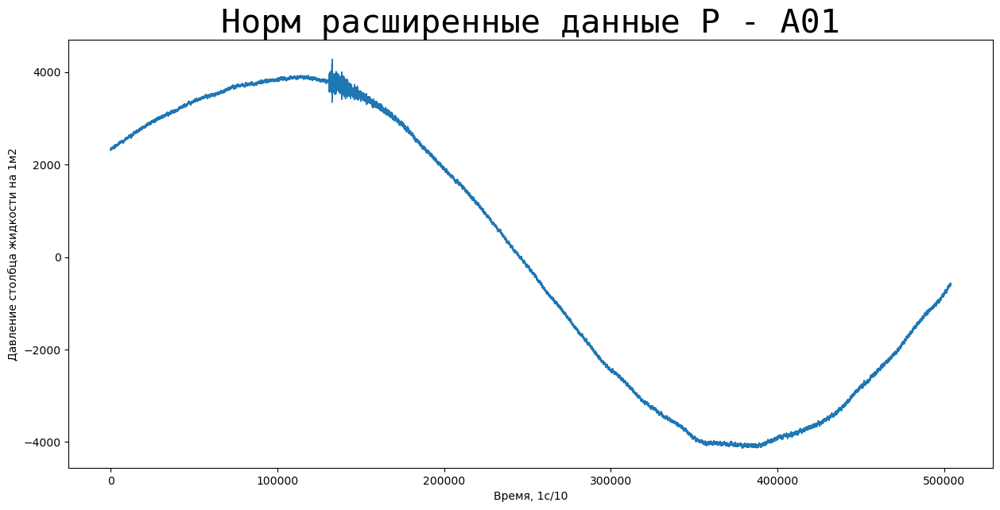

Введите промежуток начала колебаний: 125000


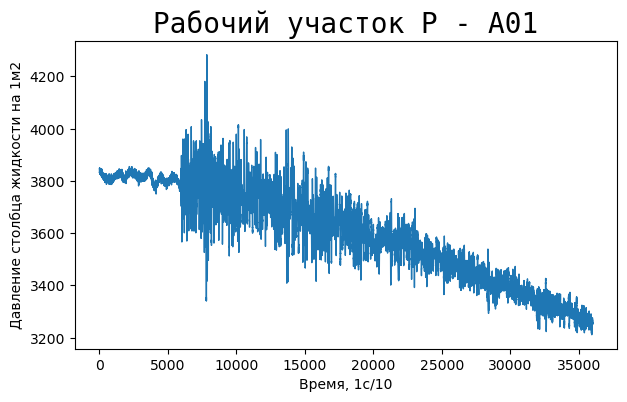

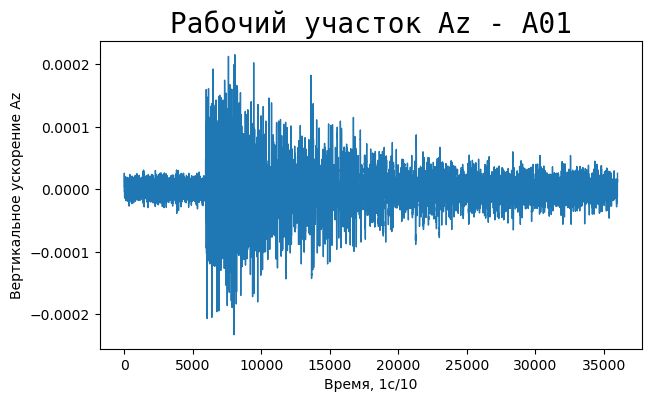

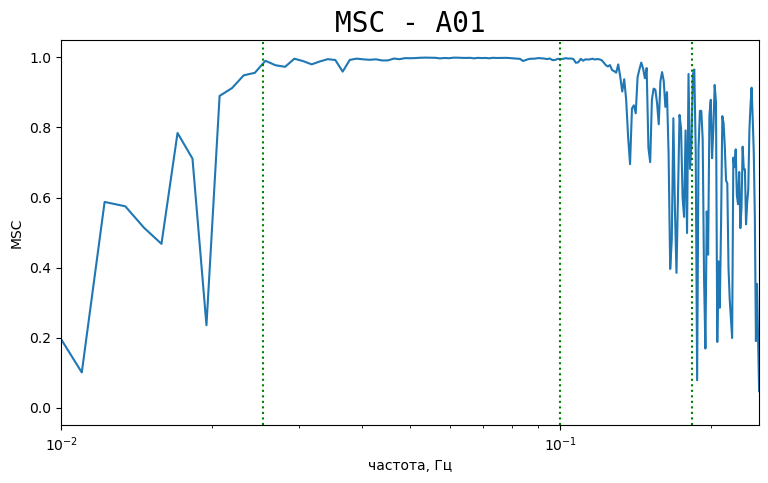

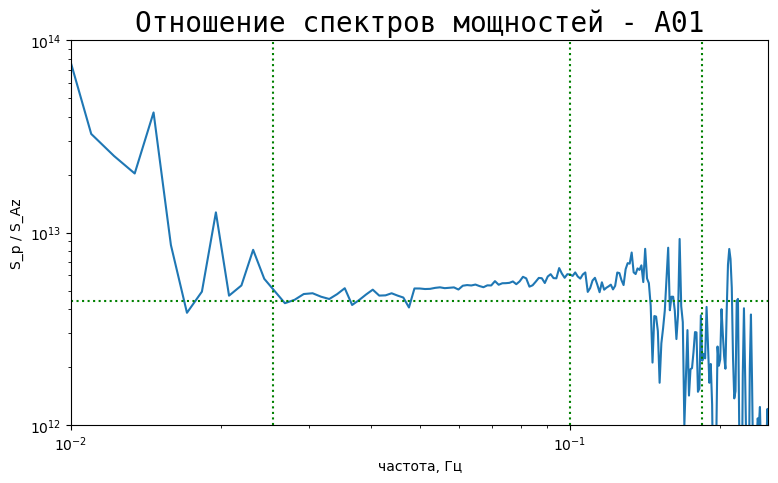

Доля хороших частот = 0.8852459016393442
Дельта = 0.0955124138504011


In [23]:
station_name = 'A01'
Az_path = 'data/az_metrics/201701221030_6h/M.KMA01.ZL.10Hz.asc'
P_path = 'data/p_metrics/201701221000_14h/M.KMA01.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A02 - хорошо (0.70, 0.12)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


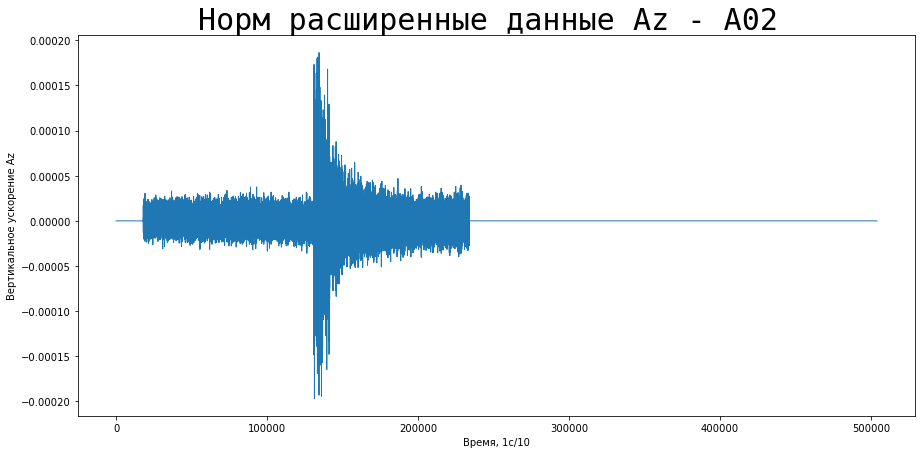

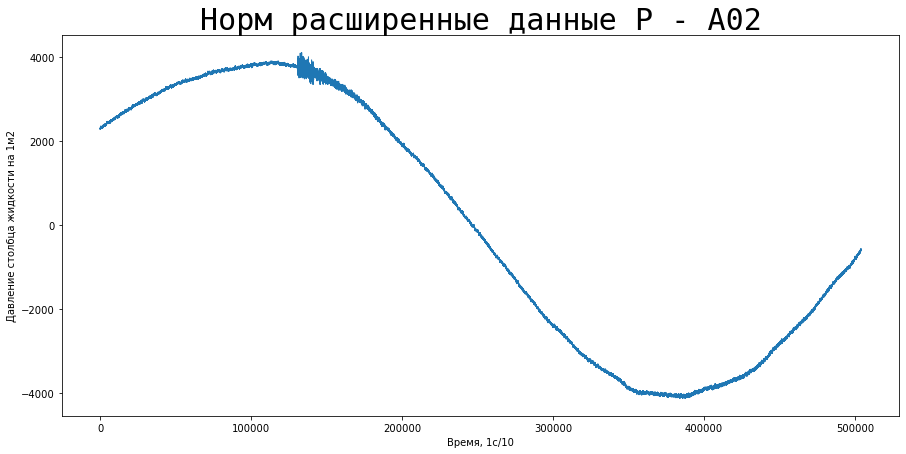

Введите промежуток начала колебаний: 125000


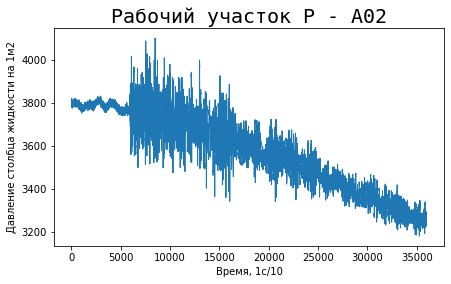

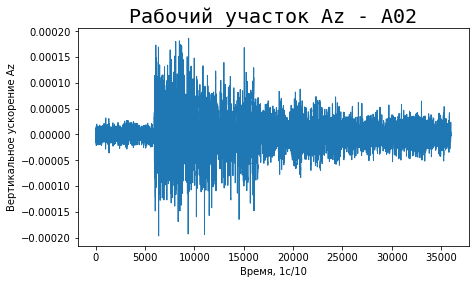

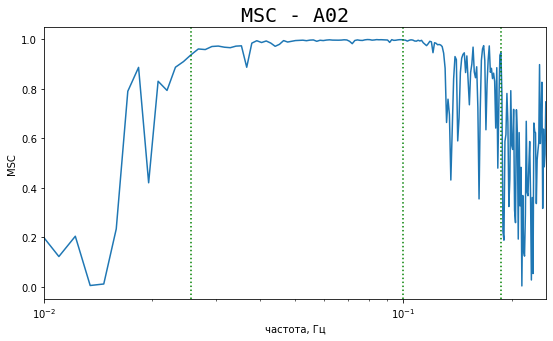

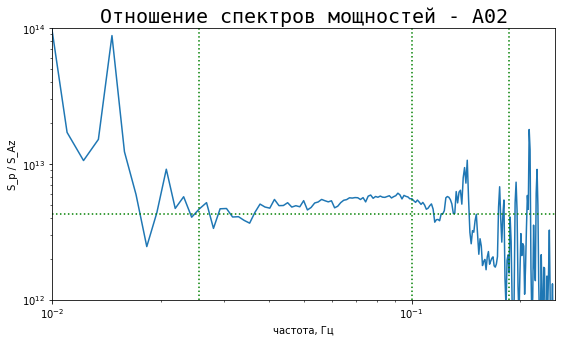

Доля хороших частот = 0.7049180327868853
Дельта = 0.125626986133331


In [106]:
station_name = 'A02'
Az_path = 'az_metrics/201701221030_6h/M.KMA02.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMA02.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A03 - отлично (0.60, 0.06)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


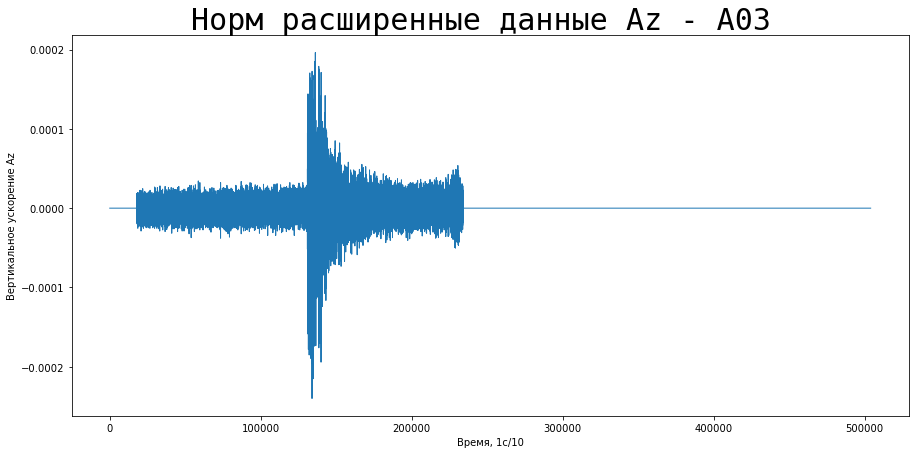

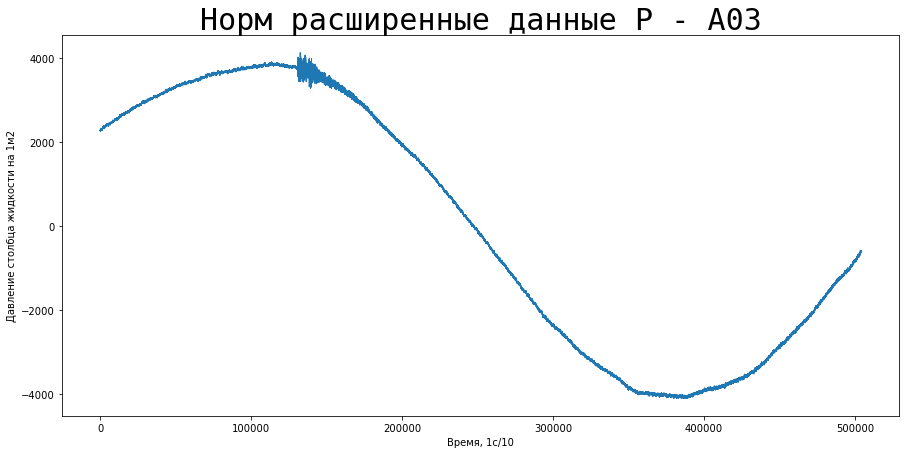

Введите промежуток начала колебаний: 125000


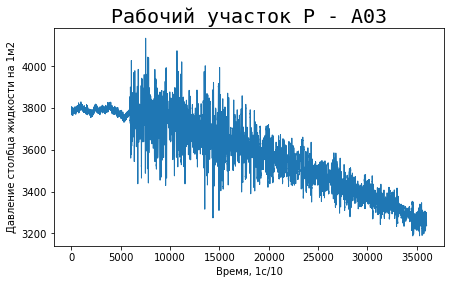

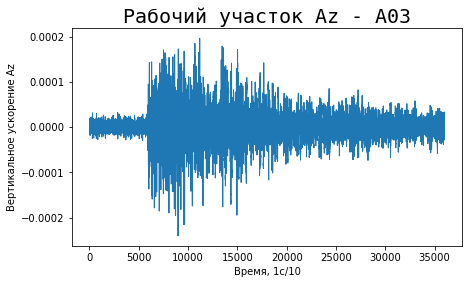

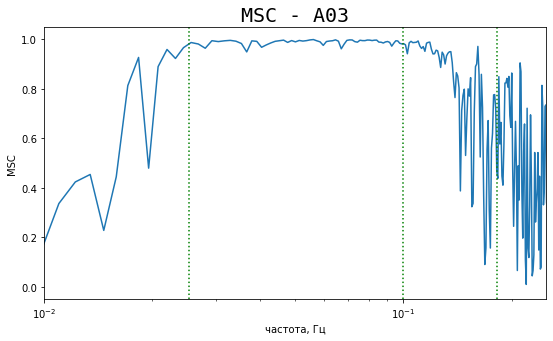

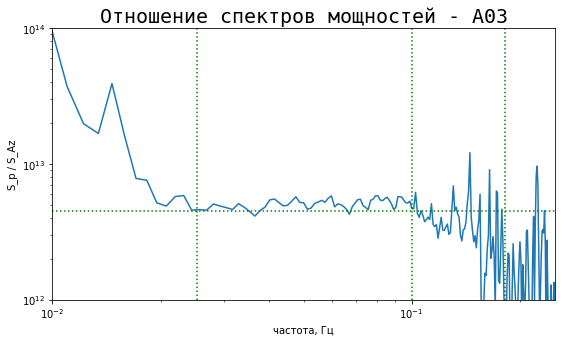

Доля хороших частот = 0.6065573770491803
Дельта = 0.06033403329564169


In [107]:
station_name = 'A03'
Az_path = 'az_metrics/201701221030_6h/M.KMA03.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMA03.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A04 - хорошо (0.83, 0.13)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


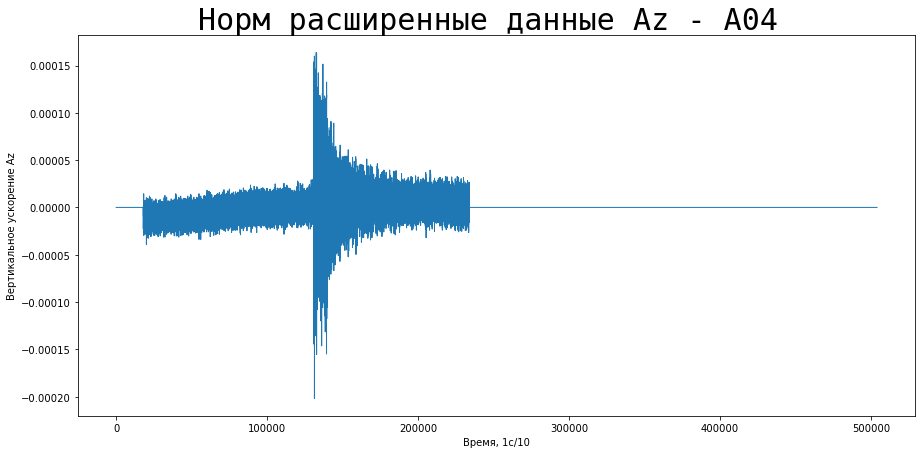

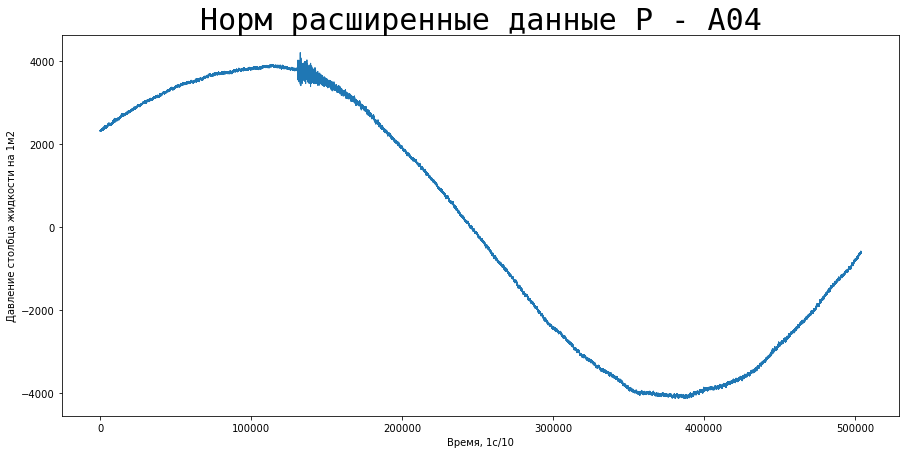

Введите промежуток начала колебаний: 125000


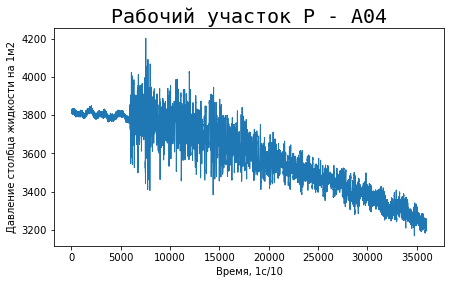

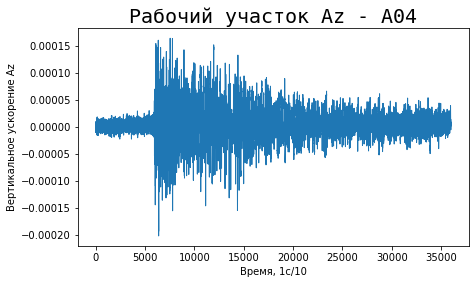

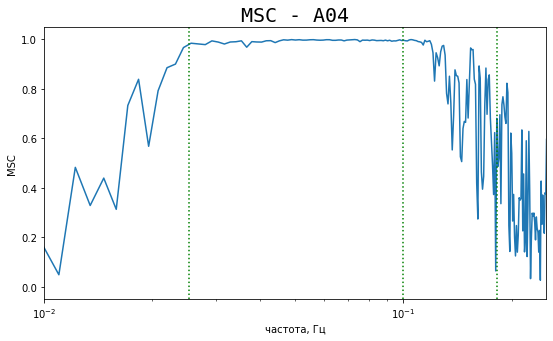

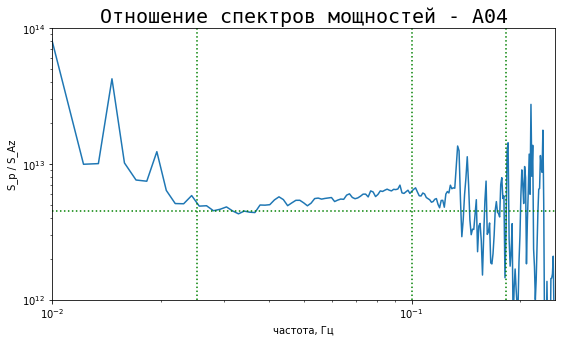

Доля хороших частот = 0.8360655737704918
Дельта = 0.1316210162106286


In [108]:
station_name = 'A04'
Az_path = 'az_metrics/201701221030_6h/M.KMA04.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMA04.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B05 - хорошо (0.52, 0.16)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


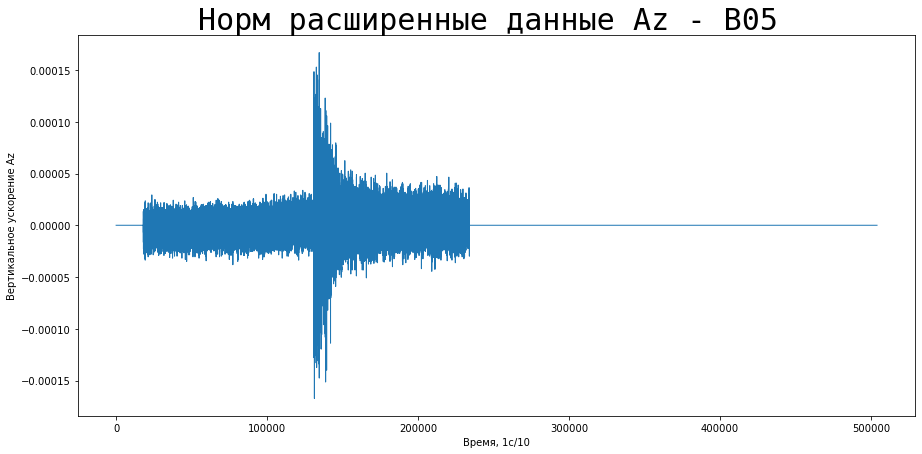

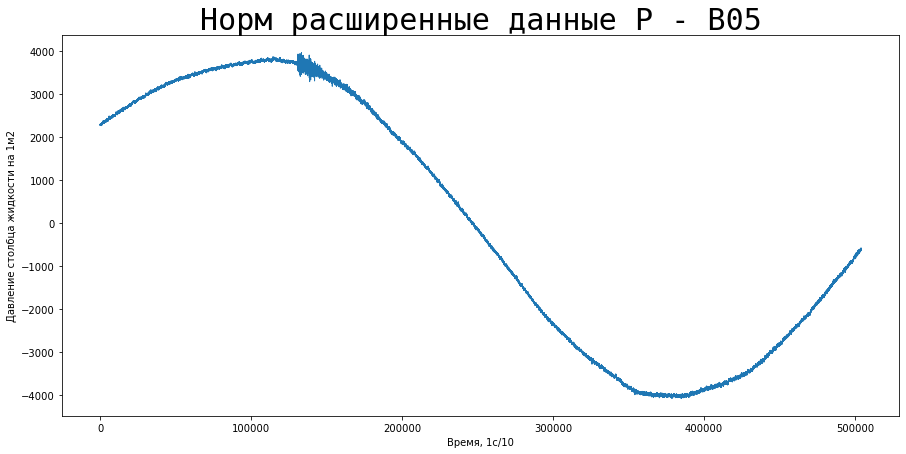

Введите промежуток начала колебаний: 125000


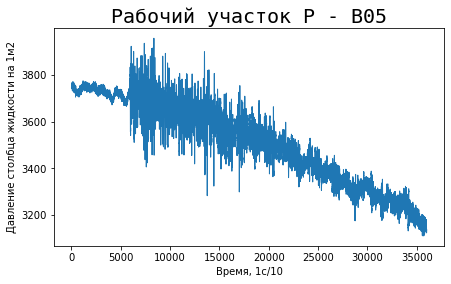

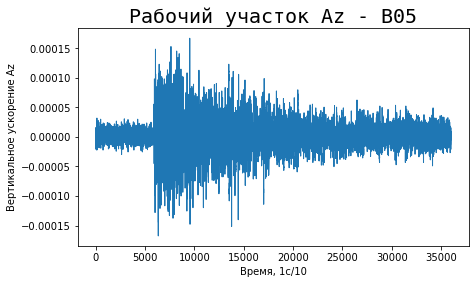

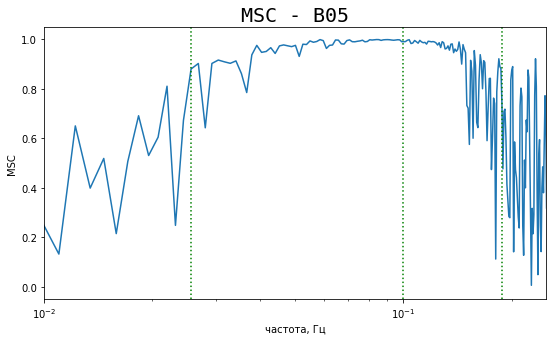

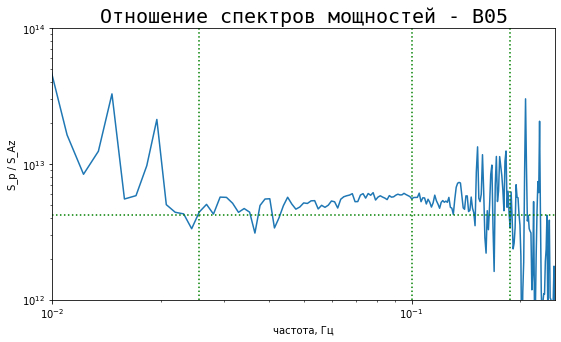

Доля хороших частот = 0.5166666666666667
Дельта = 0.15731168151396902


In [109]:
station_name = 'B05'
Az_path = 'az_metrics/201701221030_6h/M.KMB05.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMB05.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B06 - неуд (0,0)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


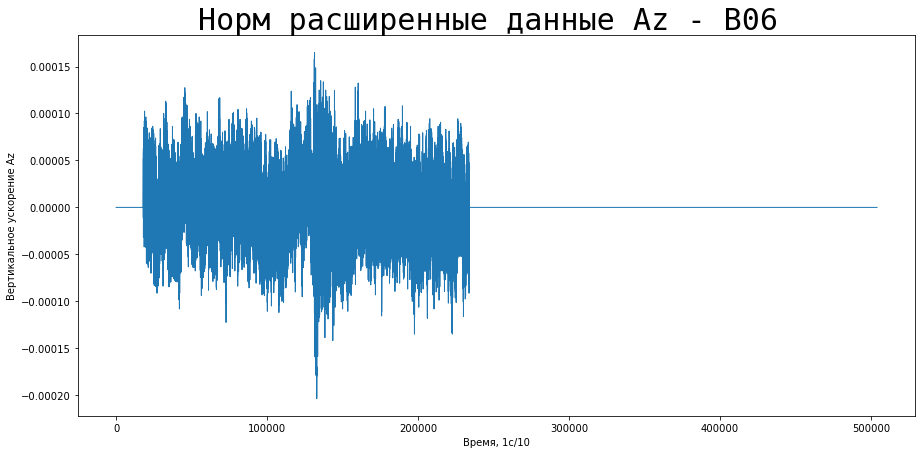

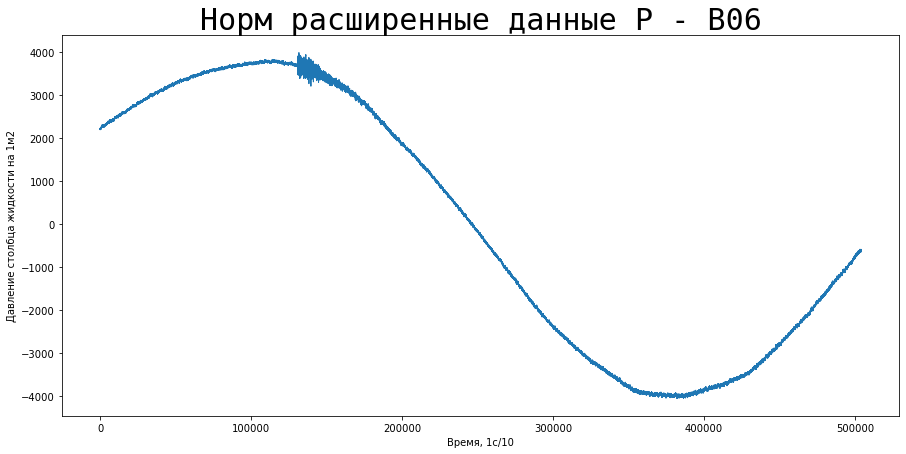

Введите промежуток начала колебаний: 125000


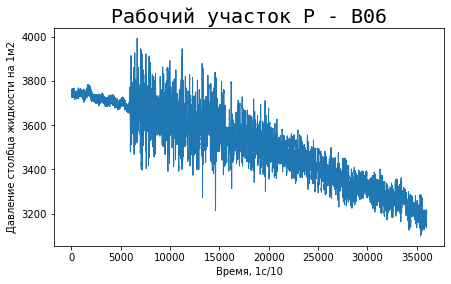

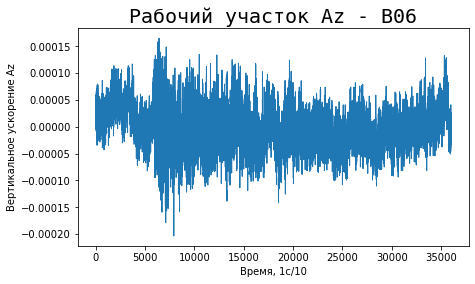

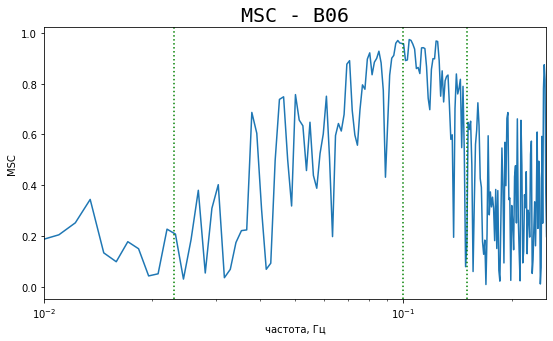

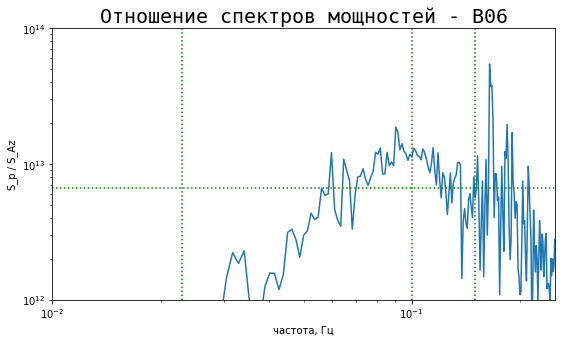

Доля хороших частот = 0.0
Дельта = nan


In [110]:
station_name = 'B06'
Az_path = 'az_metrics/201701221030_6h/M.KMB06.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMB06.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B07 - неуд (0.07, 0.07)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


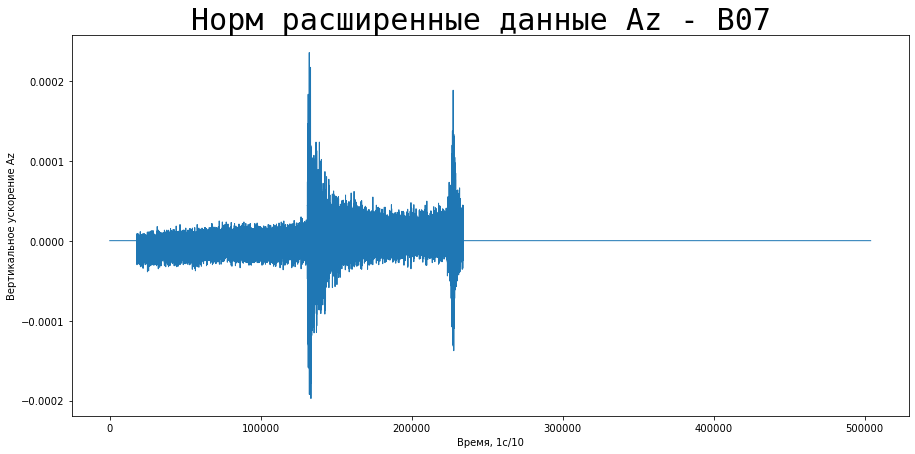

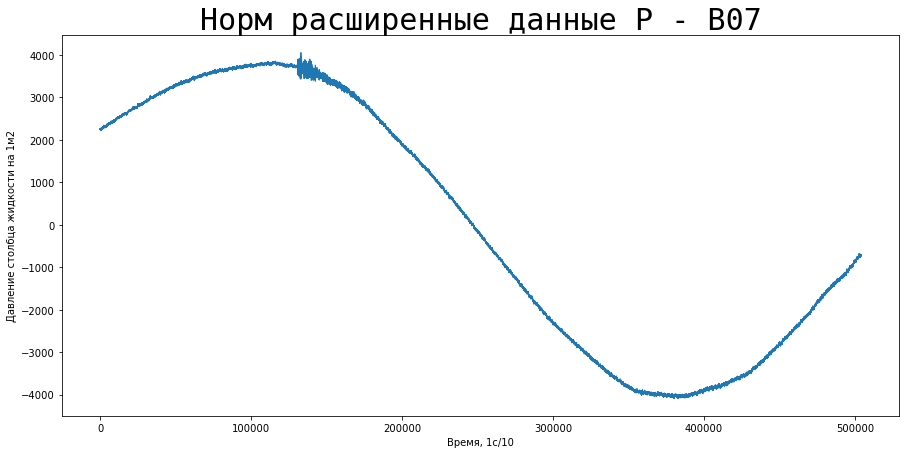

Введите промежуток начала колебаний: 125000


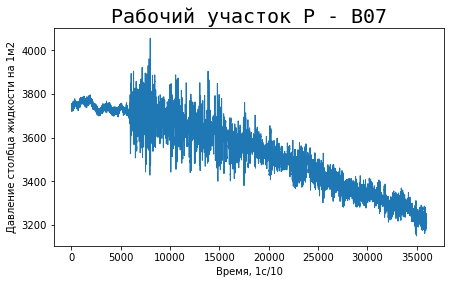

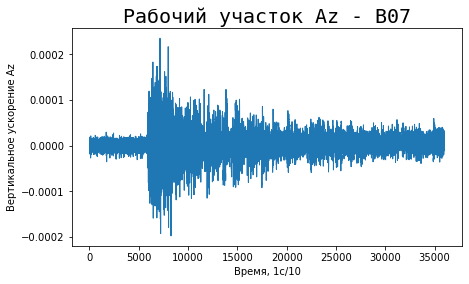

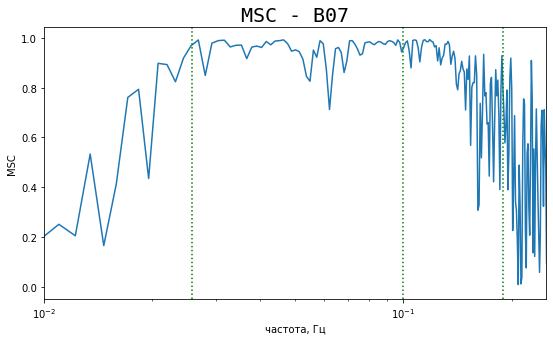

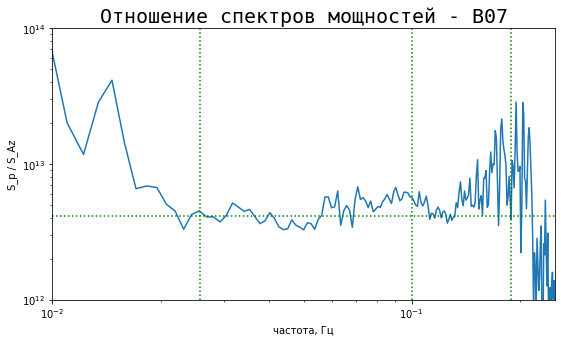

Доля хороших частот = 0.06666666666666667
Дельта = 0.07761433736019652


In [111]:
station_name = 'B07'
Az_path = 'az_metrics/201701221030_6h/M.KMB07.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMB07.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B08 - хорошо (0.43, 0.17)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


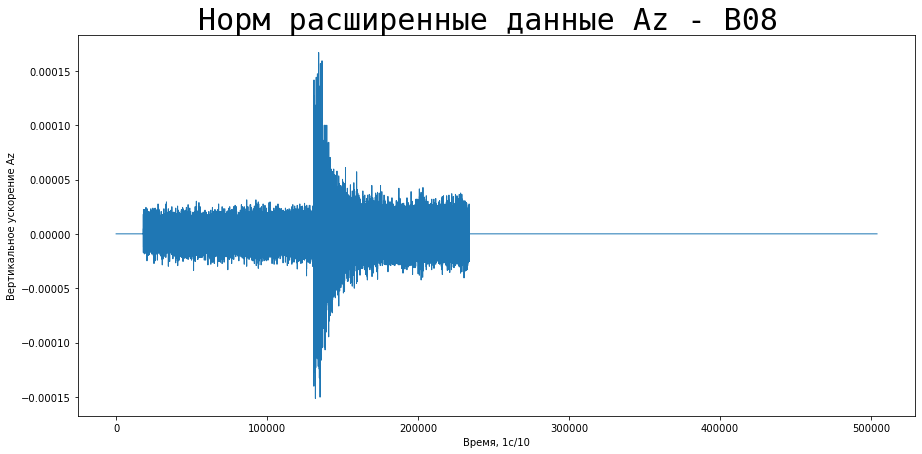

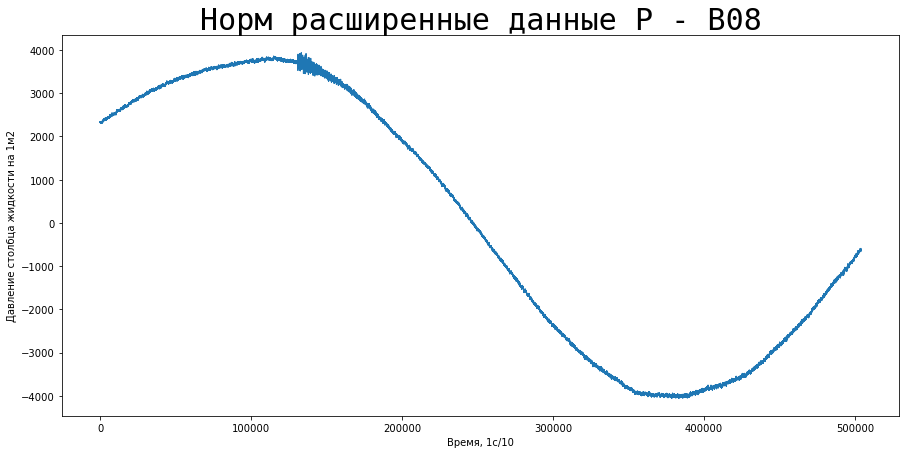

Введите промежуток начала колебаний: 125000


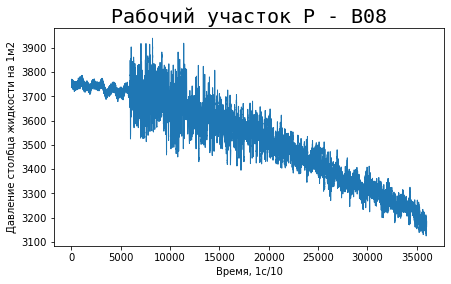

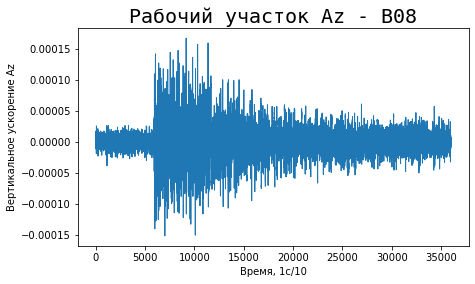

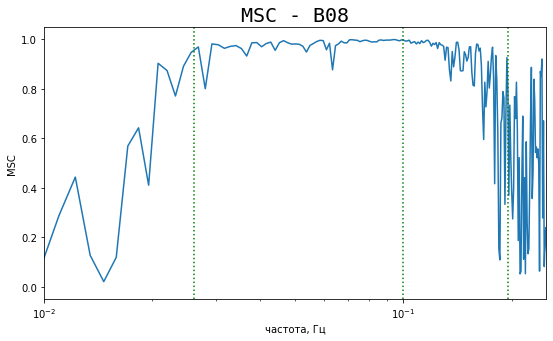

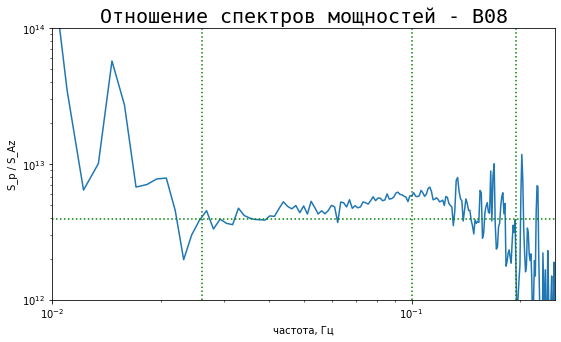

Доля хороших частот = 0.43333333333333335
Дельта = 0.1728771124943882


In [112]:
station_name = 'B08'
Az_path = 'az_metrics/201701221030_6h/M.KMB08.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMB08.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C09 - плохо (0.37, 0.44)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


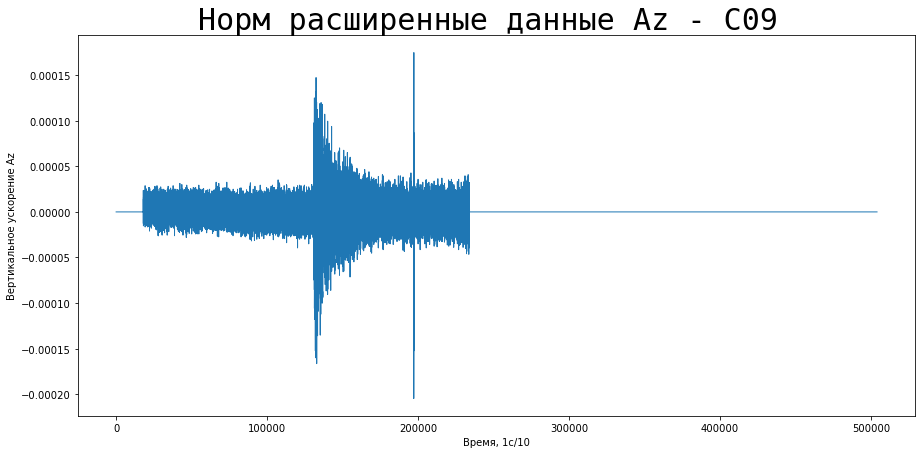

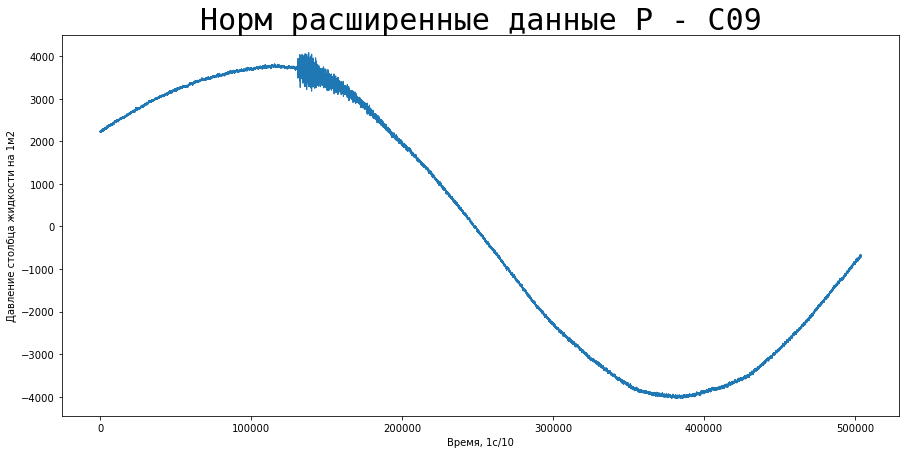

Введите промежуток начала колебаний: 125000


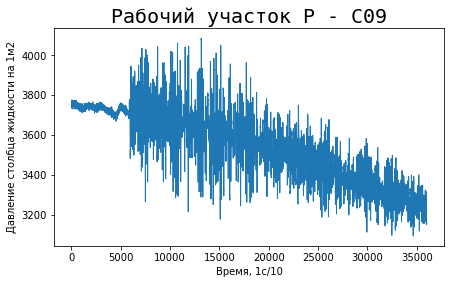

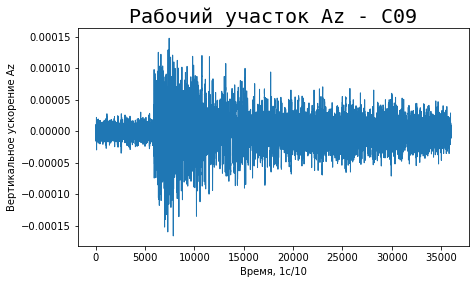

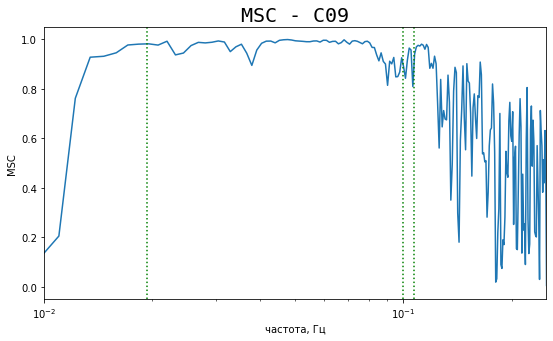

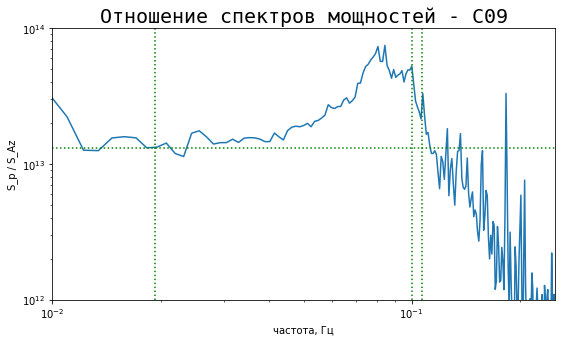

Доля хороших частот = 0.3787878787878788
Дельта = 0.4424899014129251


In [113]:
station_name = 'C09'
Az_path = 'az_metrics/201701221030_6h/M.KMC09.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMC09.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C10 - плохо (0.28, 0.60)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


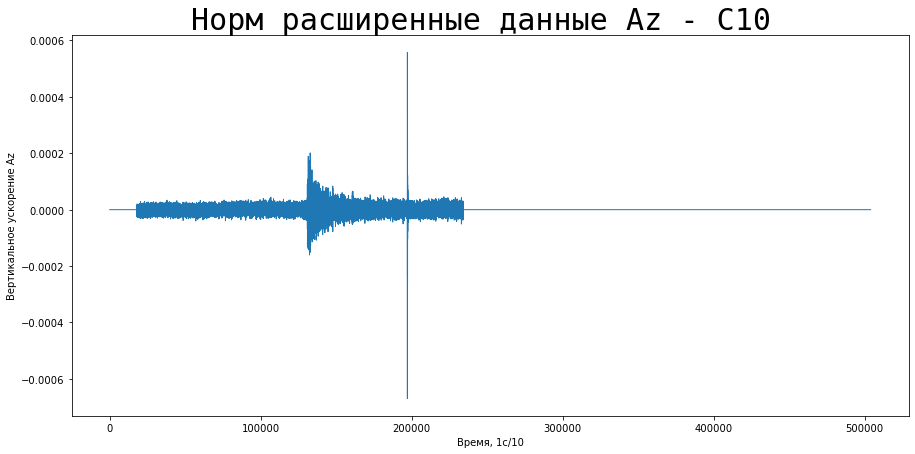

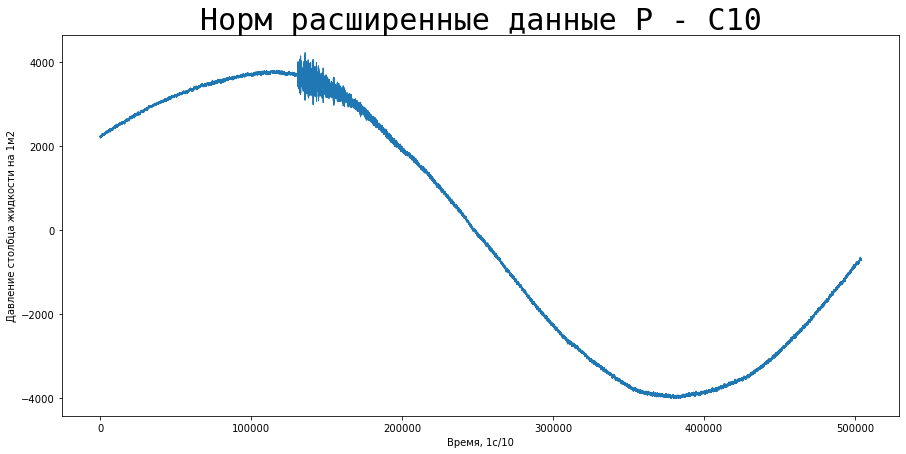

Введите промежуток начала колебаний: 125000


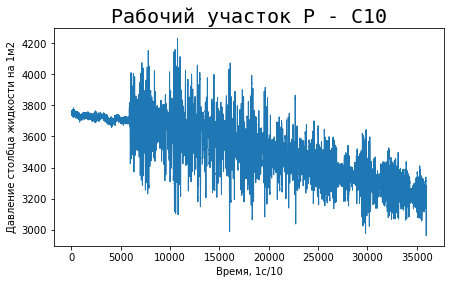

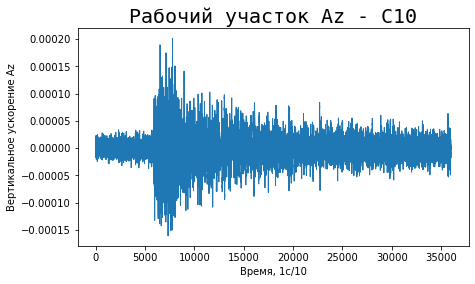

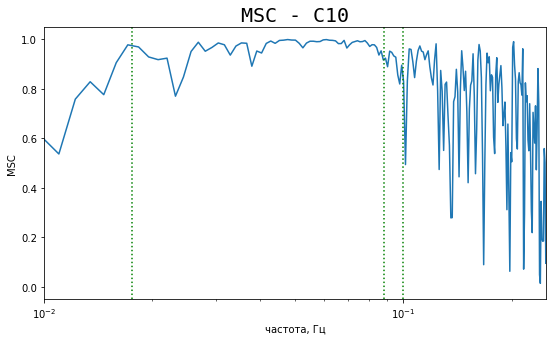

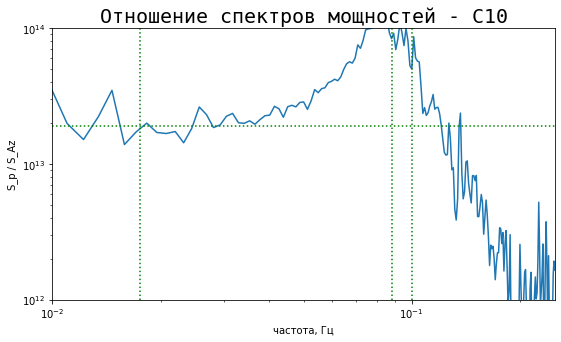

Доля хороших частот = 0.2835820895522388
Дельта = 0.5972287674804497


In [114]:
station_name = 'C10'
Az_path = 'az_metrics/201701221030_6h/M.KMC10.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMC10.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C11 - плохо (0.31, 0.58)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


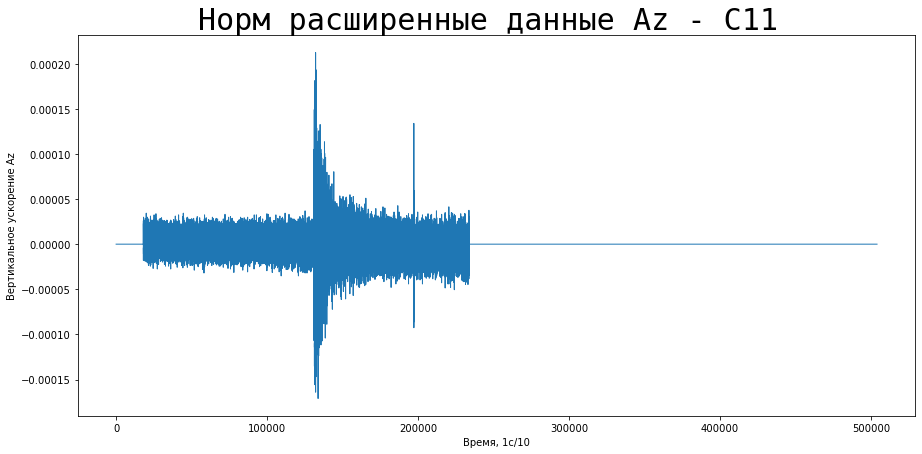

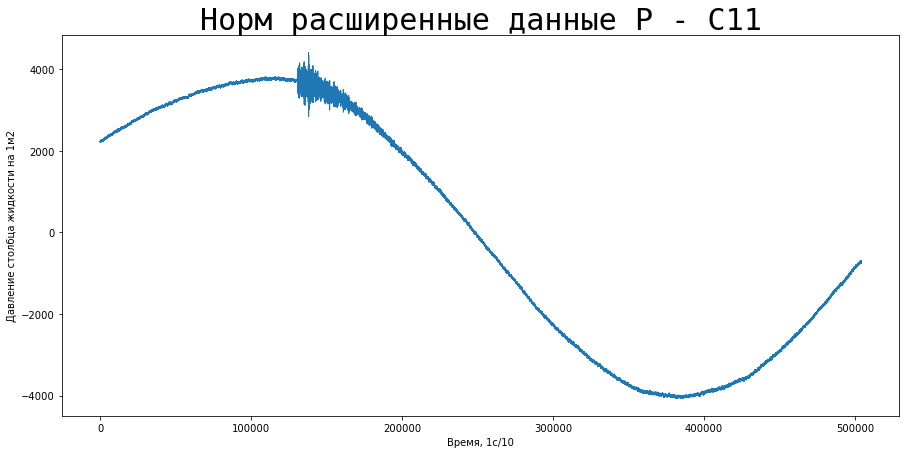

Введите промежуток начала колебаний: 125000


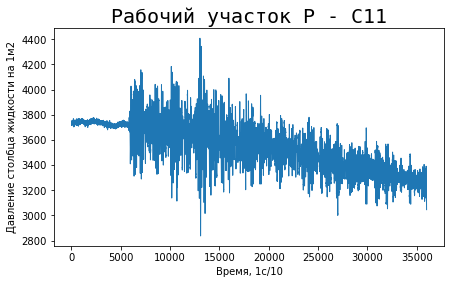

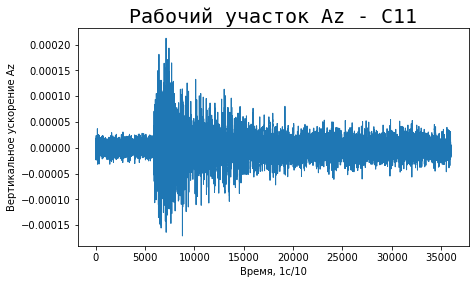

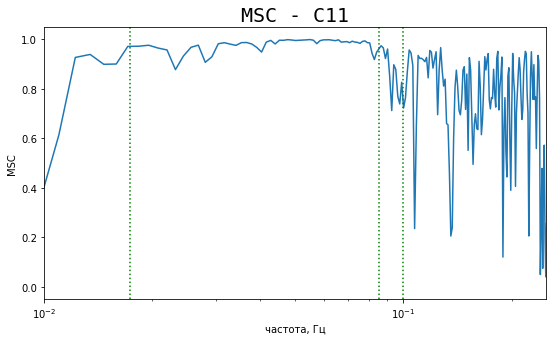

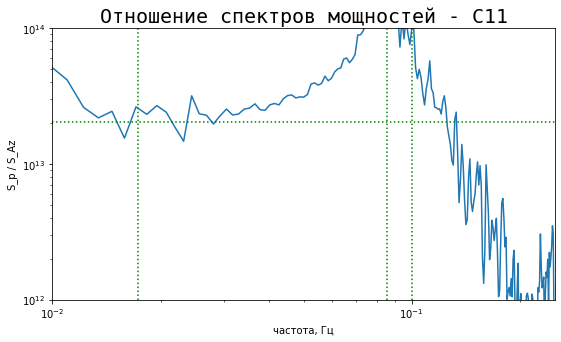

Доля хороших частот = 0.31343283582089554
Дельта = 0.5858619220900785


In [115]:
station_name = 'C11'
Az_path = 'az_metrics/201701221030_6h/M.KMC11.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMC11.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C12 - плохо (0.36, 0.59)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


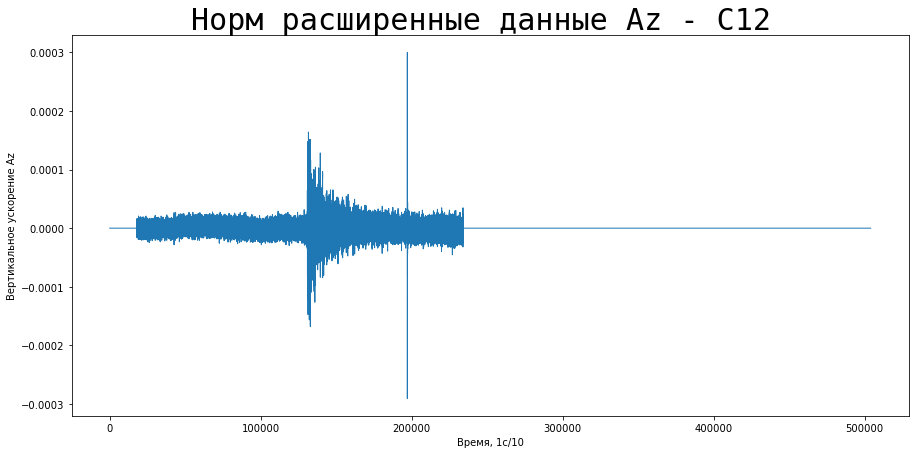

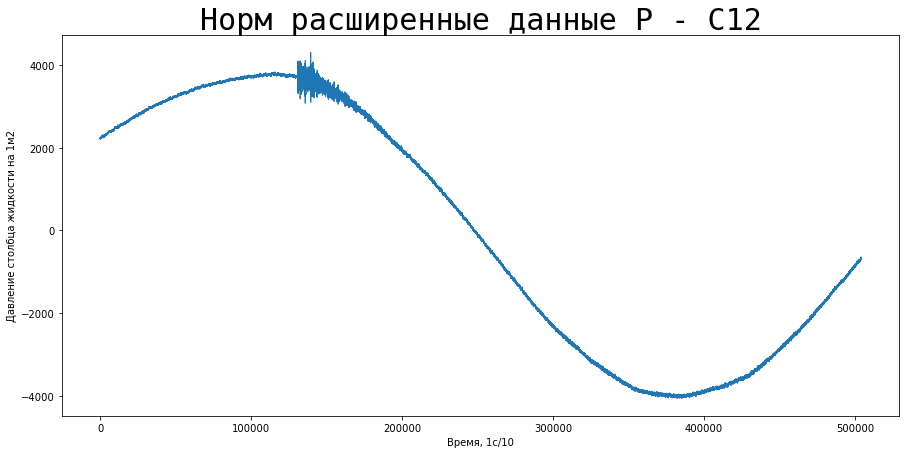

Введите промежуток начала колебаний: 125000


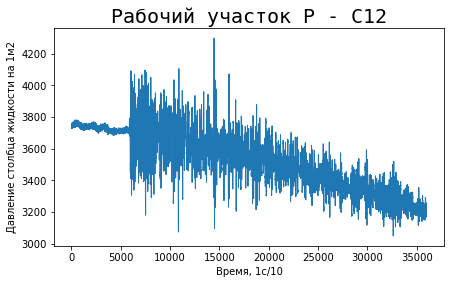

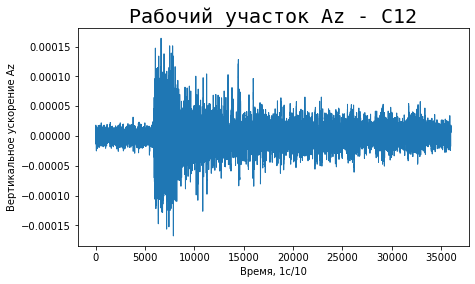

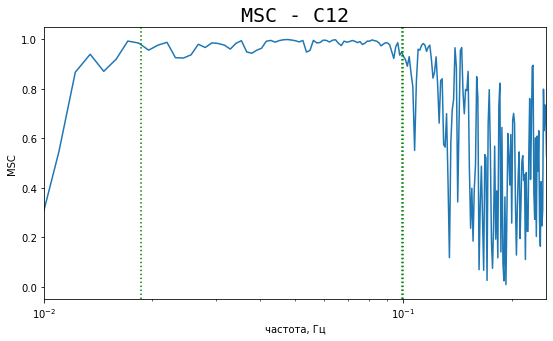

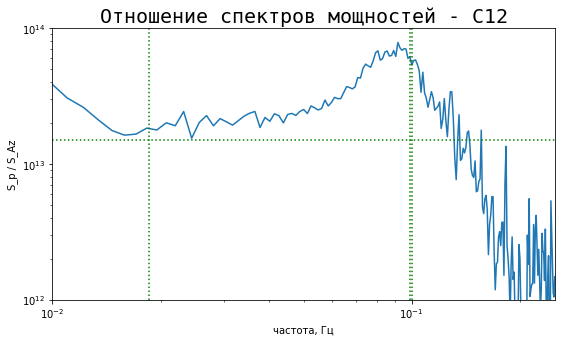

Доля хороших частот = 0.36363636363636365
Дельта = 0.580910424522266


In [116]:
station_name = 'C12'
Az_path = 'az_metrics/201701221030_6h/M.KMC12.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMC12.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D13 - неуд (0.05, 0.16)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


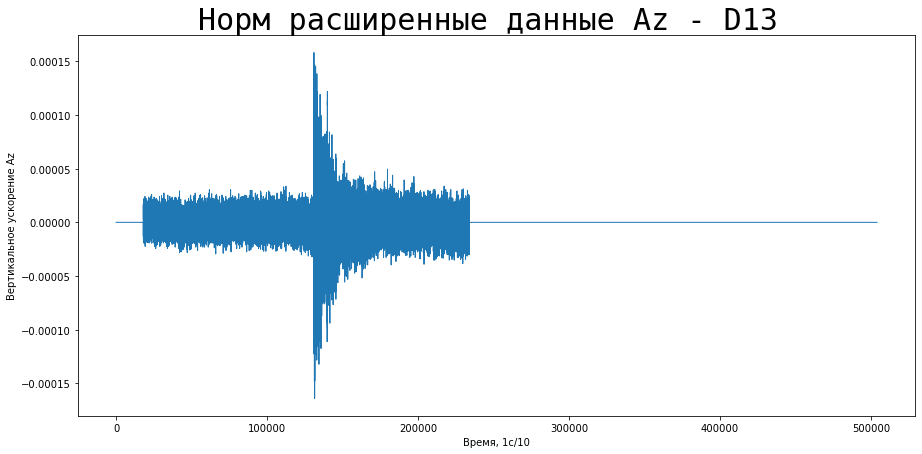

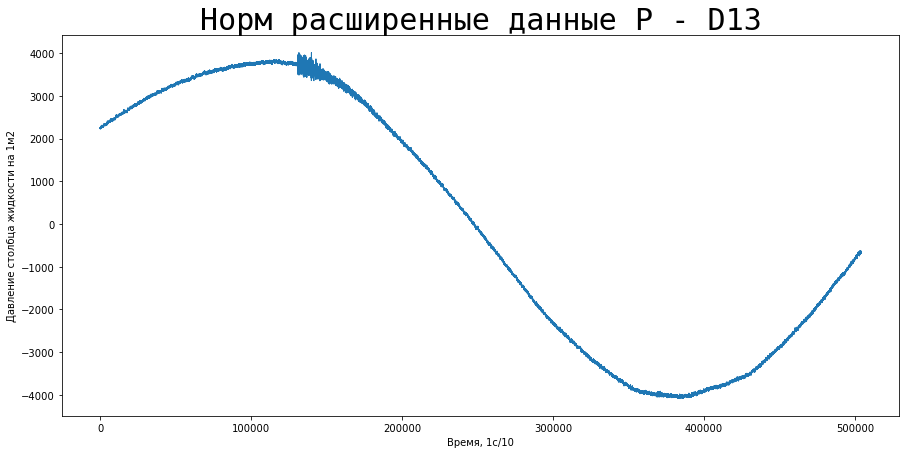

Введите промежуток начала колебаний: 125000


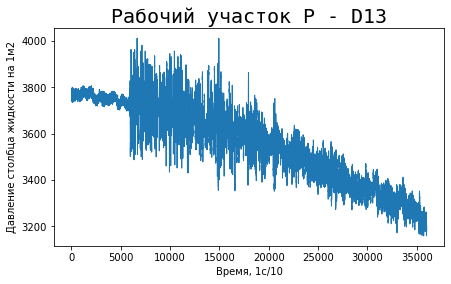

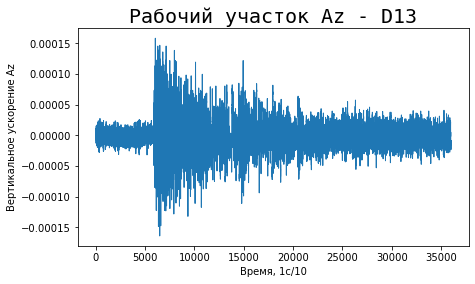

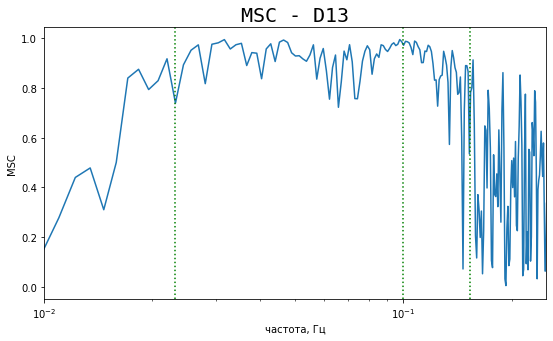

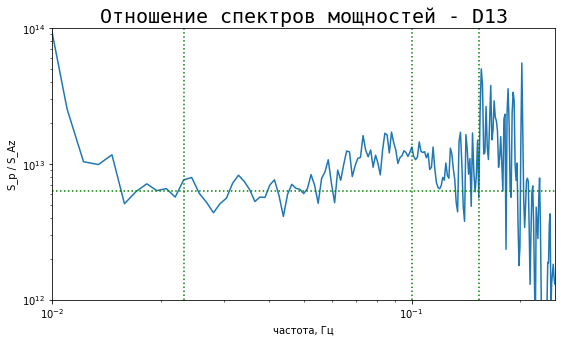

Доля хороших частот = 0.04838709677419355
Дельта = 0.1630705377966961


In [117]:
station_name = 'D13'
Az_path = 'az_metrics/201701221030_6h/M.KMD13.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMD13.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D14 - неуд (0.19, 0.22)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


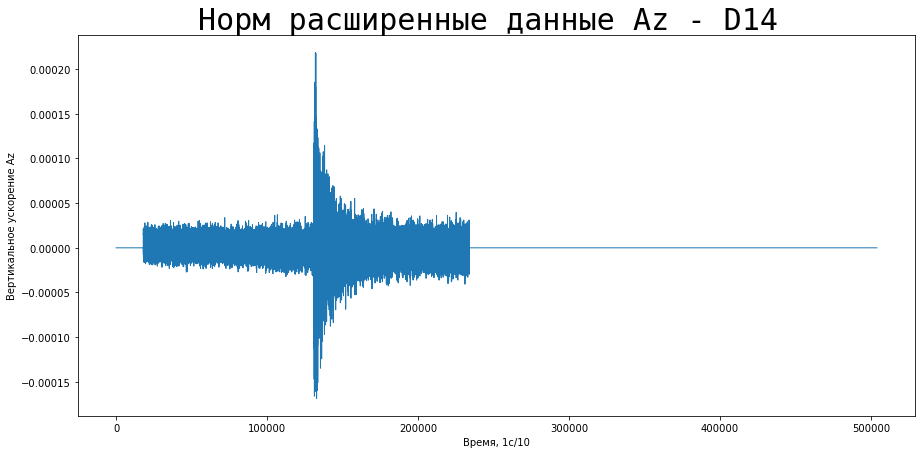

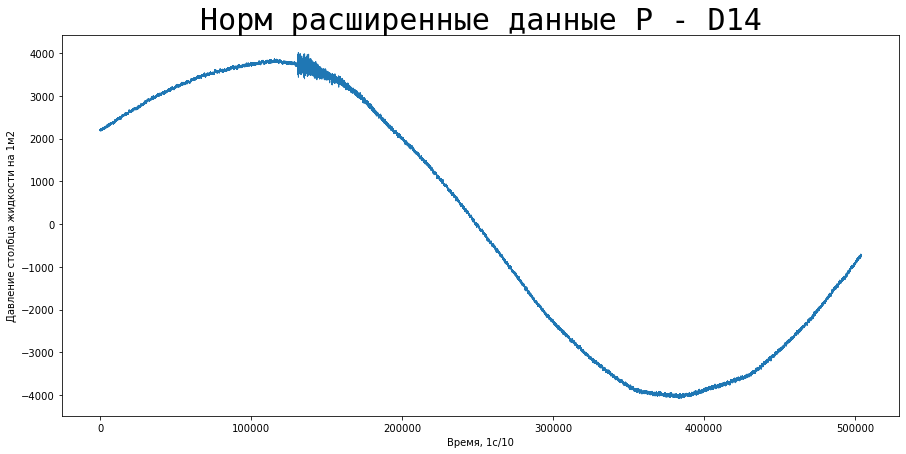

Введите промежуток начала колебаний: 125000


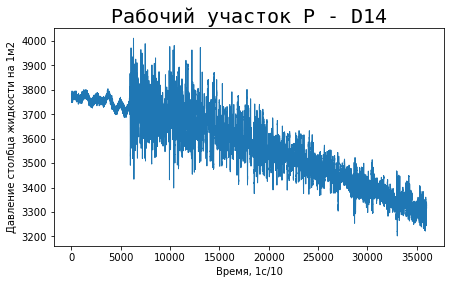

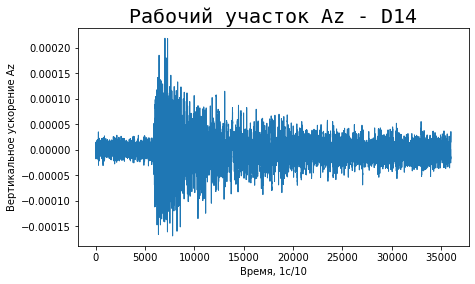

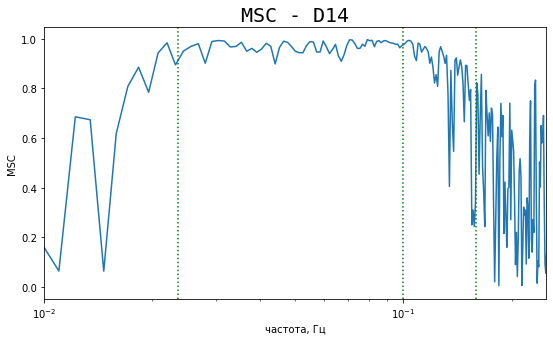

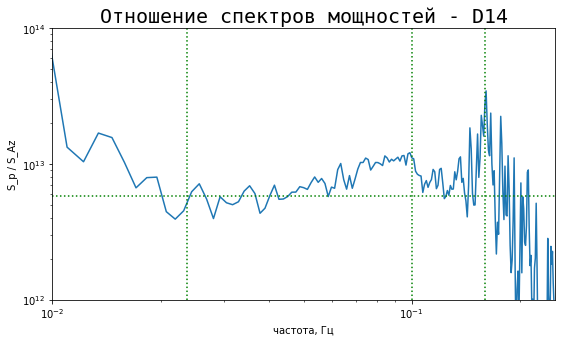

Доля хороших частот = 0.1935483870967742
Дельта = 0.22509213450941323


In [118]:
station_name = 'D14'
Az_path = 'az_metrics/201701221030_6h/M.KMD14.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMD14.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D15 - отлично (0.60, 0.09)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


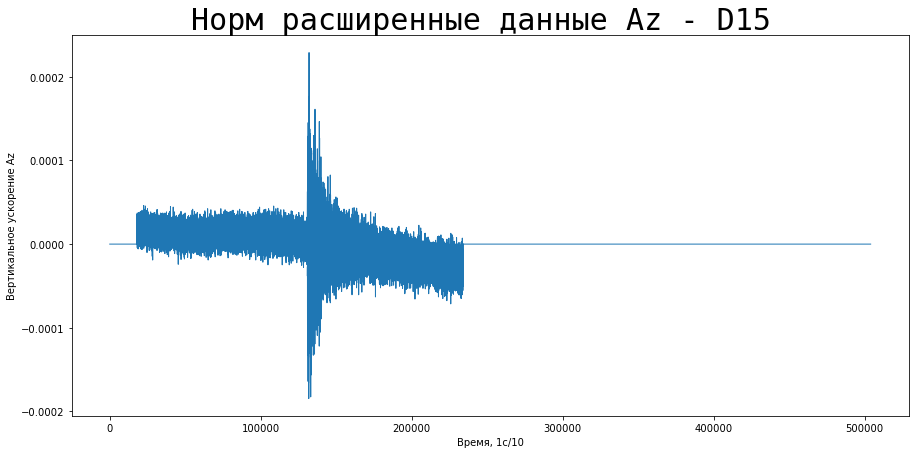

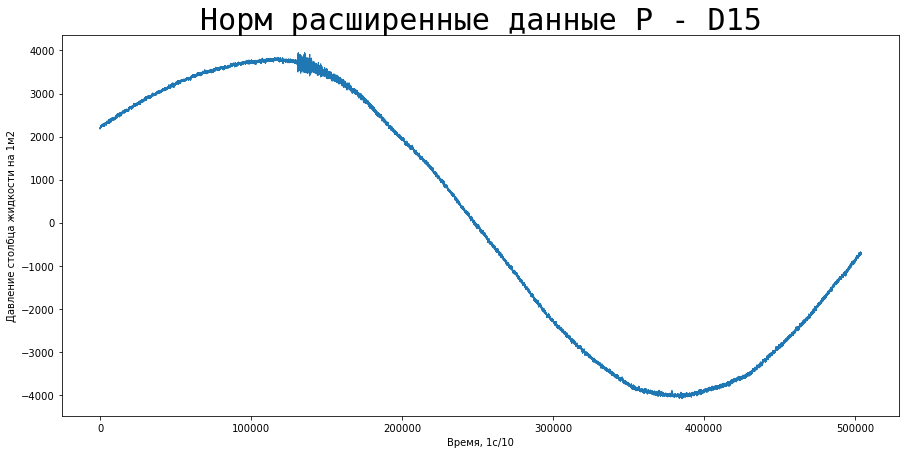

Введите промежуток начала колебаний: 125000


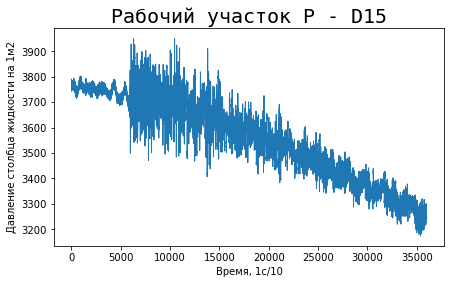

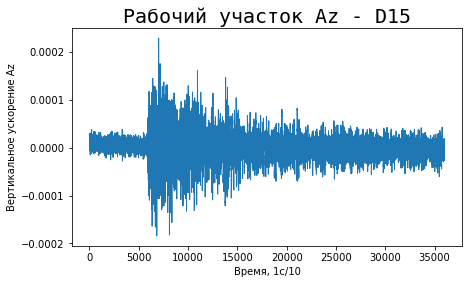

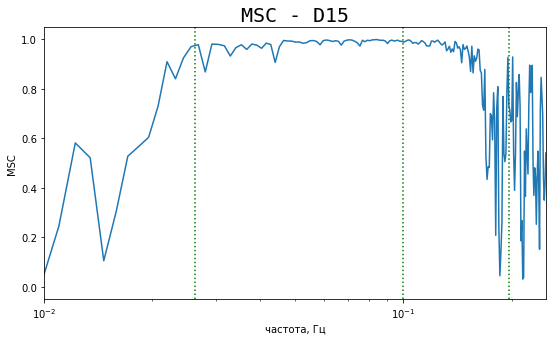

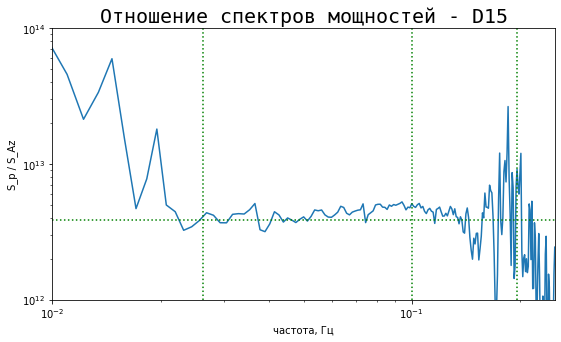

Доля хороших частот = 0.6
Дельта = 0.09137373601151566


In [119]:
station_name = 'D15'
Az_path = 'az_metrics/201701221030_6h/M.KMD15.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMD15.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D16 - хорошо (0.51, 0.17)

Время начала измерений: (10, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


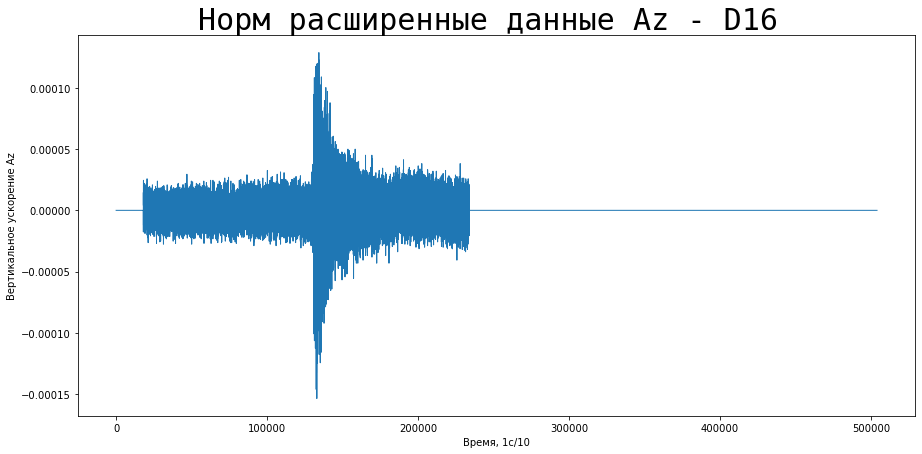

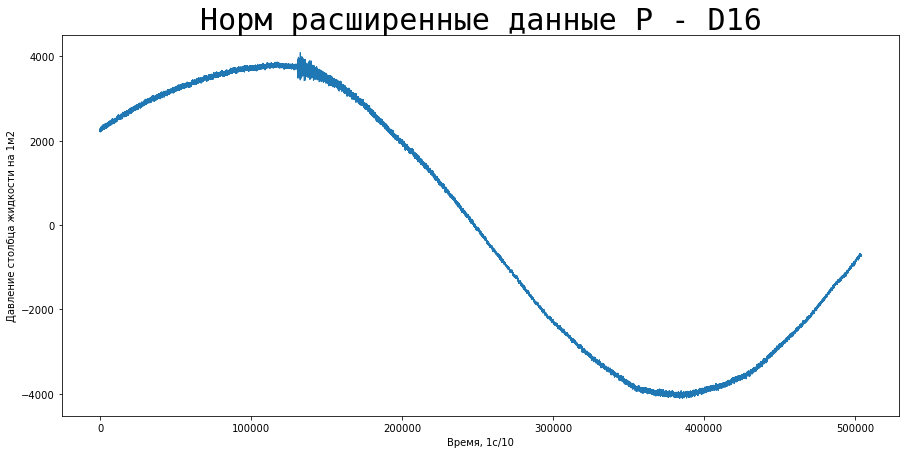

Введите промежуток начала колебаний: 125000


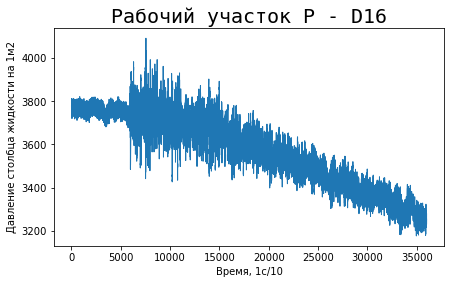

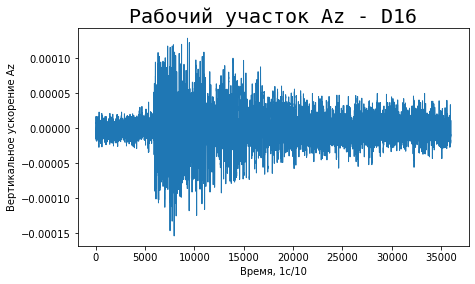

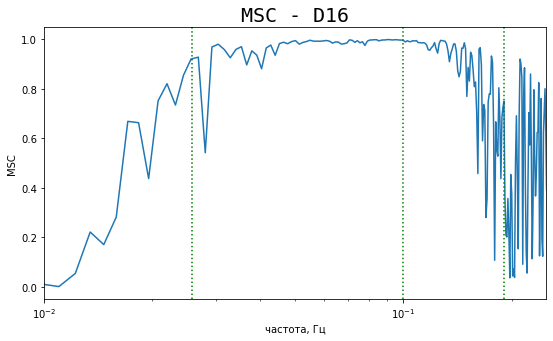

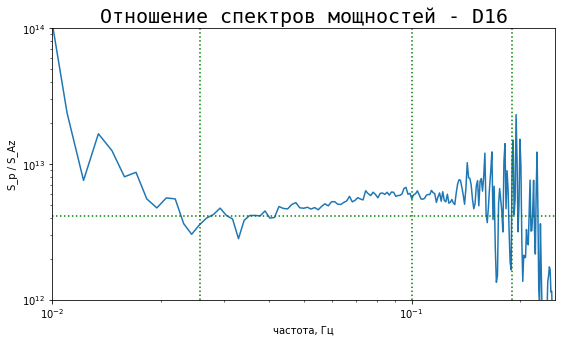

Доля хороших частот = 0.5166666666666667
Дельта = 0.17085205250143254


In [120]:
station_name = 'D16'
Az_path = 'az_metrics/201701221030_6h/M.KMD16.ZL.10Hz.asc'
P_path = 'p_metrics/201701221000_14h/M.KMD16.Pr'
P_time_start = 10, 0
P_time_stop = 24, 0
Az_time_start = 10, 30
Az_time_stop = 16, 30

height = dict_of_depths[station_name]
develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

# 2018-01-23
- P_time_start = 13, 0
- P_time_stop = 24, 0
- Az_time_start = 15, 35
- Az_time_stop = 21, 35

## A01 - отлично (1.00, 0.09)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


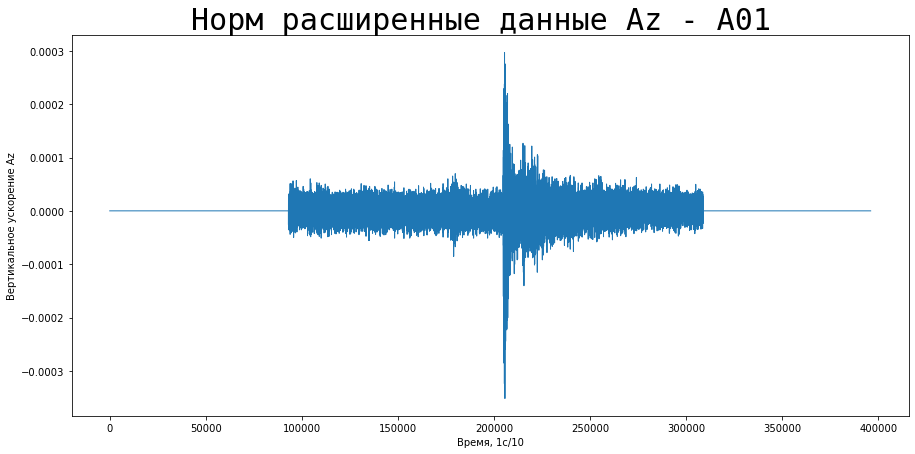

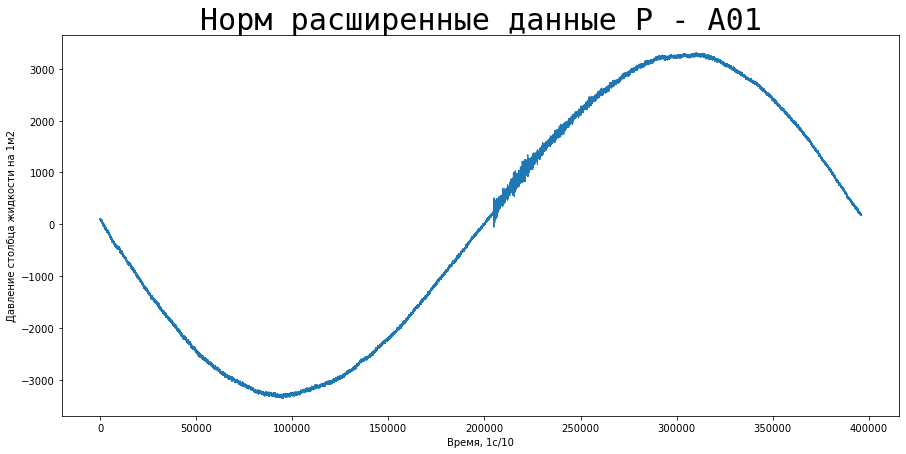

Введите промежуток начала колебаний: 200000


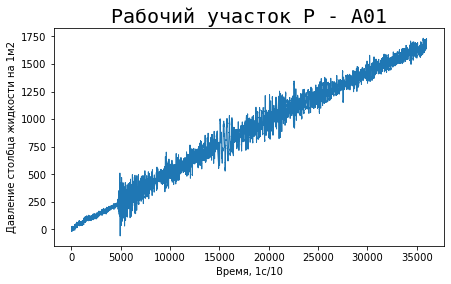

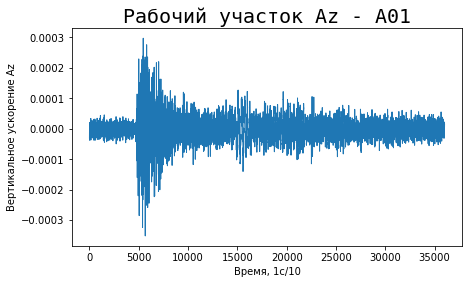

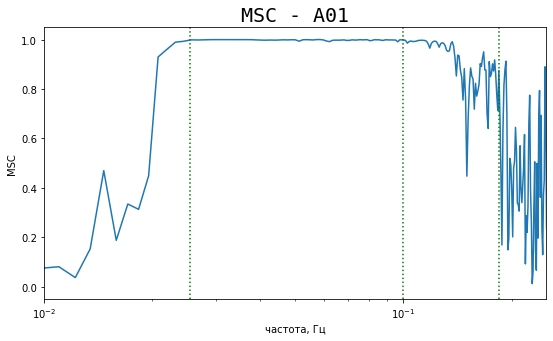

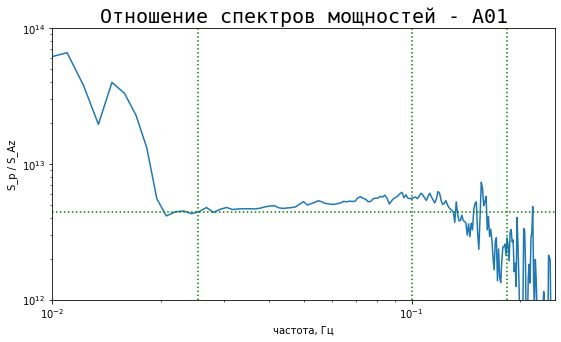

Доля хороших частот = 1.0
Дельта = 0.0863541257915117


In [121]:
station_name = 'A01'
height = 2039
Az_path = 'az_metrics/201801231535_6h/M.KMA01.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMA01.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A02 - хорошо (0.96, 0.11)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


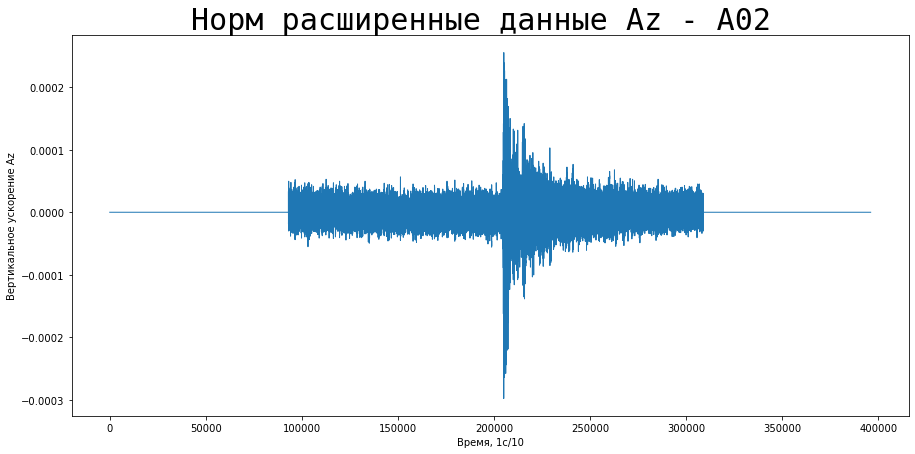

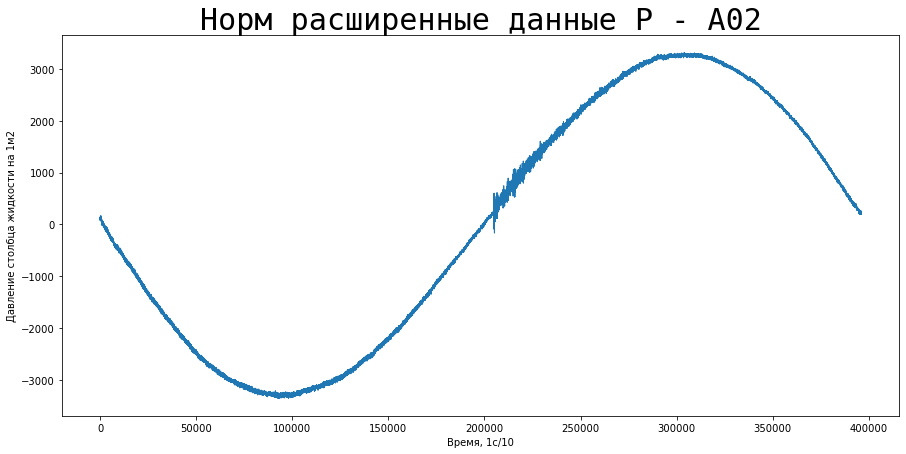

Введите промежуток начала колебаний: 200000


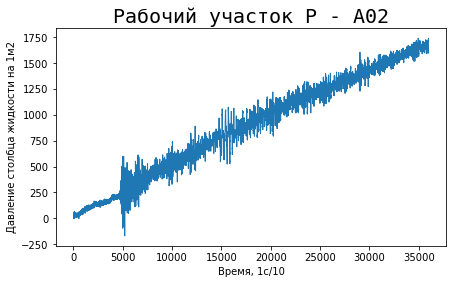

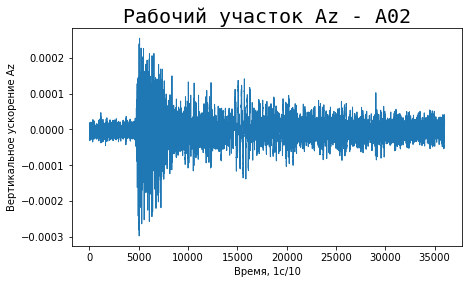

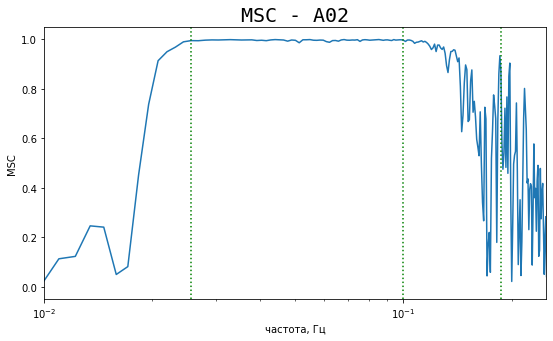

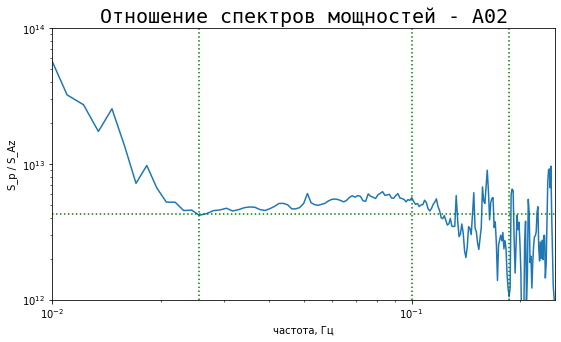

Доля хороших частот = 0.9672131147540983
Дельта = 0.10639448132323026


In [122]:
station_name = 'A02'
height = 2011
Az_path = 'az_metrics/201801231535_6h/M.KMA02.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMA02.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A03 - отлично (0.60, 0.04)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


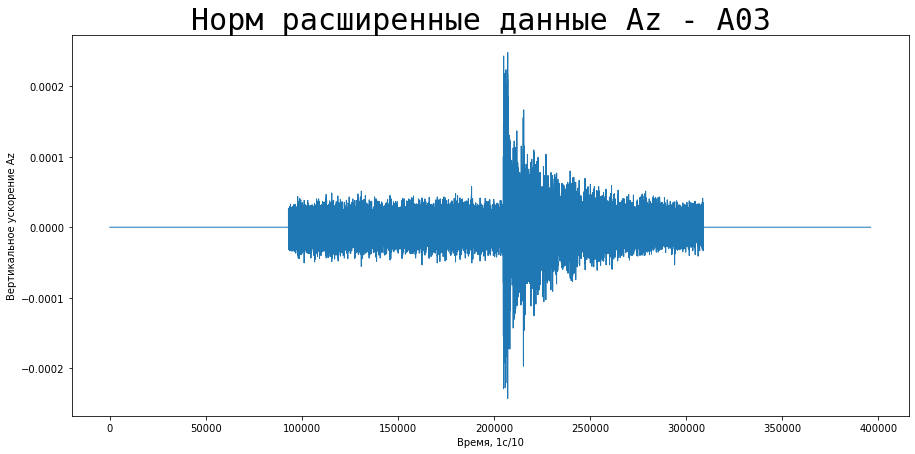

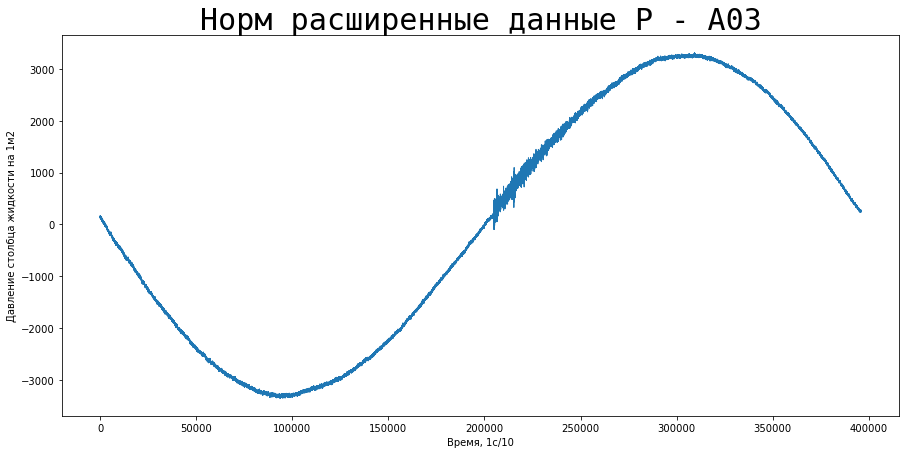

Введите промежуток начала колебаний: 200000


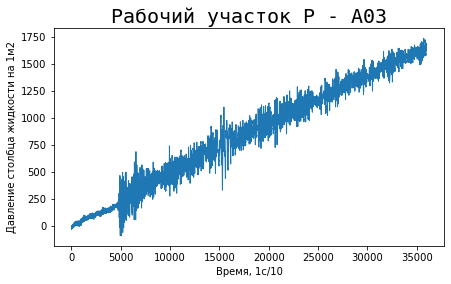

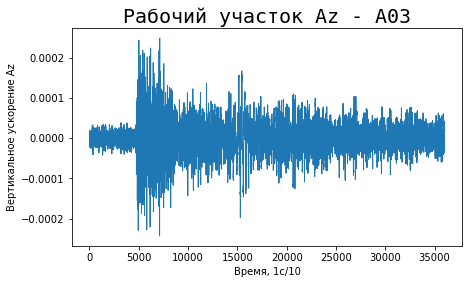

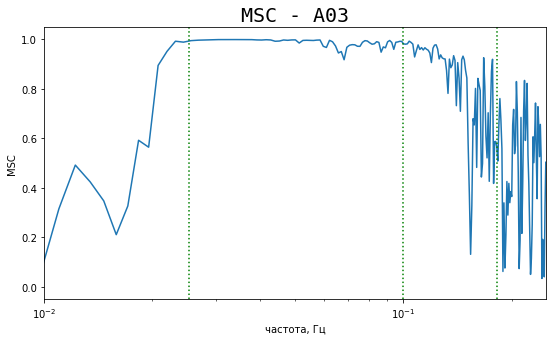

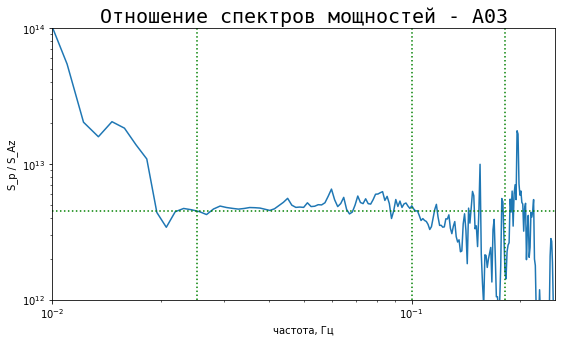

Доля хороших частот = 0.6065573770491803
Дельта = 0.04433111943947399


In [123]:
station_name = 'A03'
height = 2063
Az_path = 'az_metrics/201801231535_6h/M.KMA03.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMA03.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A04 - хорошо (0.95, 0.12)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


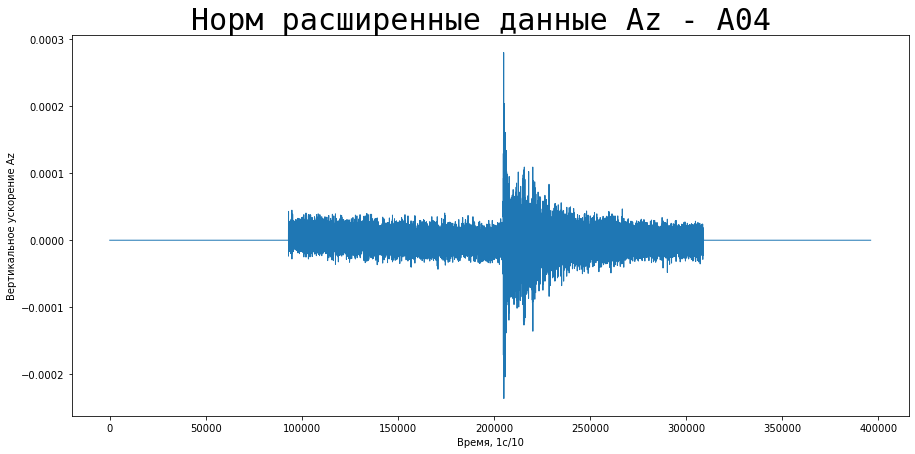

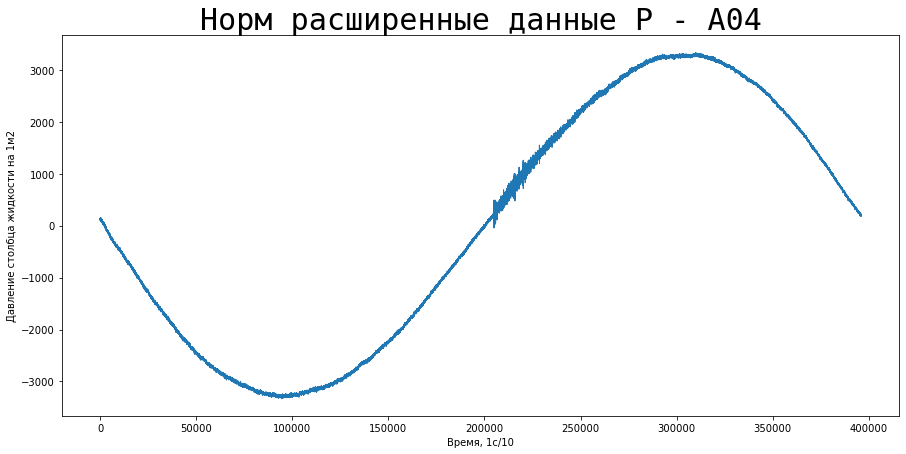

Введите промежуток начала колебаний: 200000


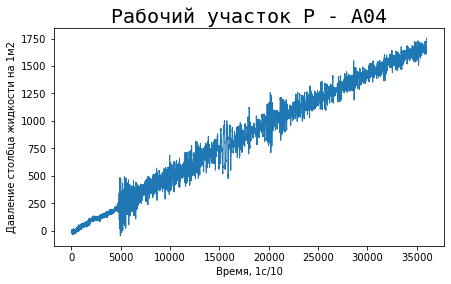

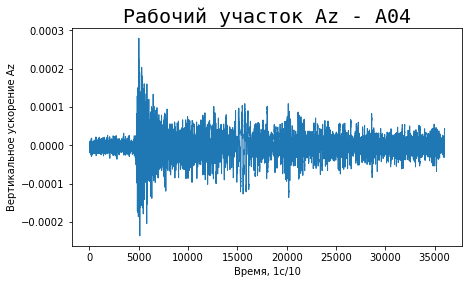

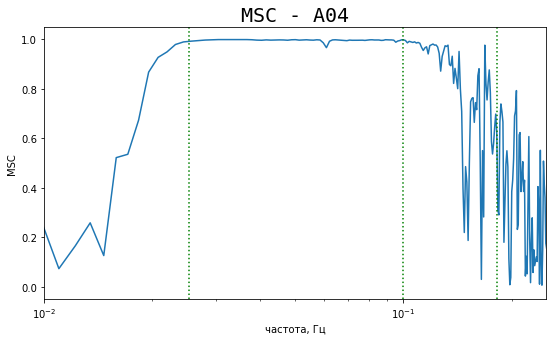

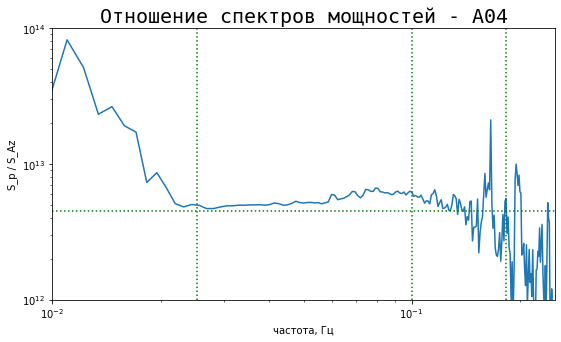

Доля хороших частот = 0.9508196721311475
Дельта = 0.11505281677378276


In [124]:
station_name = 'A04'
height = 2054
Az_path = 'az_metrics/201801231535_6h/M.KMA04.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMA04.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B05 - хорошо (0.63, 0.12)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


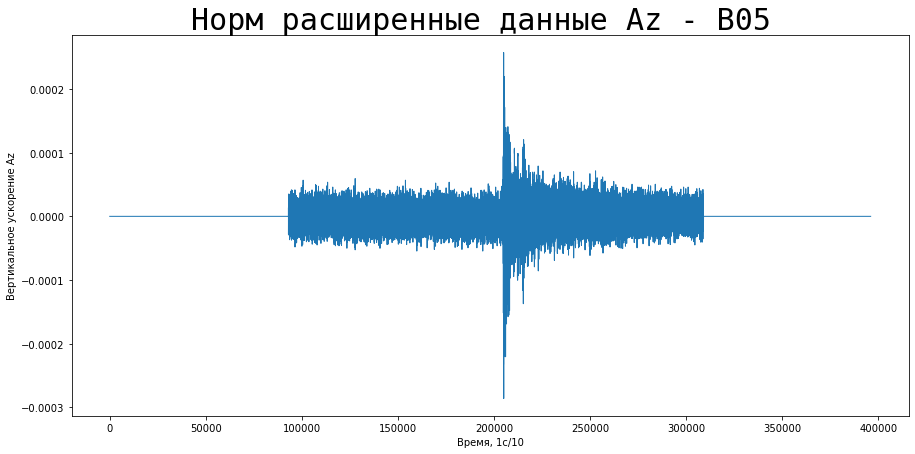

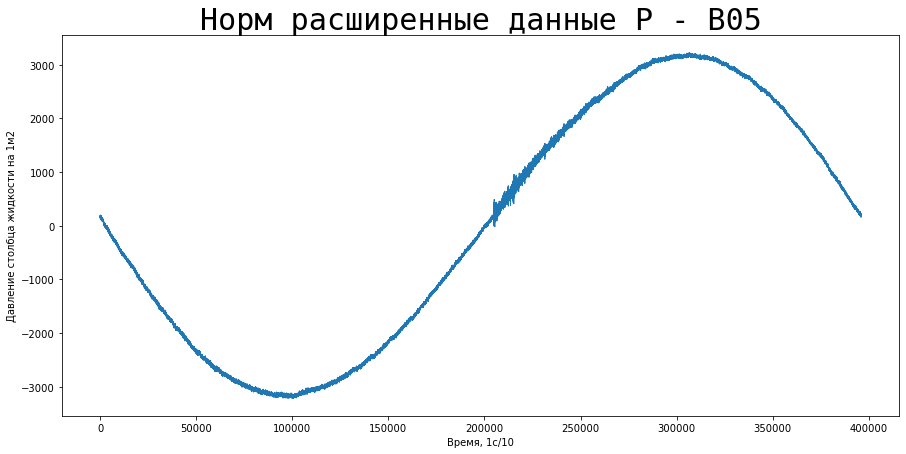

Введите промежуток начала колебаний: 200000


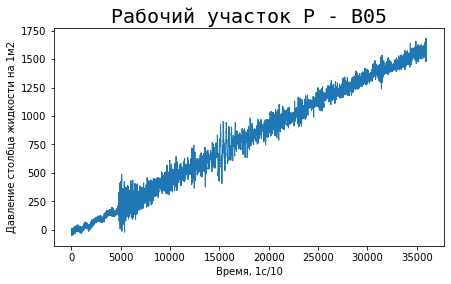

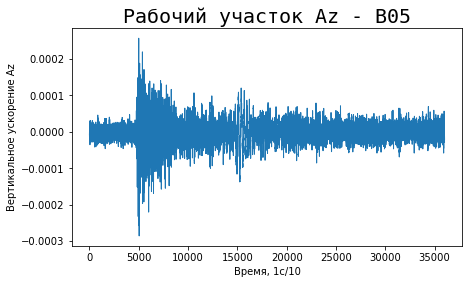

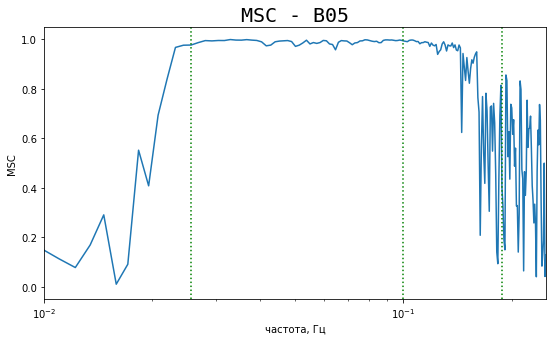

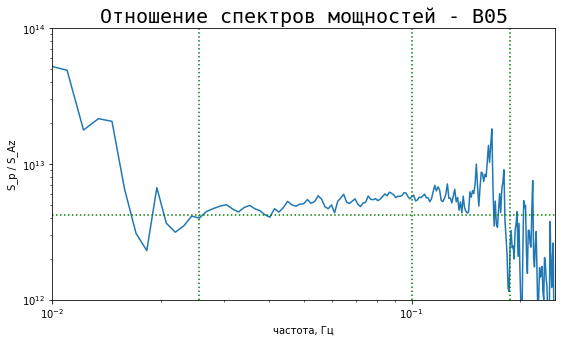

Доля хороших частот = 0.6333333333333333
Дельта = 0.1184197751948477


In [125]:
station_name = 'B05'
height = 1998
Az_path = 'az_metrics/201801231535_6h/M.KMB05.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMB05.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B06 - неуд (0.08, 0.26)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


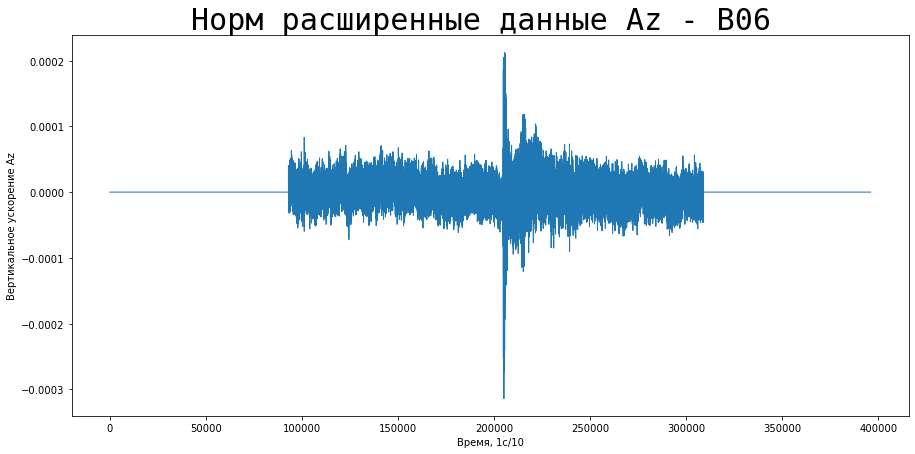

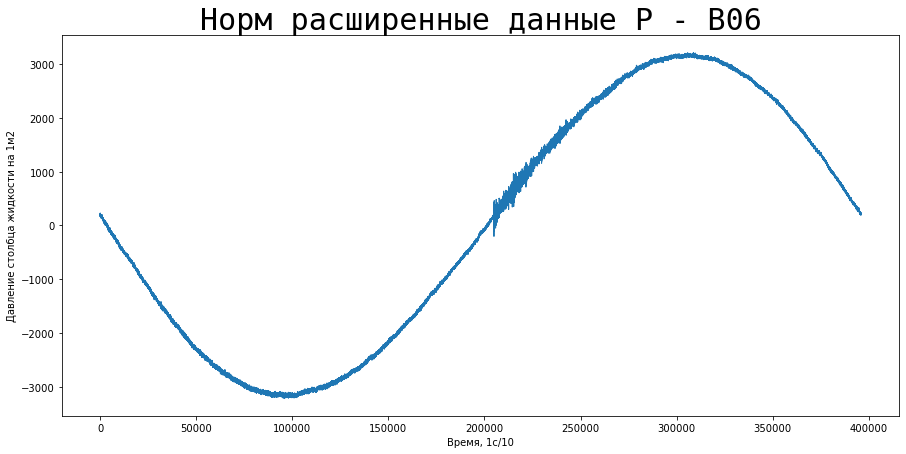

Введите промежуток начала колебаний: 200000


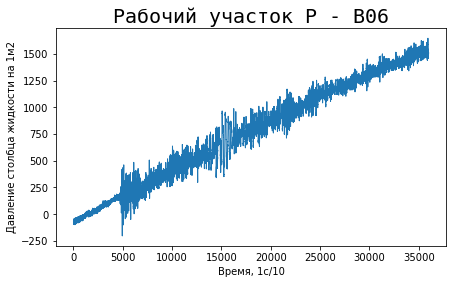

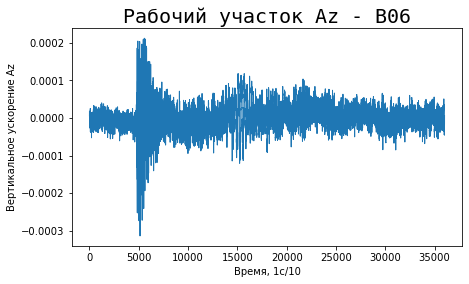

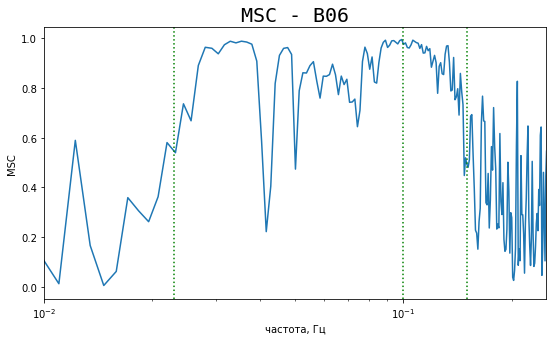

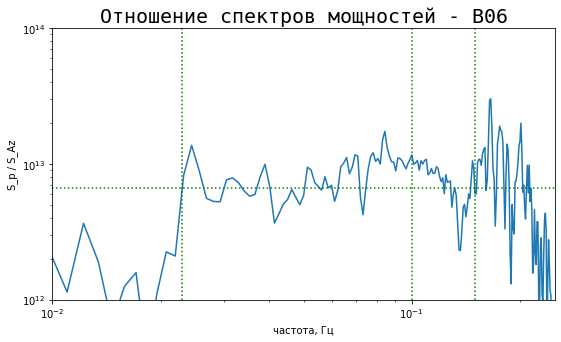

Доля хороших частот = 0.07936507936507936
Дельта = 0.26144767929956836


In [126]:
station_name = 'B06'
height = 2499
Az_path = 'az_metrics/201801231535_6h/M.KMB06.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMB06.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B07 - неуд (0.18, 0.05)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


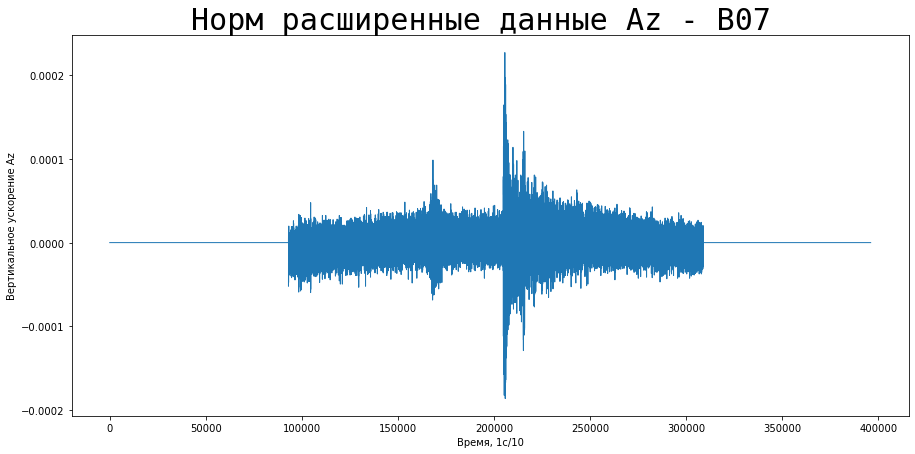

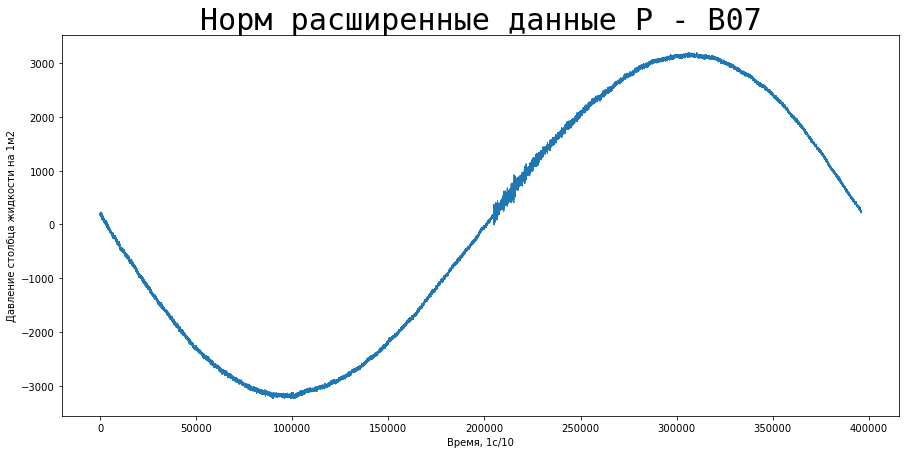

Введите промежуток начала колебаний: 200000


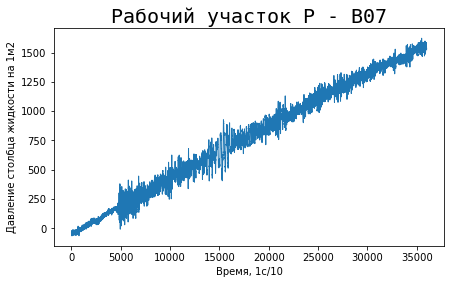

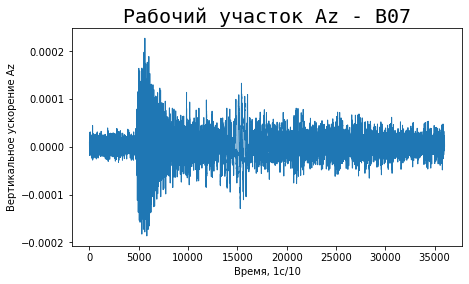

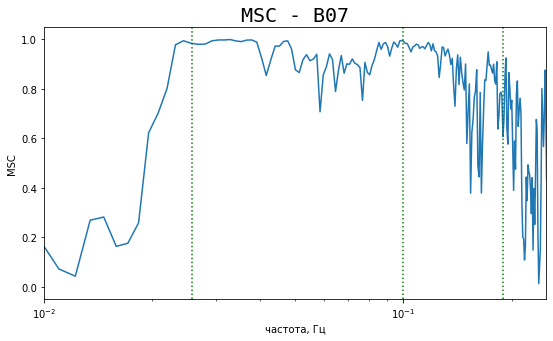

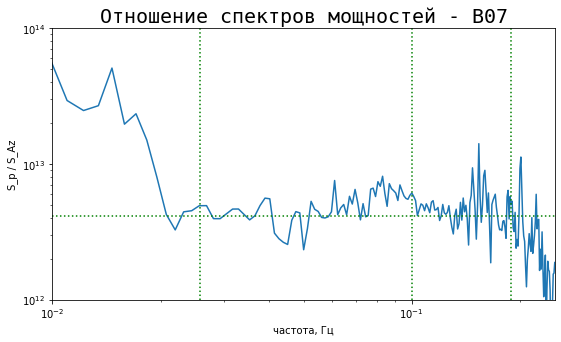

Доля хороших частот = 0.18333333333333332
Дельта = 0.05183264561372103


In [127]:
station_name = 'B07'
height = 1980
Az_path = 'az_metrics/201801231535_6h/M.KMB07.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMB07.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B08 - хорошо (0.45, 0.11)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


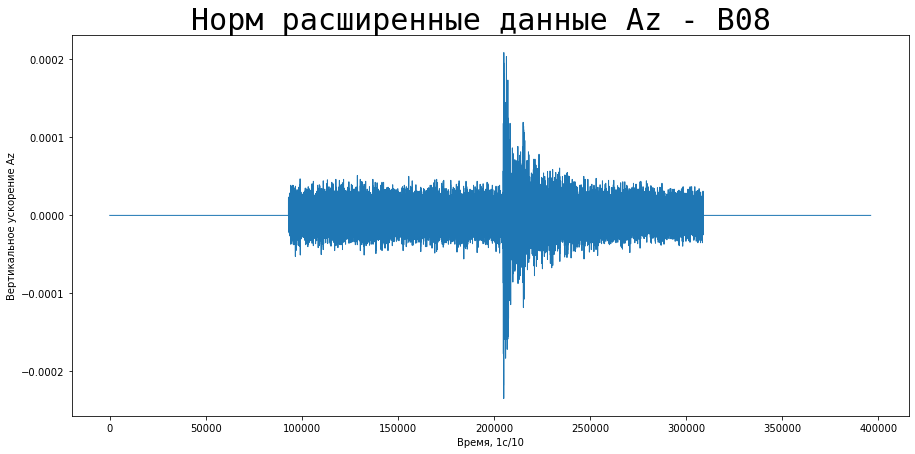

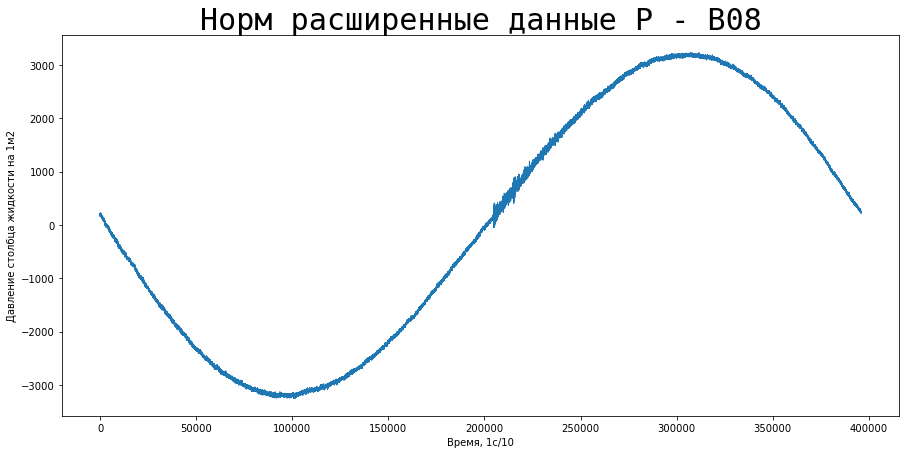

Введите промежуток начала колебаний: 200000


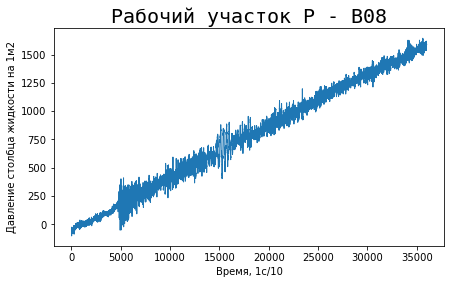

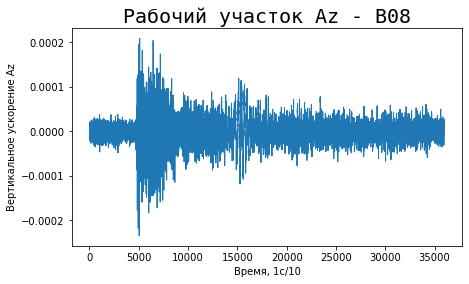

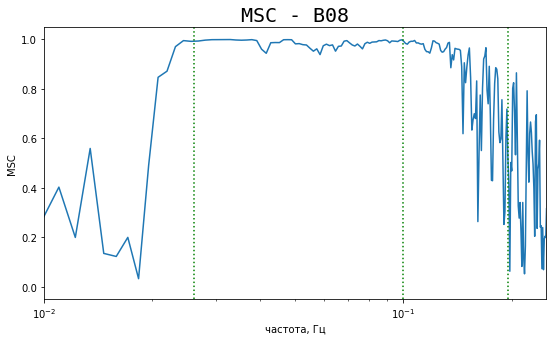

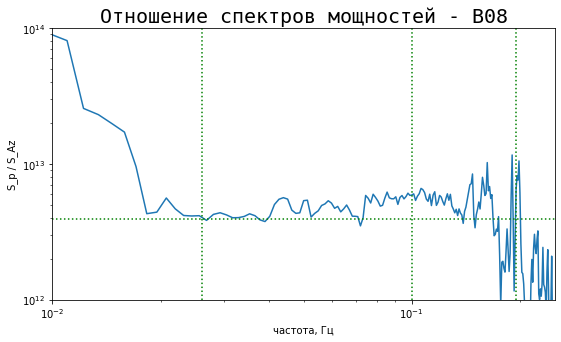

Доля хороших частот = 0.45
Дельта = 0.10608057893756229


In [128]:
station_name = 'B08'
height = 1924
Az_path = 'az_metrics/201801231535_6h/M.KMB08.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMB08.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C09 - норм (0.38, 0.27)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


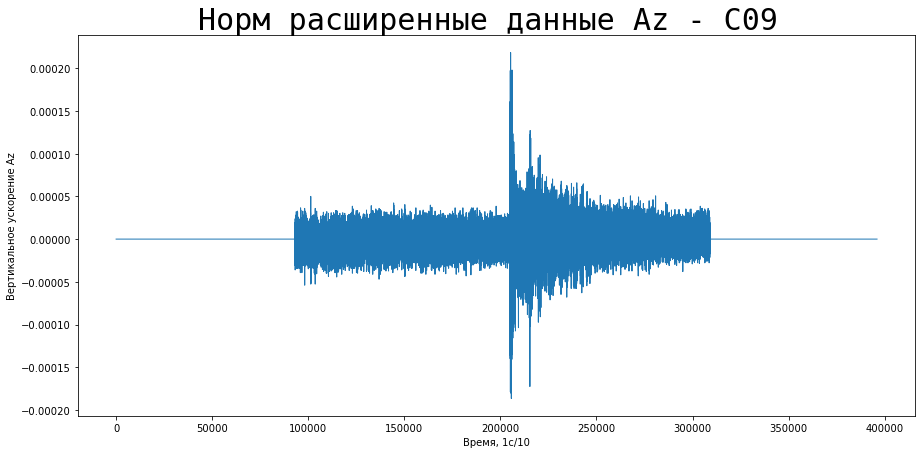

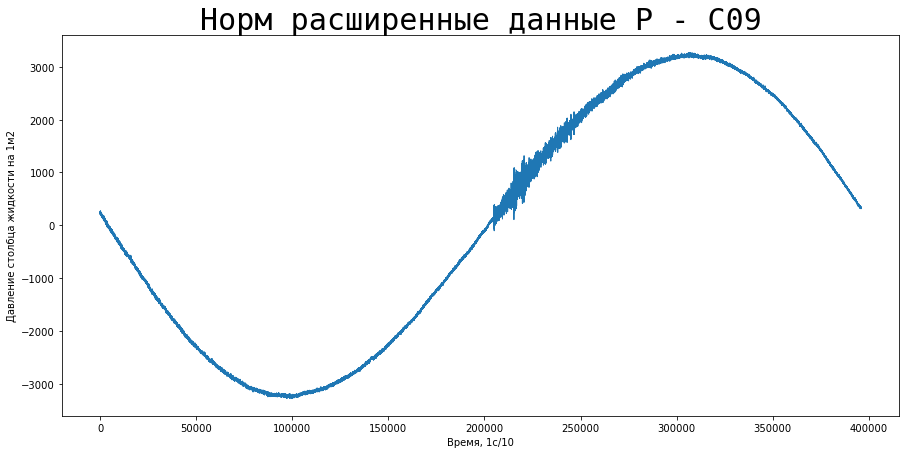

Введите промежуток начала колебаний: 200000


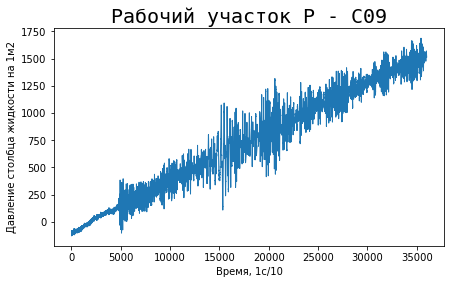

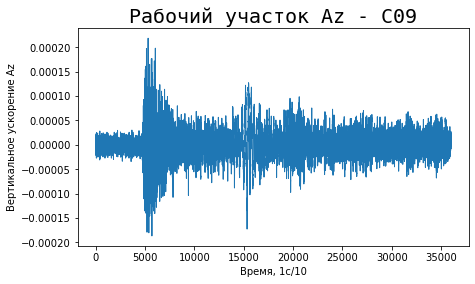

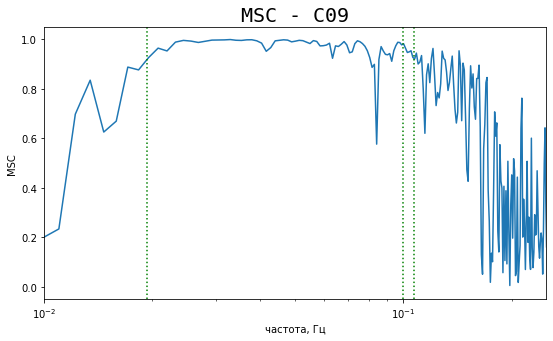

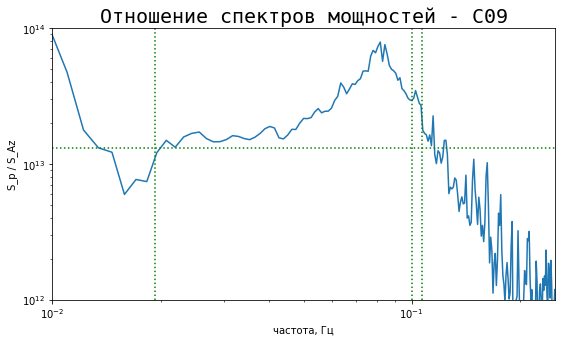

Доля хороших частот = 0.3787878787878788
Дельта = 0.27241446701175076


In [129]:
station_name = 'C09'
height = 3511
Az_path = 'az_metrics/201801231535_6h/M.KMC09.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMC09.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C10 - плохо (0.33, 0.35)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


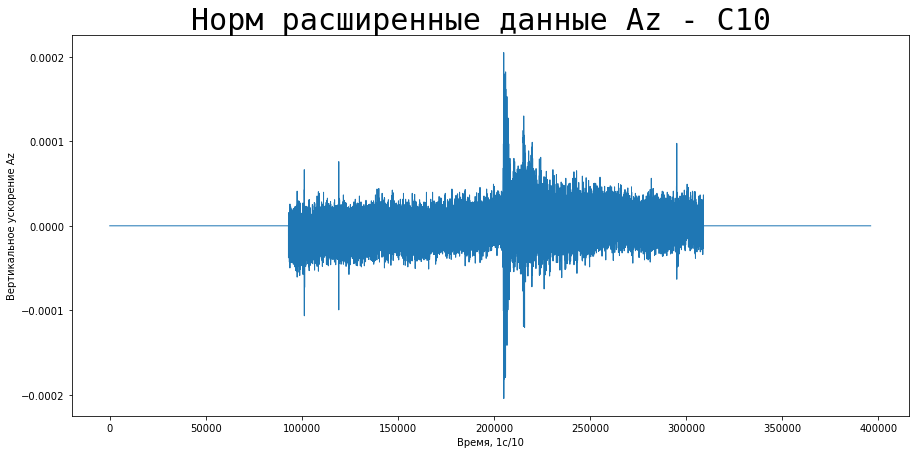

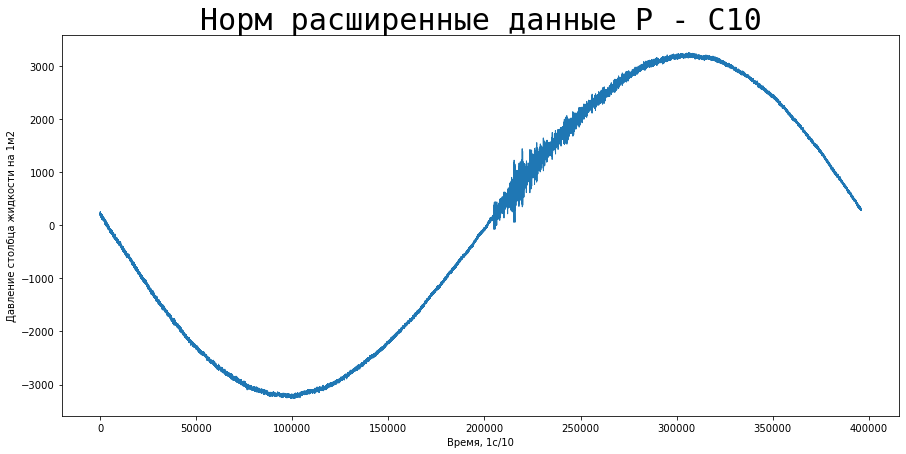

Введите промежуток начала колебаний: 200000


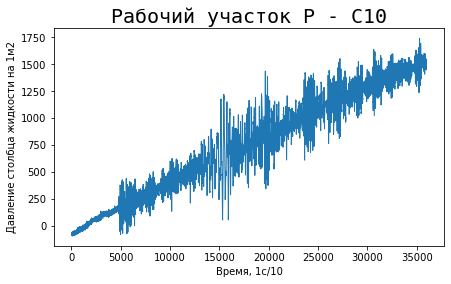

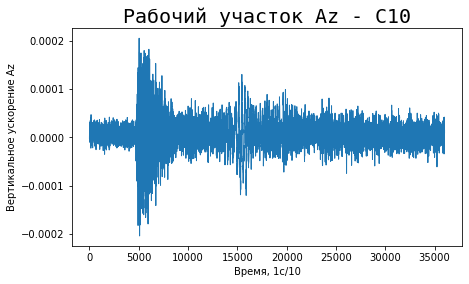

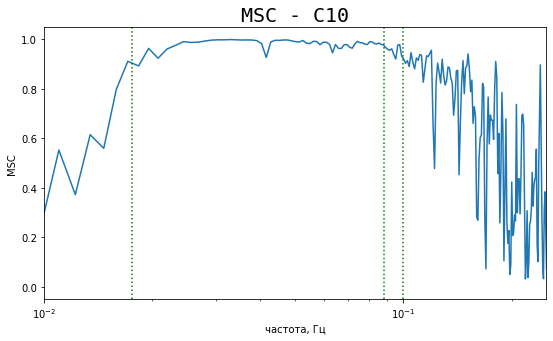

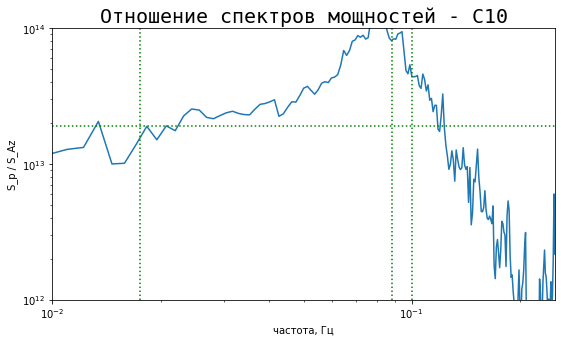

Доля хороших частот = 0.3283582089552239
Дельта = 0.3450270998750029


In [130]:
station_name = 'C10'
height = 4247
Az_path = 'az_metrics/201801231535_6h/M.KMC10.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMC10.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C11 - плохо (0.37, 0.36)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


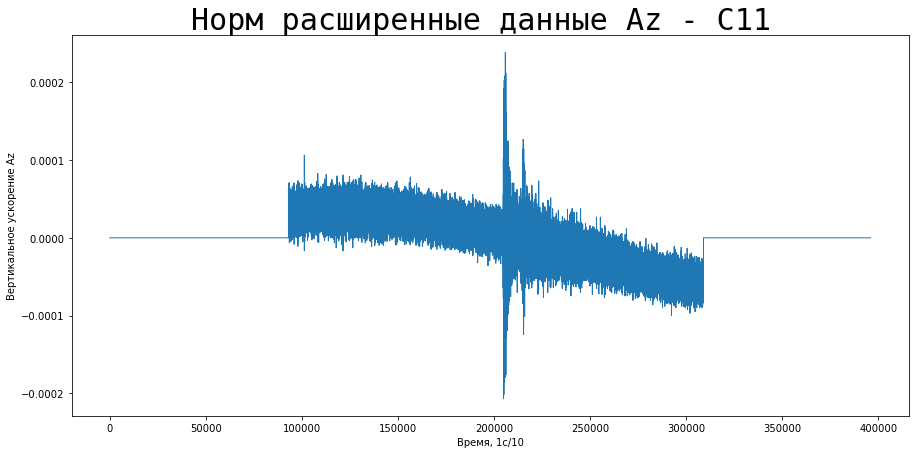

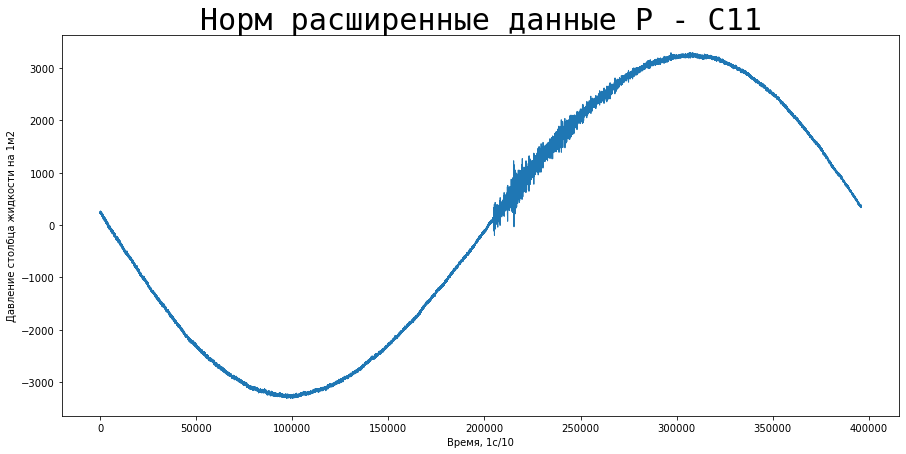

Введите промежуток начала колебаний: 200000


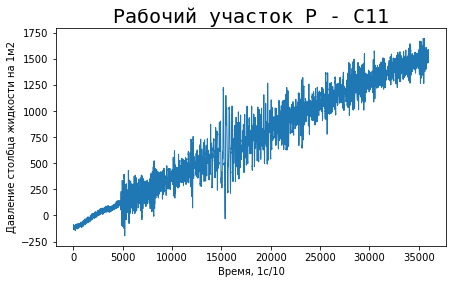

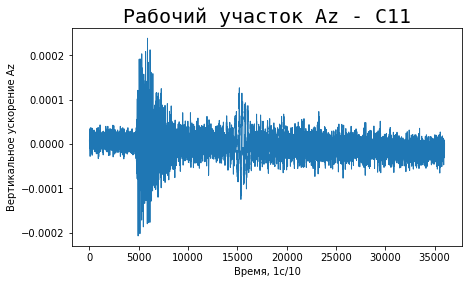

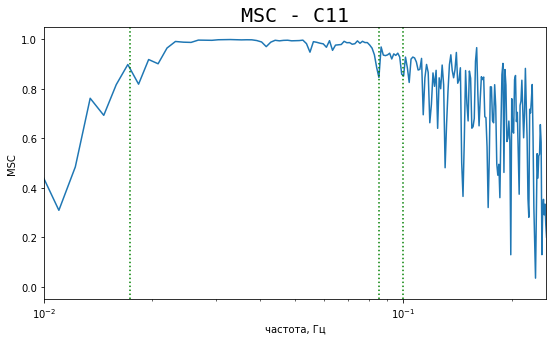

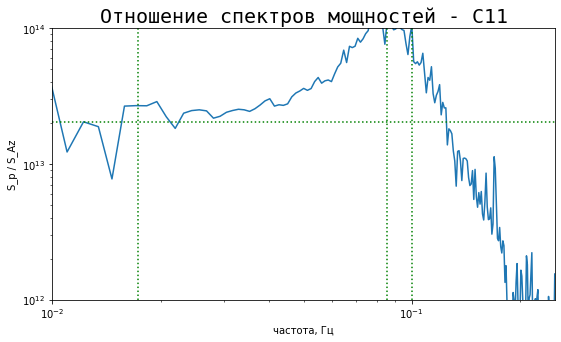

Доля хороших частот = 0.373134328358209
Дельта = 0.3575062144930039


In [131]:
station_name = 'C11'
height = 4378
Az_path = 'az_metrics/201801231535_6h/M.KMC11.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMC11.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C12 - плохо (0.47, 0.42)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


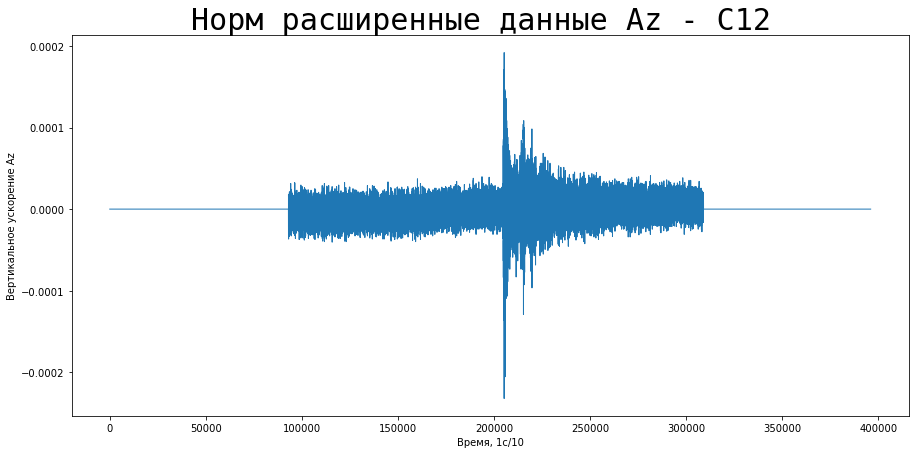

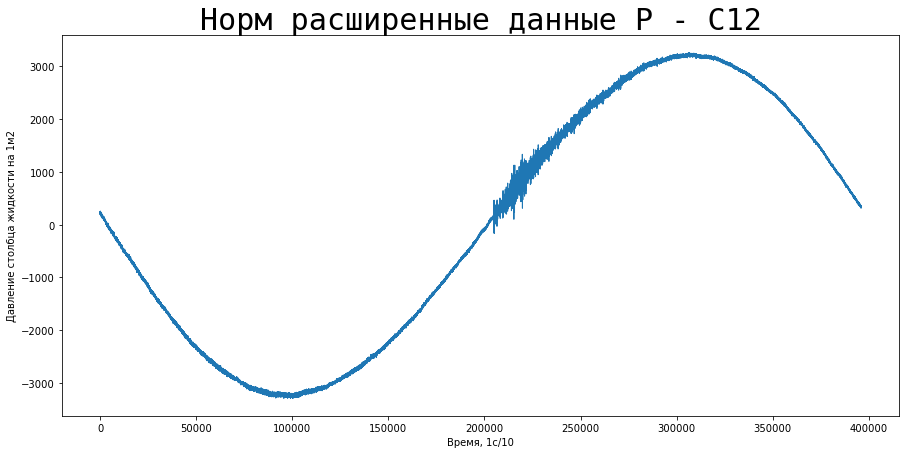

Введите промежуток начала колебаний: 200000


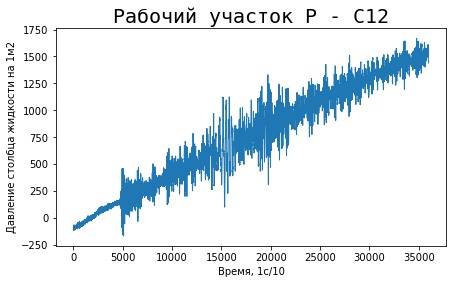

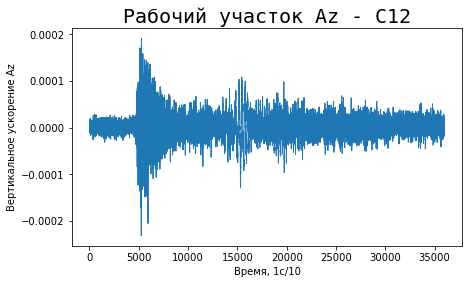

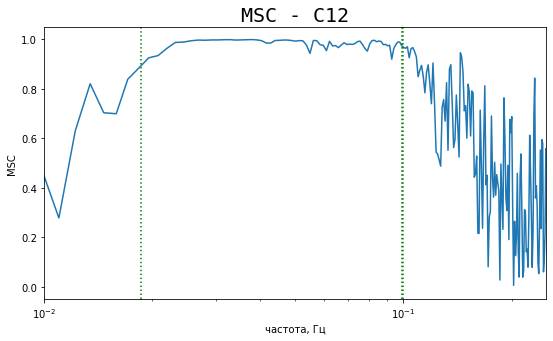

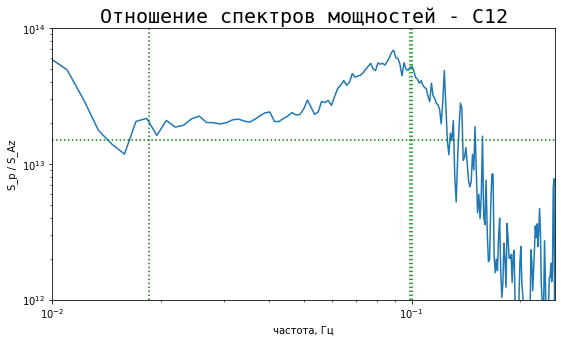

Доля хороших частот = 0.4696969696969697
Дельта = 0.4216674267000129


In [132]:
station_name = 'C12'
height = 3784
Az_path = 'az_metrics/201801231535_6h/M.KMC12.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMC12.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D13 - неуд (0.10, 0.07)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


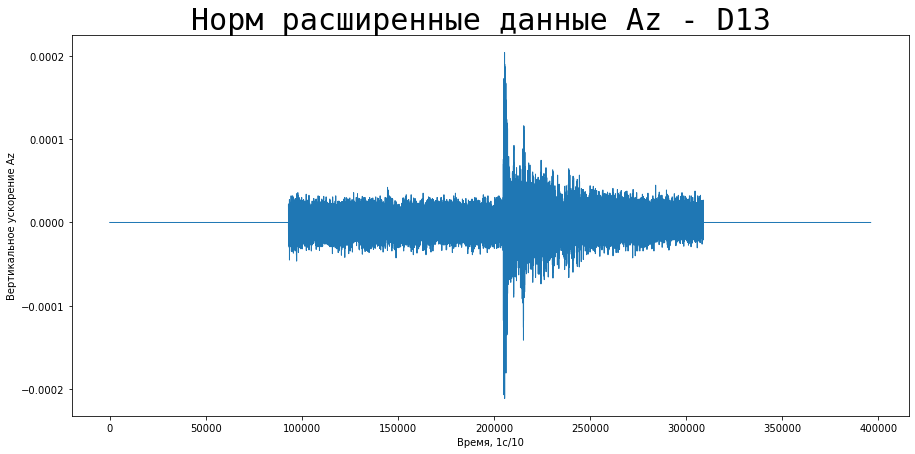

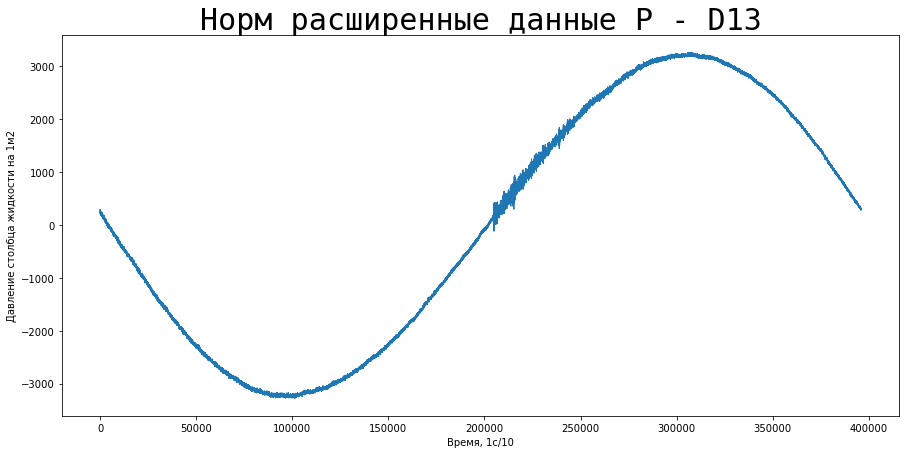

Введите промежуток начала колебаний: 200000


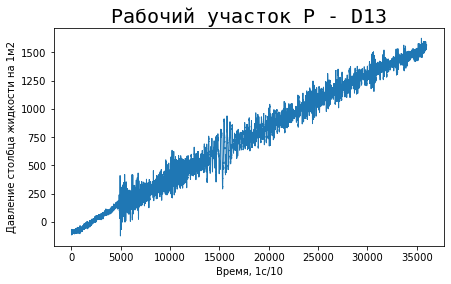

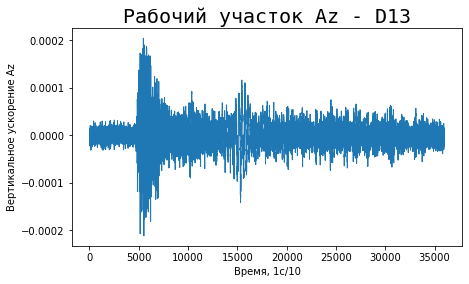

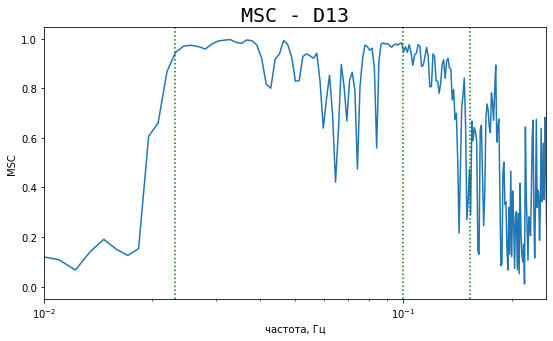

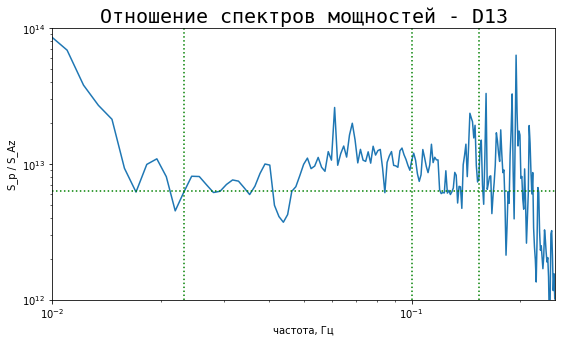

Доля хороших частот = 0.0967741935483871
Дельта = 0.07530756598129473


In [133]:
station_name = 'D13'
height = 2441
Az_path = 'az_metrics/201801231535_6h/M.KMD13.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMD13.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D14 - неуд (0.22, 0.16)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


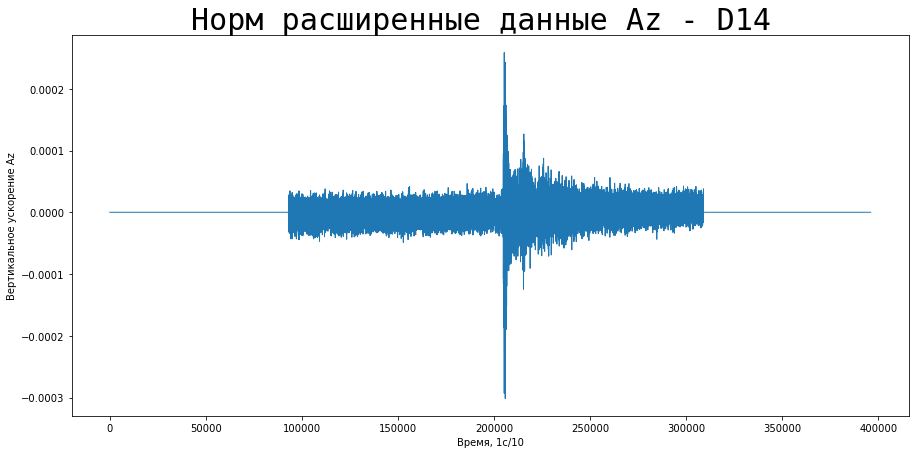

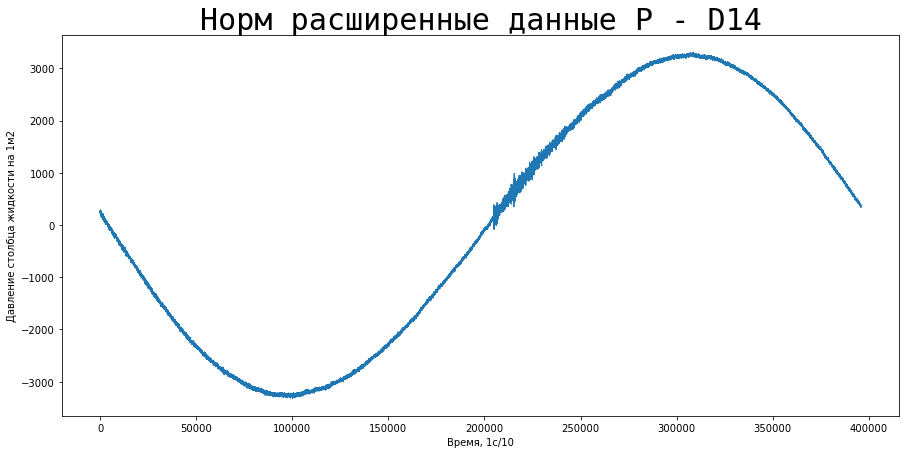

Введите промежуток начала колебаний: 200000


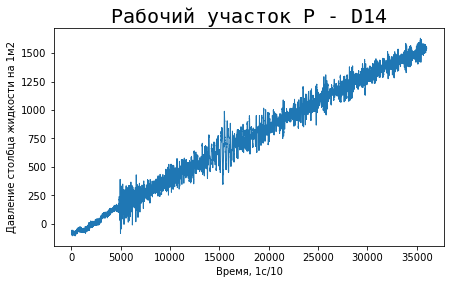

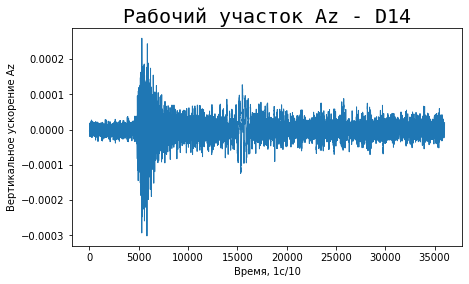

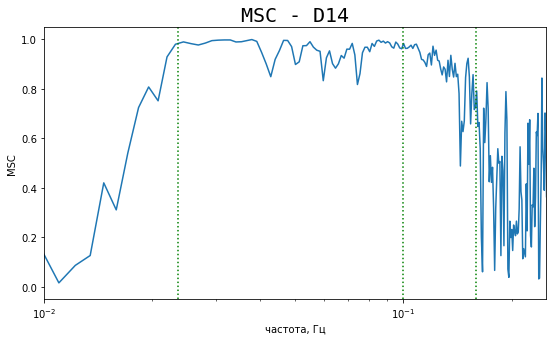

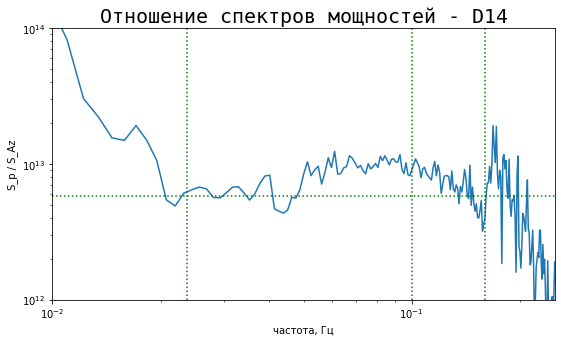

Доля хороших частот = 0.22580645161290322
Дельта = 0.16324536742437523


In [134]:
station_name = 'D14'
height = 2350
Az_path = 'az_metrics/201801231535_6h/M.KMD14.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMD14.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D15 - отлично (0.67, 0.08)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


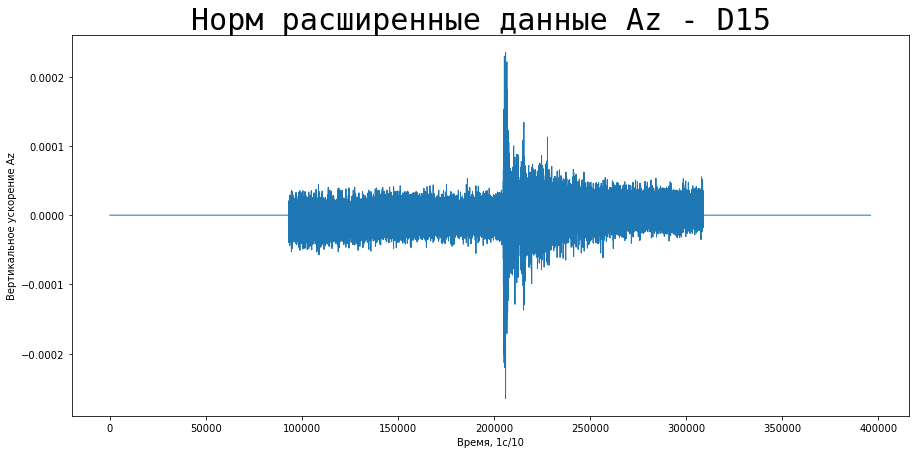

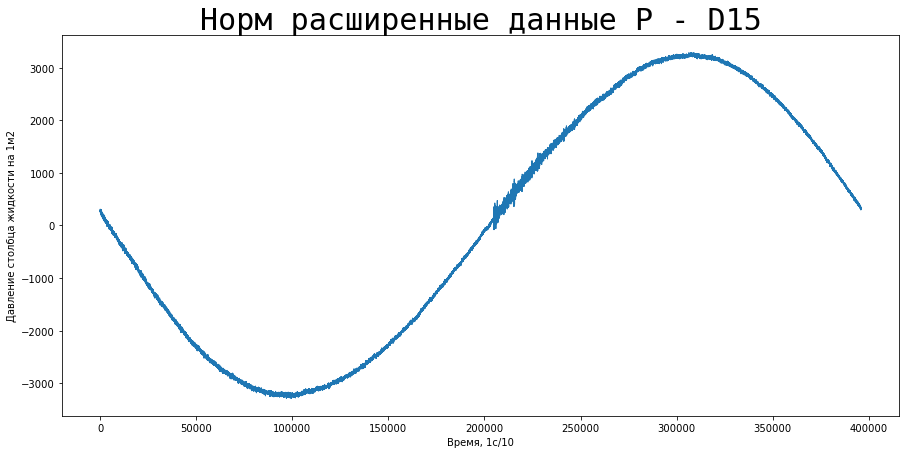

Введите промежуток начала колебаний: 200000


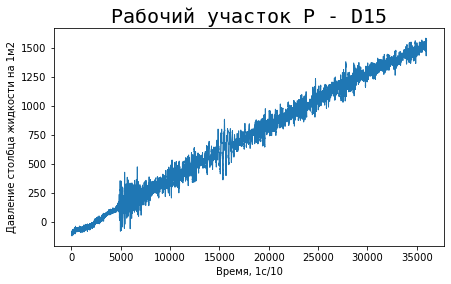

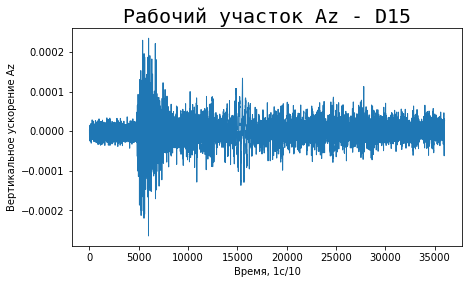

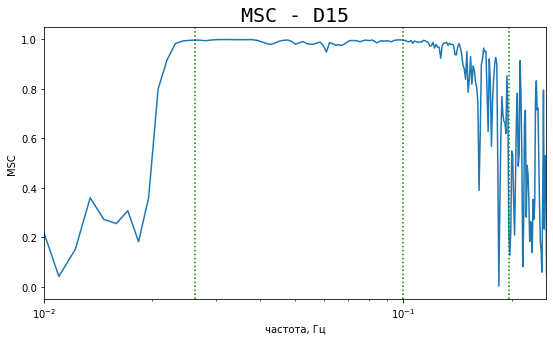

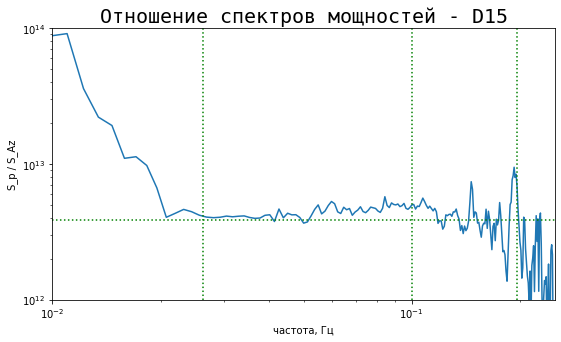

Доля хороших частот = 0.6666666666666666
Дельта = 0.07705048643897805


In [135]:
station_name = 'D15'
height = 1909
Az_path = 'az_metrics/201801231535_6h/M.KMD15.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMD15.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D16 - хорошо (0.65, 0.13)

Время начала измерений: (13, 0)
Время конца измерений: (24, 0)
Проверка на равенство дополненных промежутков: True


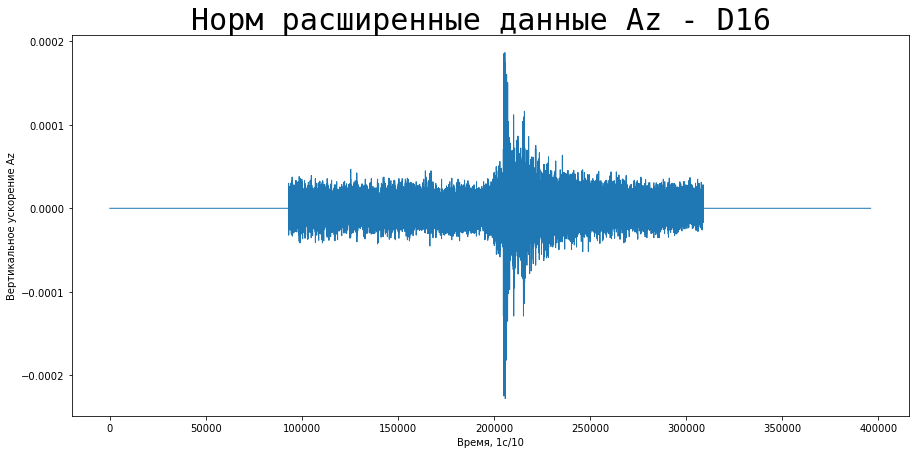

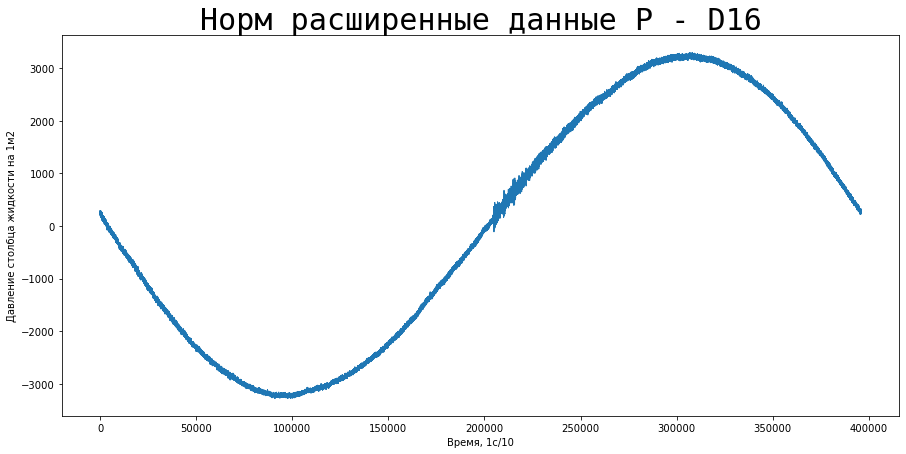

Введите промежуток начала колебаний: 200000


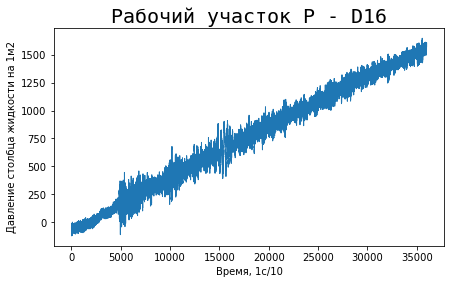

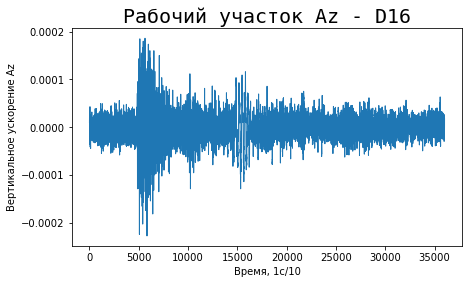

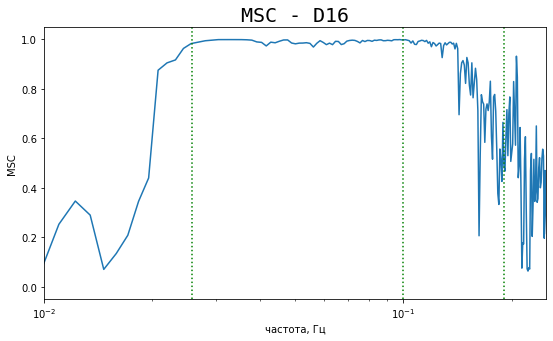

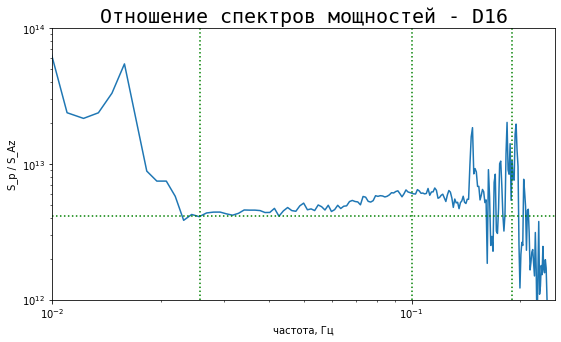

Доля хороших частот = 0.65
Дельта = 0.13613006098077762


In [136]:
station_name = 'D16'
height = 1970
Az_path = 'az_metrics/201801231535_6h/M.KMD16.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201801231300_11h/M.KMD16.Pr.txt'
P_time_start = 13, 0
P_time_stop = 24, 0
Az_time_start = 15, 35
Az_time_stop = 21, 35

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

# 2018-08-19
- P_time_start = 6, 0
- P_time_stop = 13, 0
- Az_time_start = 6, 20
- Az_time_stop = 12, 20

## A01 - отлично (0.85, 0.09)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


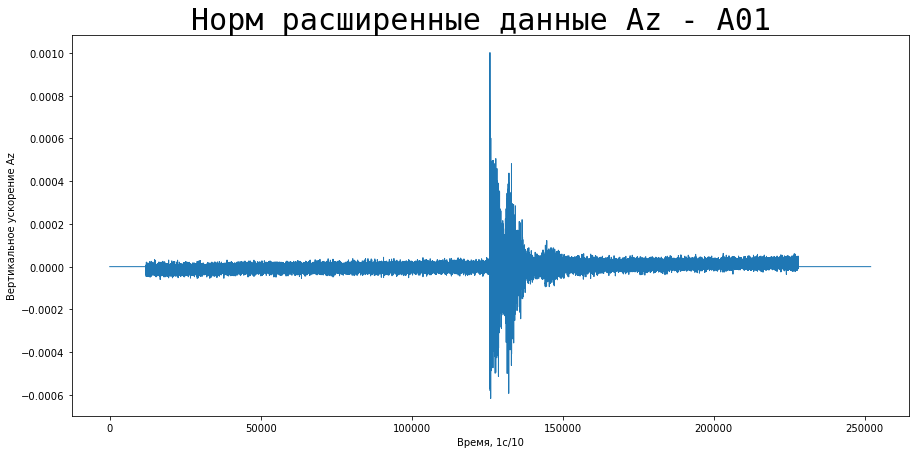

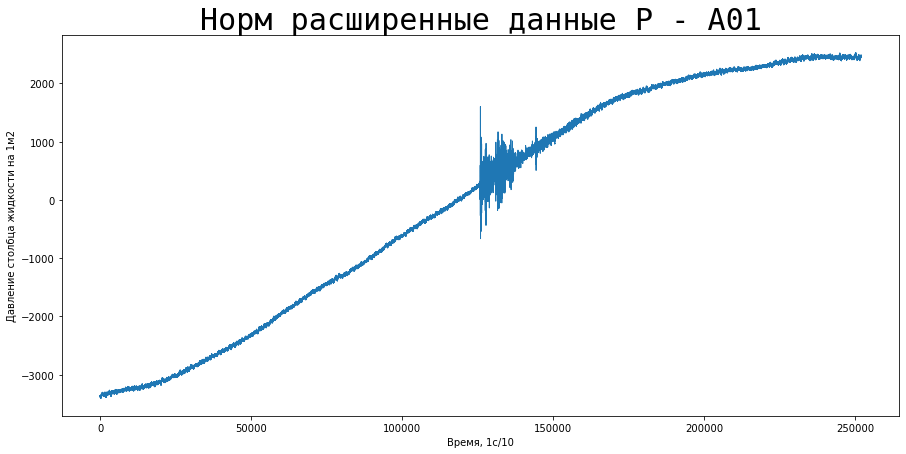

Введите промежуток начала колебаний: 125000


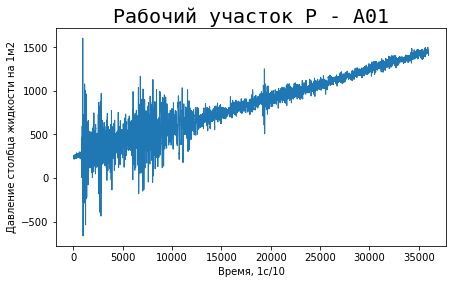

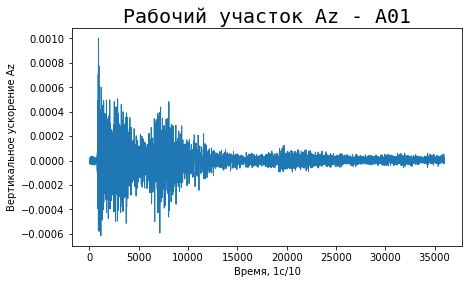

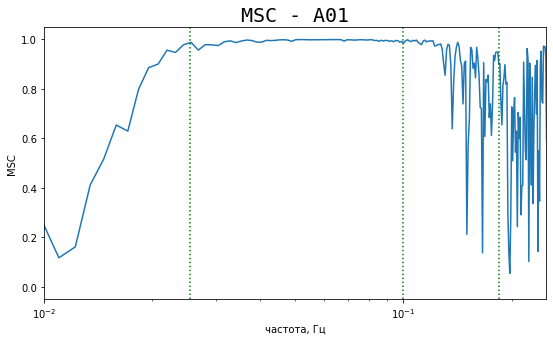

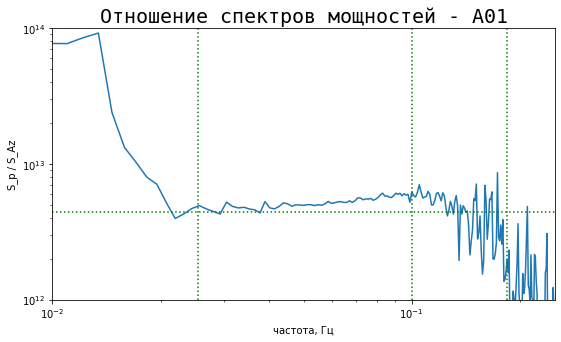

Доля хороших частот = 0.8524590163934426
Дельта = 0.09827782538546193


In [147]:
station_name = 'A01'
height = 2039
Az_path = 'az_metrics/201808190620_6h/M.KMA01.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMA01.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A02 - хорошо (0.95, 0.10)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


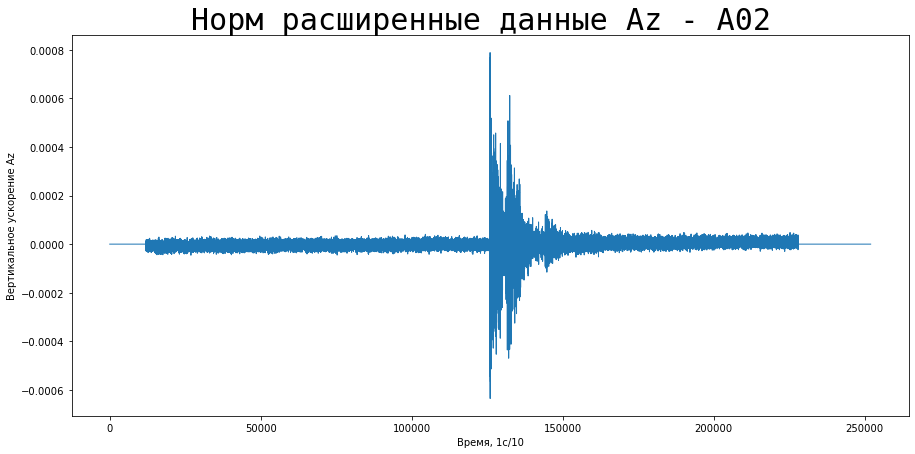

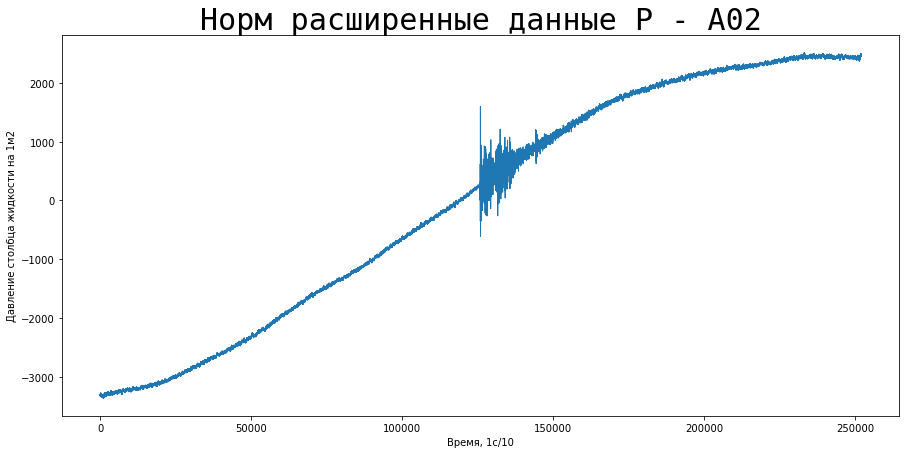

Введите промежуток начала колебаний: 125000


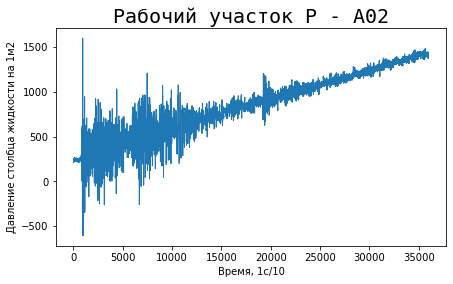

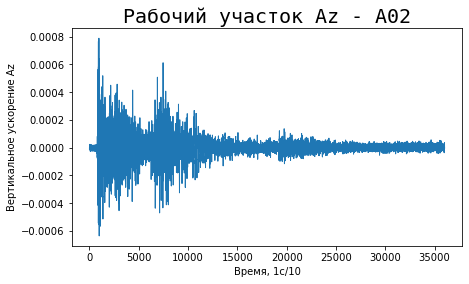

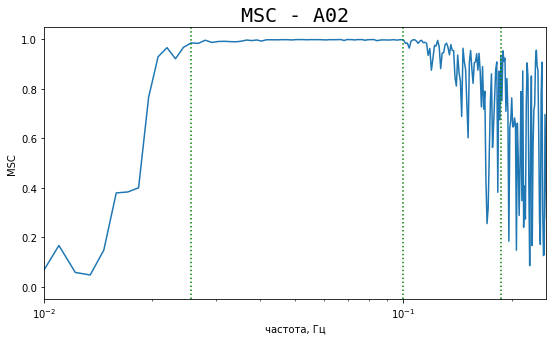

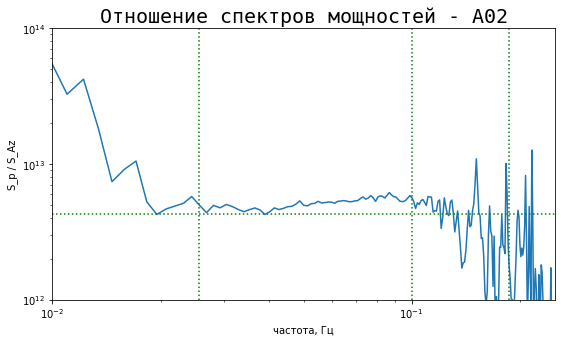

Доля хороших частот = 0.9508196721311475
Дельта = 0.10398217814111121


In [148]:
station_name = 'A02'
height = 2011
Az_path = 'az_metrics/201808190620_6h/M.KMA02.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMA02.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A03 - отлично (0.80, 0.05)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


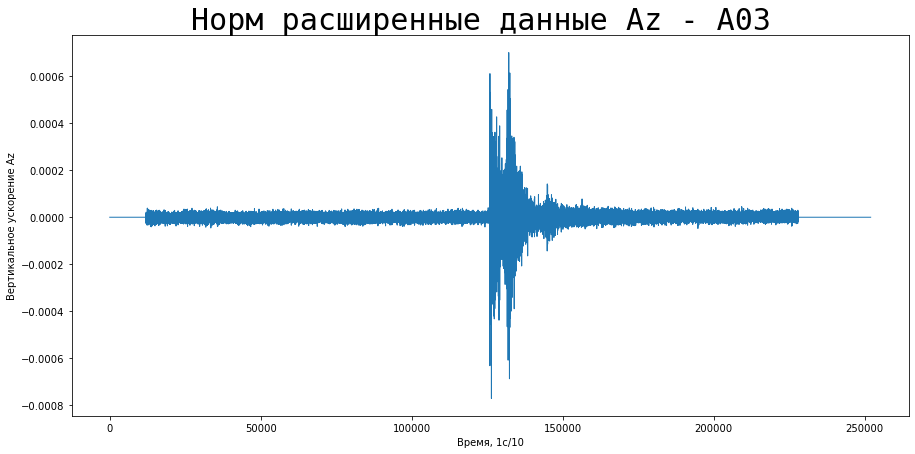

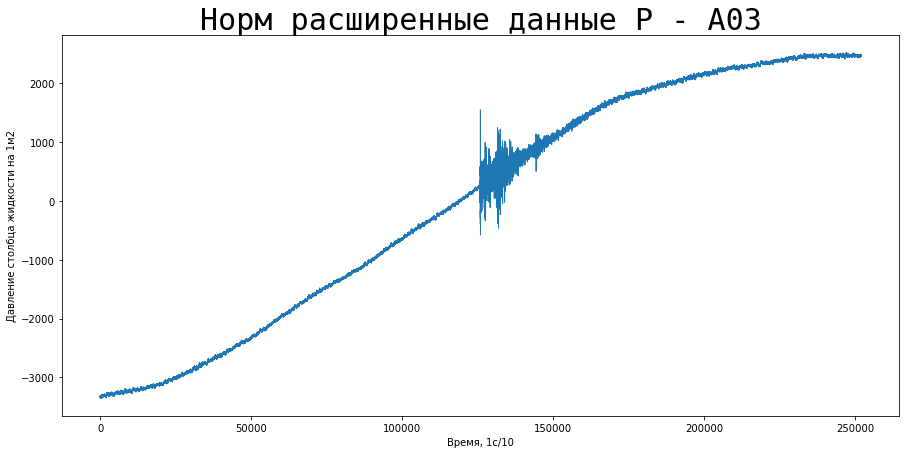

Введите промежуток начала колебаний: 125000


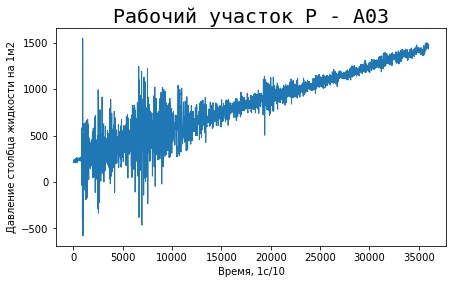

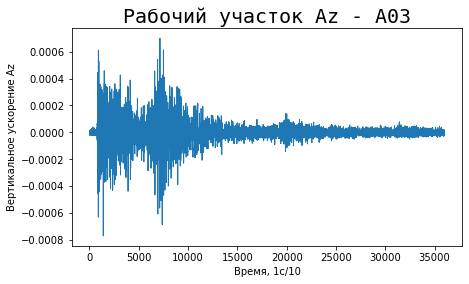

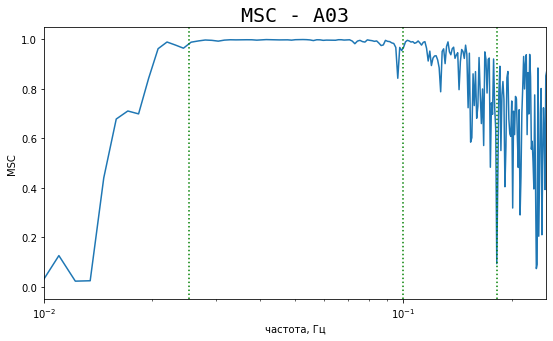

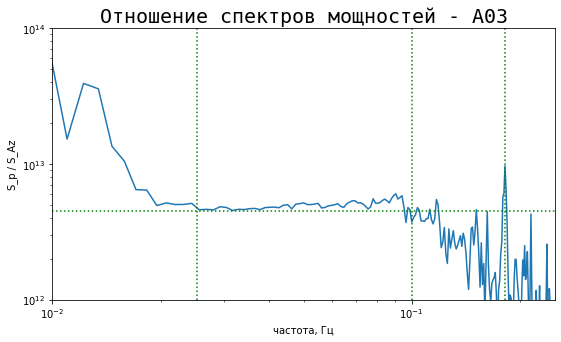

Доля хороших частот = 0.8032786885245902
Дельта = 0.049477637150295184


In [149]:
station_name = 'A03'
height = 2063
Az_path = 'az_metrics/201808190620_6h/M.KMA03.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMA03.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## A04 - хорошо (0.98, 0.12)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


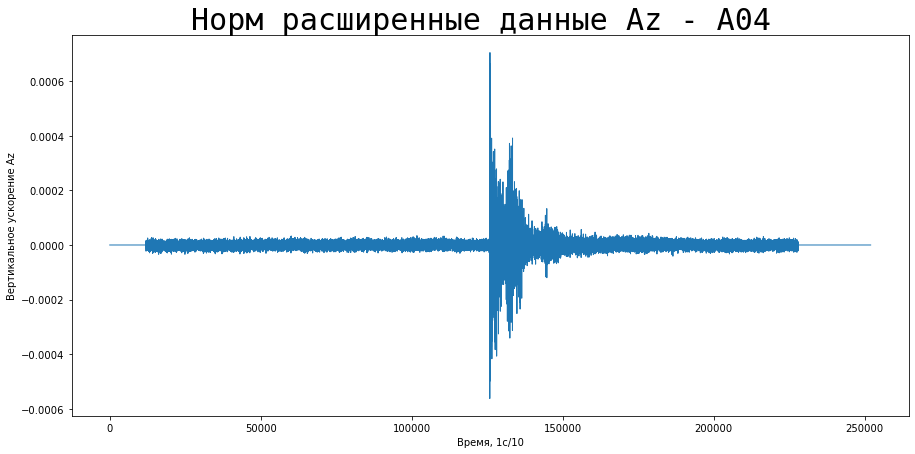

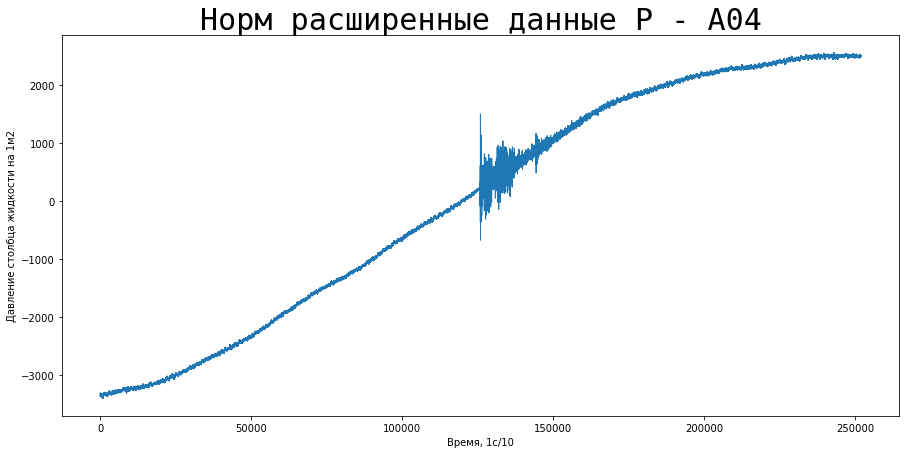

Введите промежуток начала колебаний: 125000


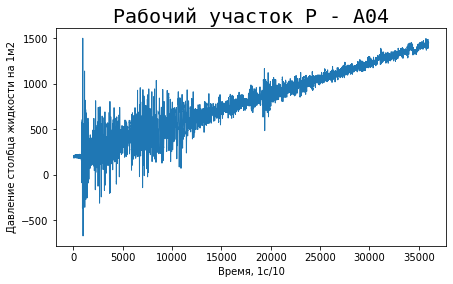

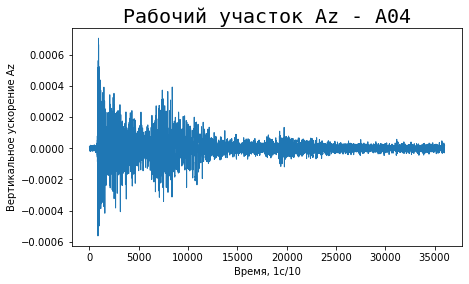

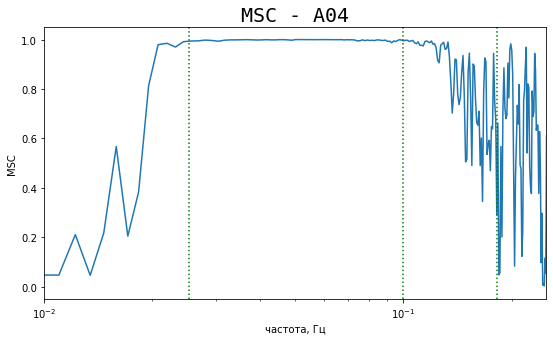

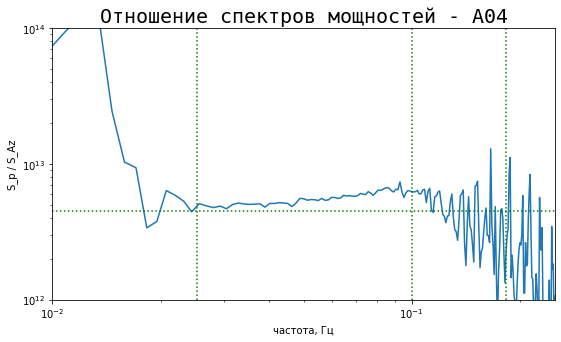

Доля хороших частот = 0.9836065573770492
Дельта = 0.12306670643252882


In [150]:
station_name = 'A04'
height = 2054
Az_path = 'az_metrics/201808190620_6h/M.KMA04.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMA04.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B05 - хорошо (0.88, 0.12)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


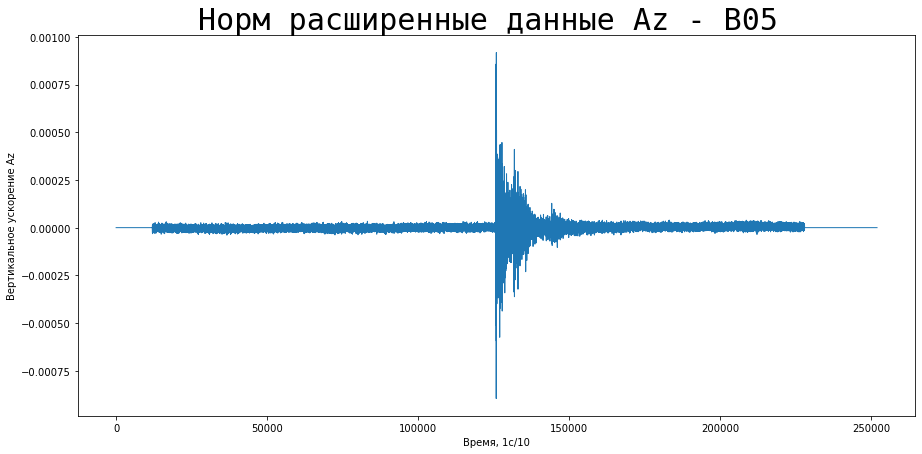

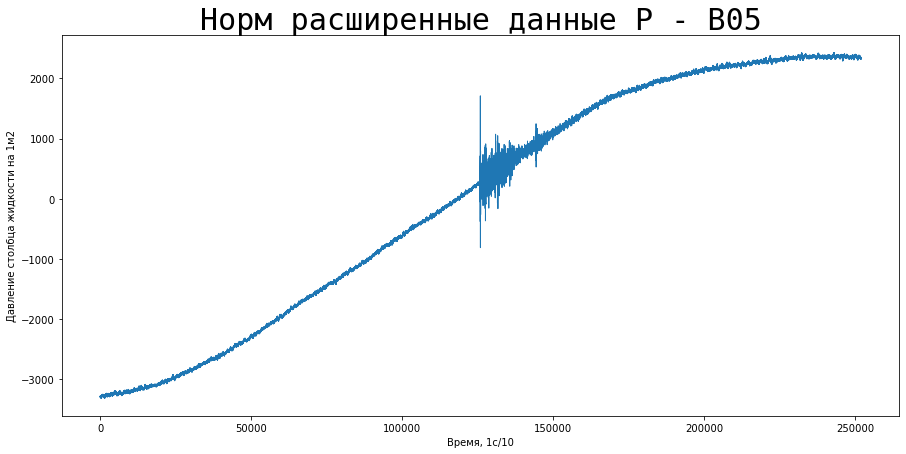

Введите промежуток начала колебаний: 125000


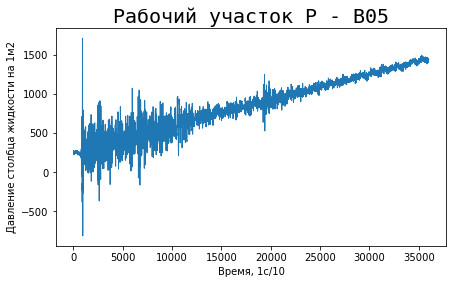

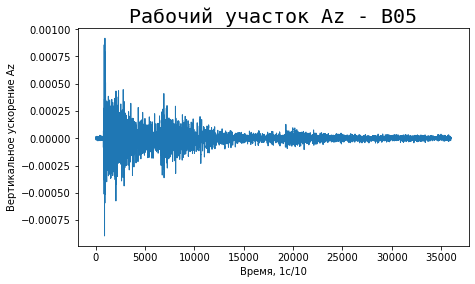

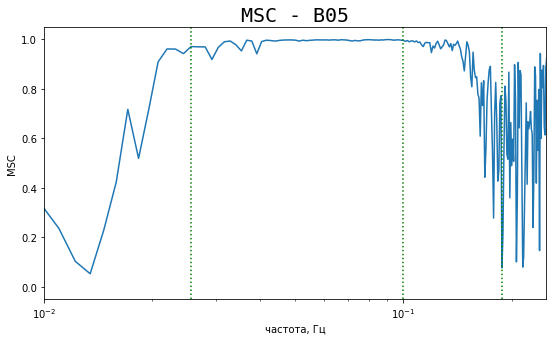

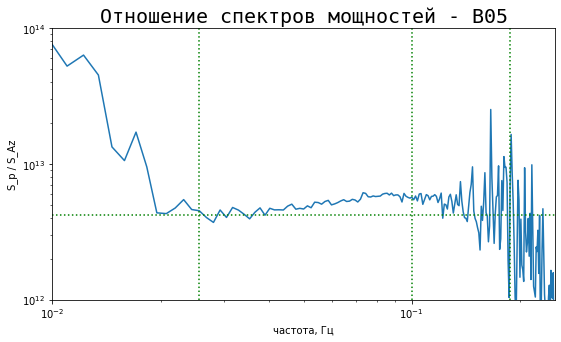

Доля хороших частот = 0.8833333333333333
Дельта = 0.12465885320967529


In [151]:
station_name = 'B05'
height = 1998
Az_path = 'az_metrics/201808190620_6h/M.KMB05.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMB05.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B06 - неуд (0.14, 0.29)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


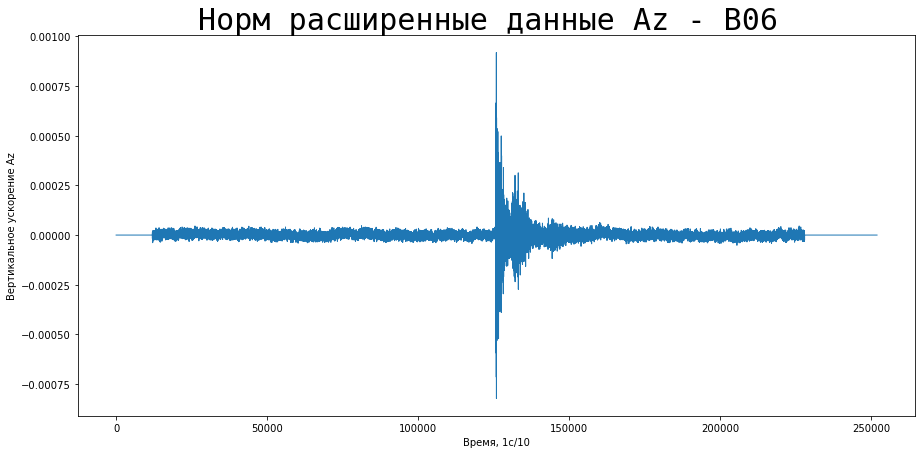

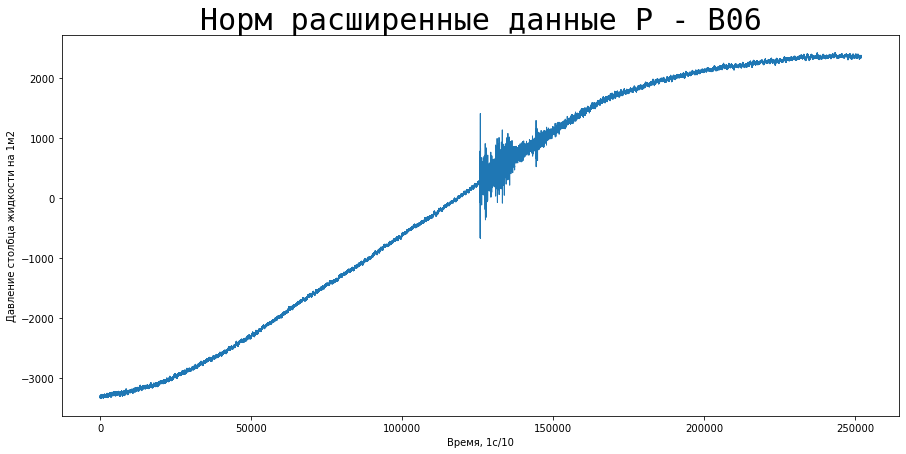

Введите промежуток начала колебаний: 125000


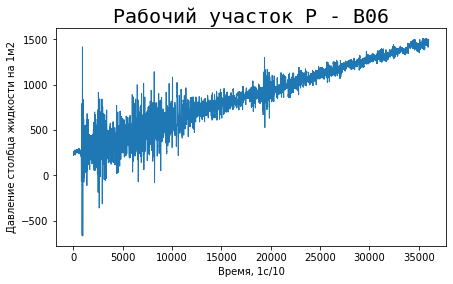

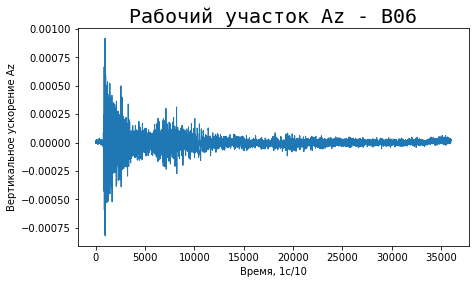

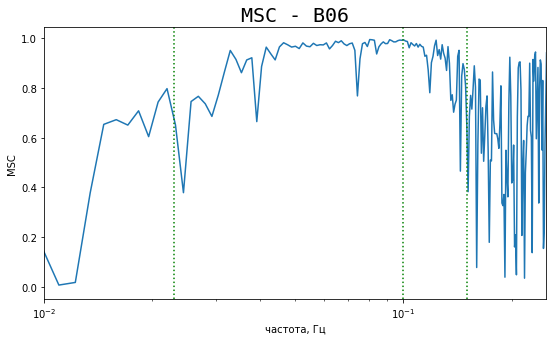

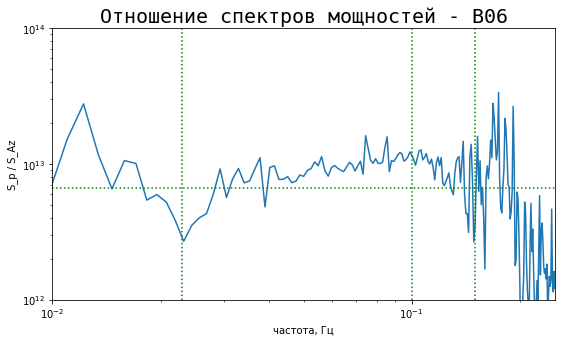

Доля хороших частот = 0.14285714285714285
Дельта = 0.28853153718671587


In [152]:
station_name = 'B06'
height = 2499
Az_path = 'az_metrics/201808190620_6h/M.KMB06.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMB06.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B07 - норм (0.25, 0.14)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


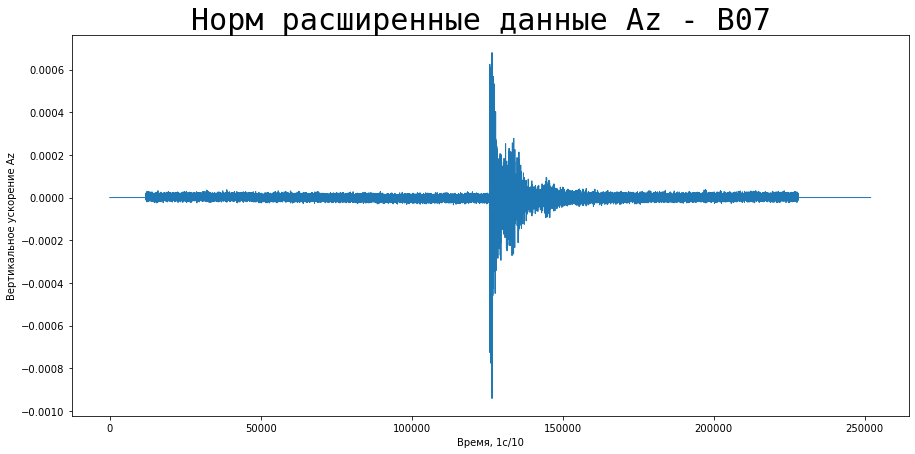

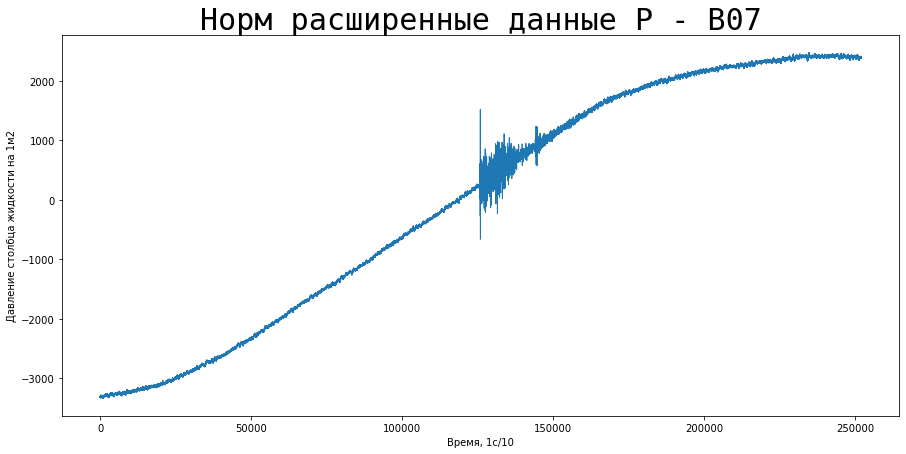

Введите промежуток начала колебаний: 125000


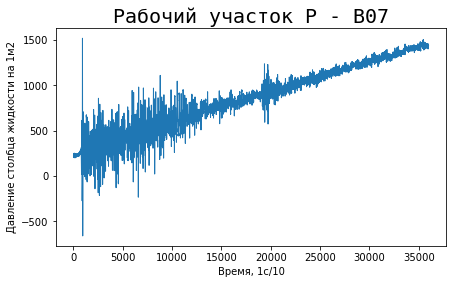

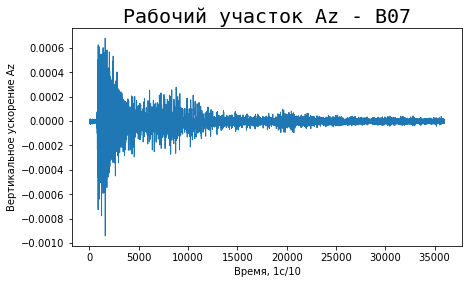

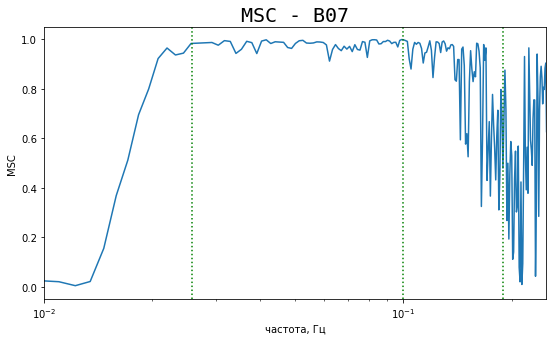

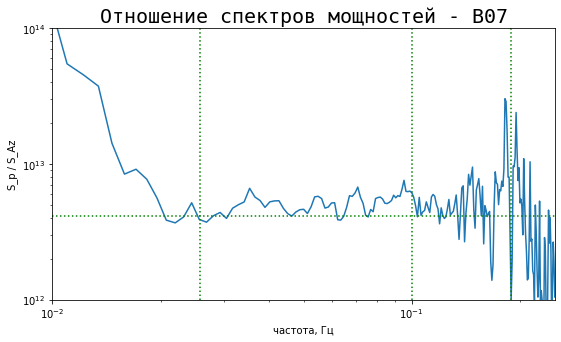

Доля хороших частот = 0.25
Дельта = 0.1417398351756083


In [153]:
station_name = 'B07'
height = 1980
Az_path = 'az_metrics/201808190620_6h/M.KMB07.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMB07.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## B08 - хорошо (0.72, 0.11)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


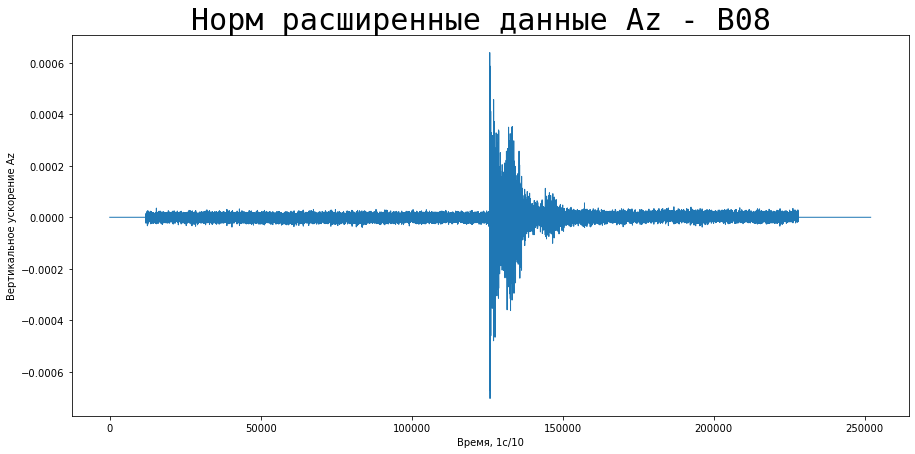

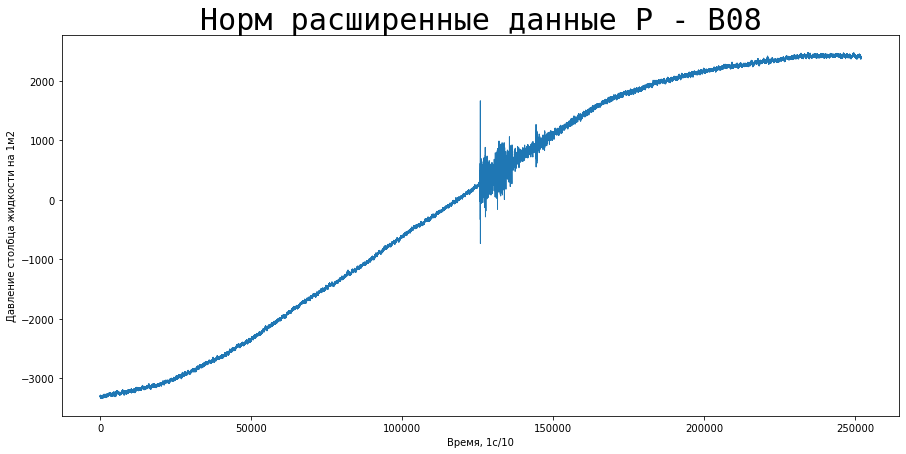

Введите промежуток начала колебаний: 125000


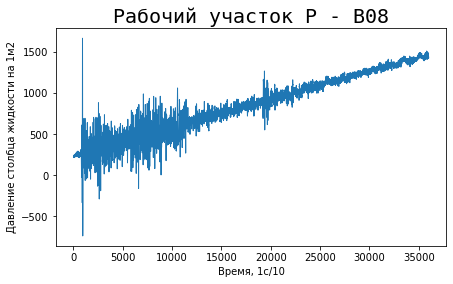

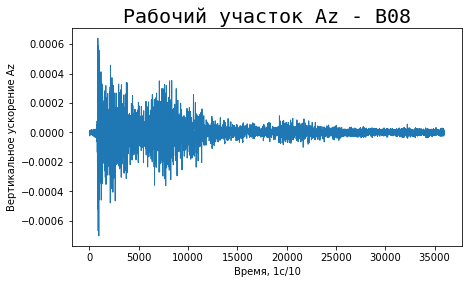

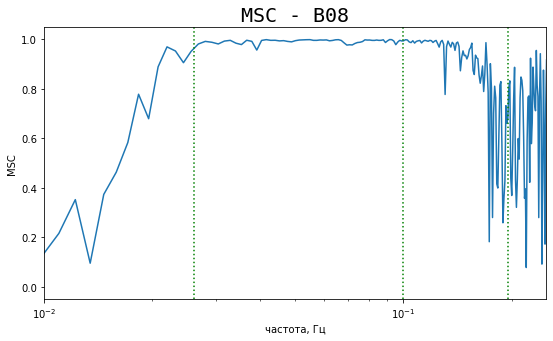

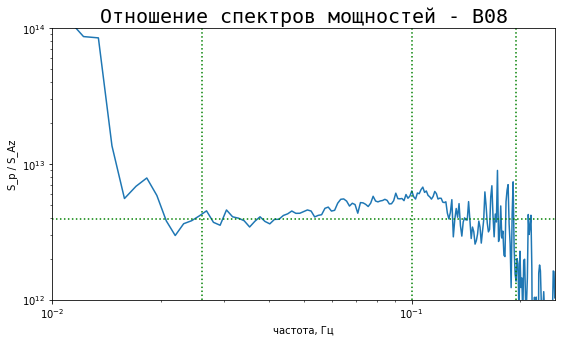

Доля хороших частот = 0.7166666666666667
Дельта = 0.10614836992277299


In [154]:
station_name = 'B08'
height = 1924
Az_path = 'az_metrics/201808190620_6h/M.KMB08.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMB08.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## С09 - плохо (0.26, 0.35)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


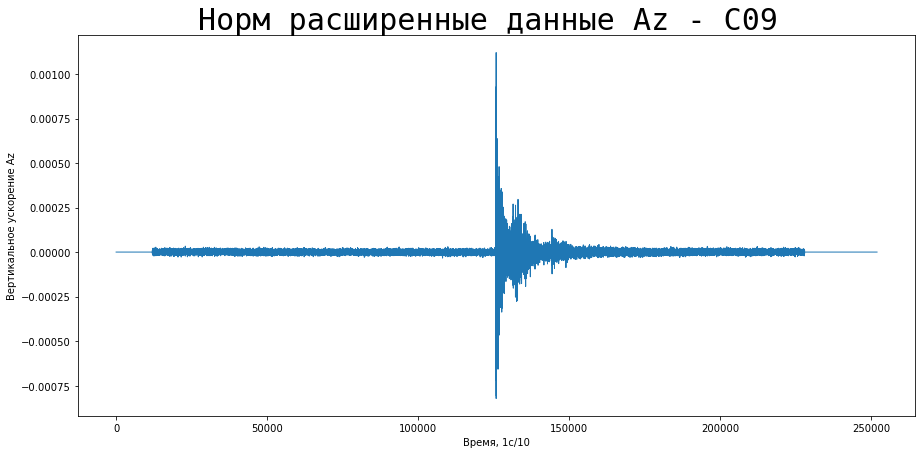

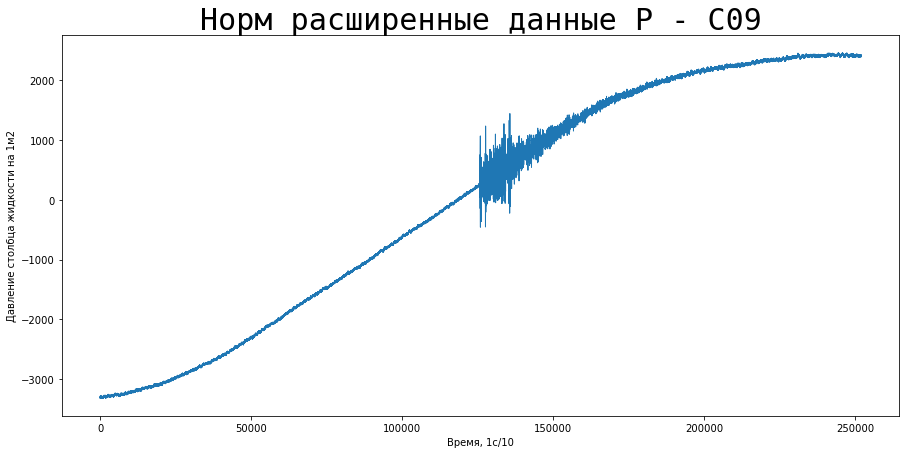

Введите промежуток начала колебаний: 125000


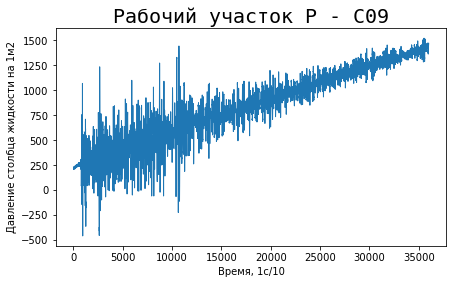

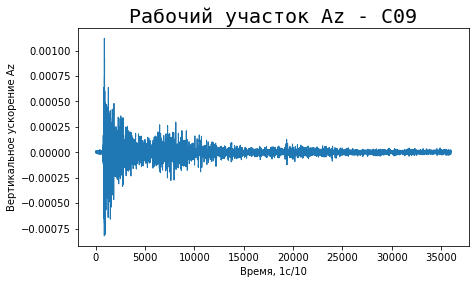

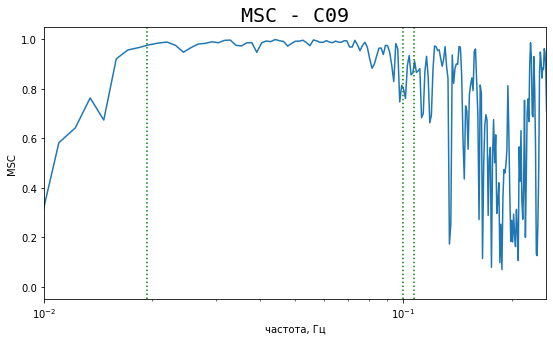

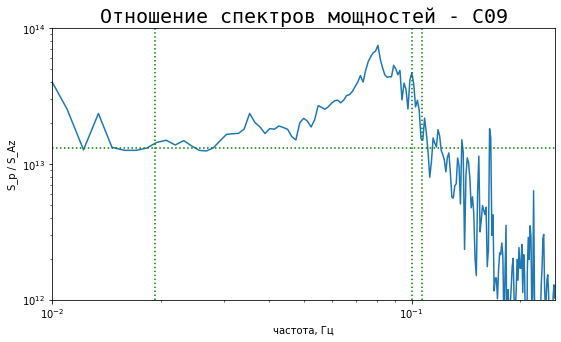

Доля хороших частот = 0.25757575757575757
Дельта = 0.35209900244462333


In [155]:
station_name = 'C09'
height = 3511
Az_path = 'az_metrics/201808190620_6h/M.KMC09.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMC09.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C10 - плохо (0.25, 0.69)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


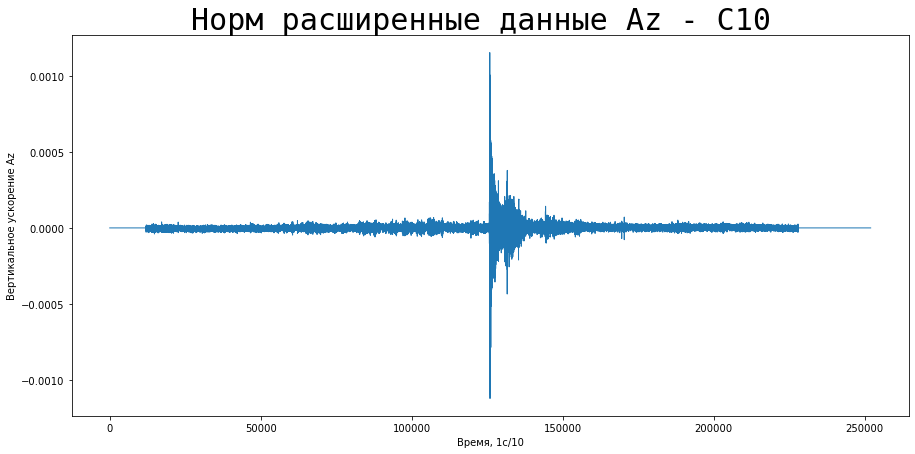

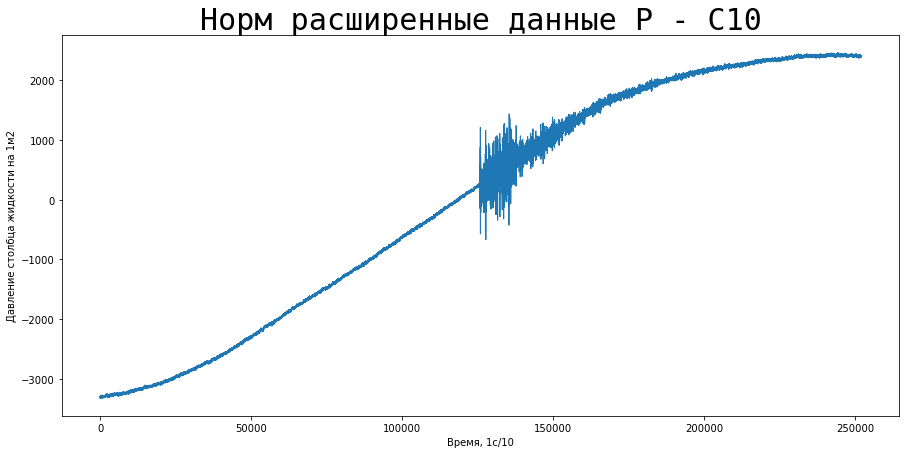

Введите промежуток начала колебаний: 125000


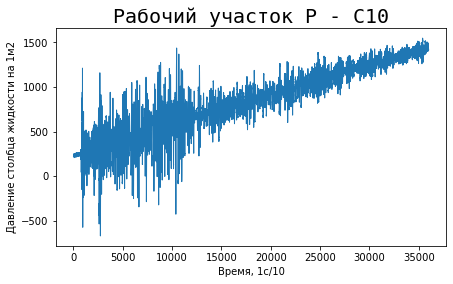

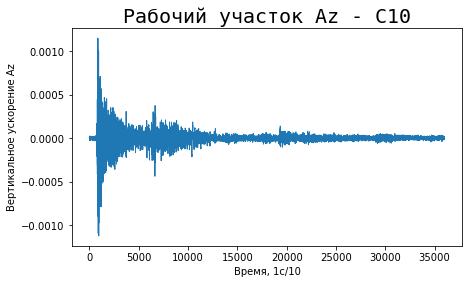

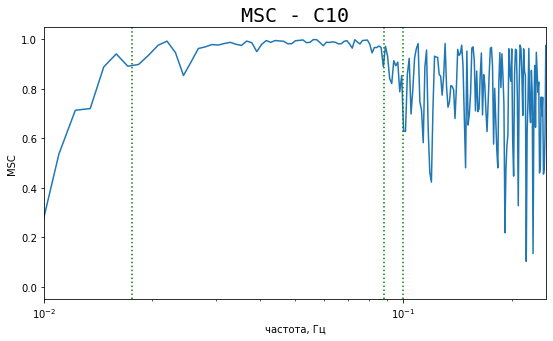

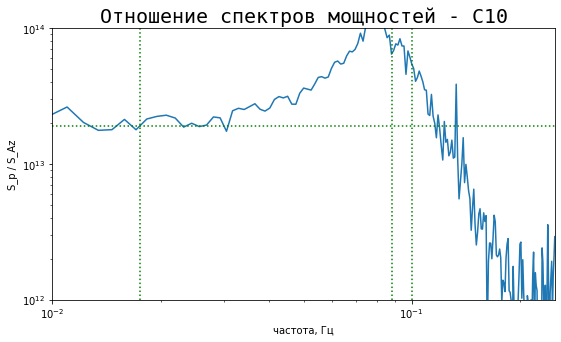

Доля хороших частот = 0.2537313432835821
Дельта = 0.6961457251039529


In [156]:
station_name = 'C10'
height = 4247
Az_path = 'az_metrics/201808190620_6h/M.KMC10.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMC10.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C11 - плохо (0.49, 0.41)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


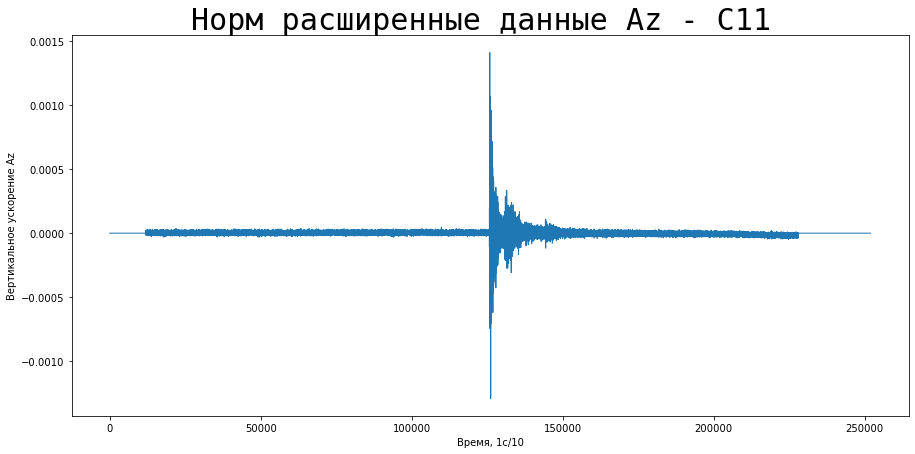

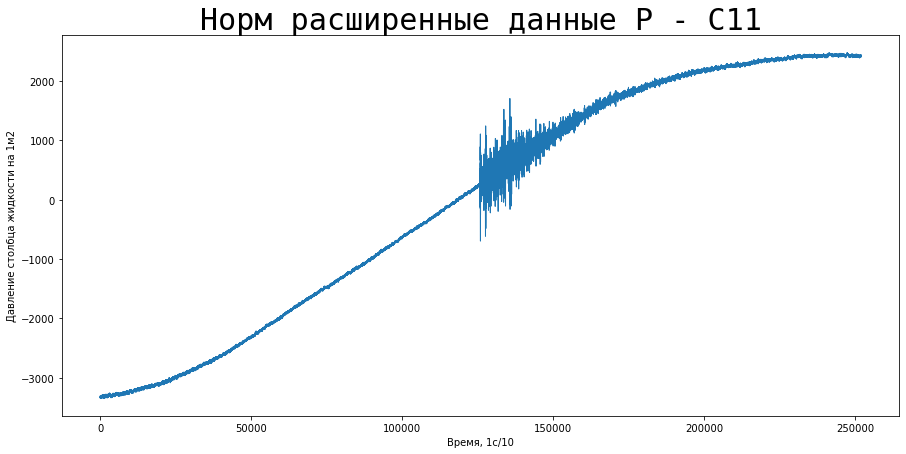

Введите промежуток начала колебаний: 125000


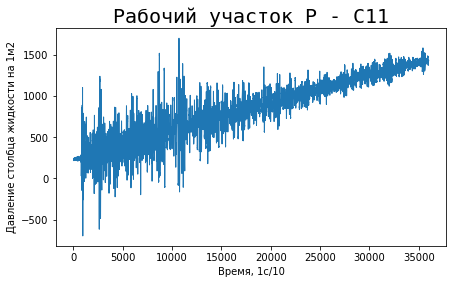

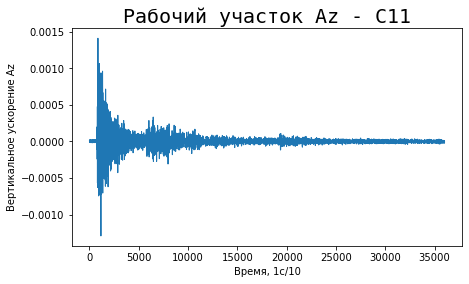

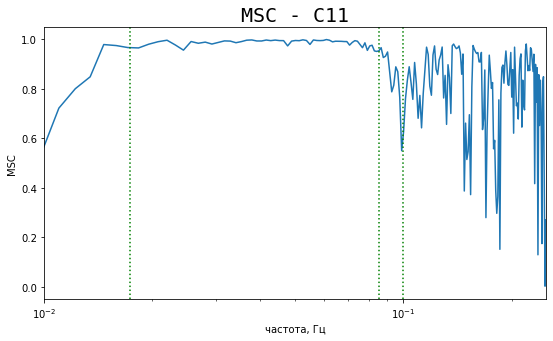

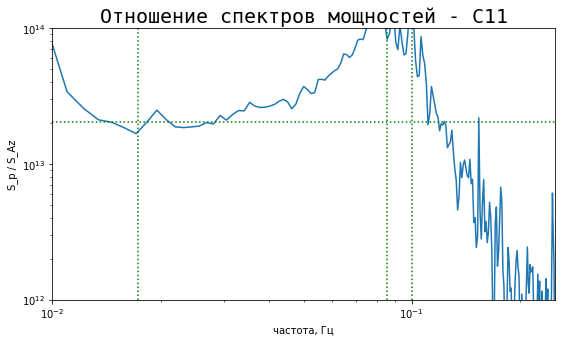

Доля хороших частот = 0.4925373134328358
Дельта = 0.40865840828729083


In [157]:
station_name = 'C11'
height = 4378
Az_path = 'az_metrics/201808190620_6h/M.KMC11.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMC11.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## C12 - плохо (0.60, 0.59)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


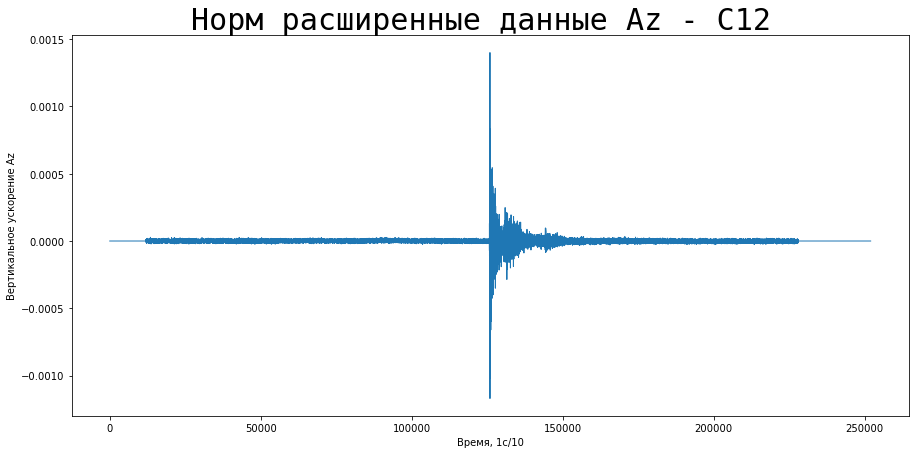

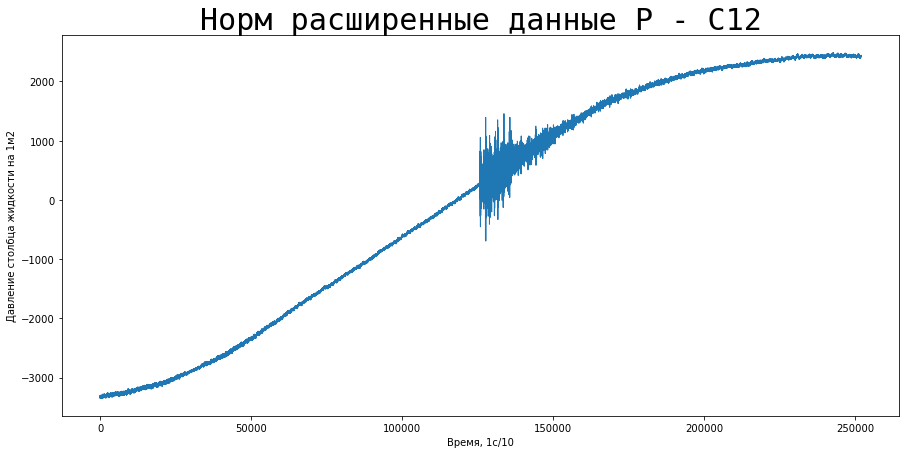

Введите промежуток начала колебаний: 125000


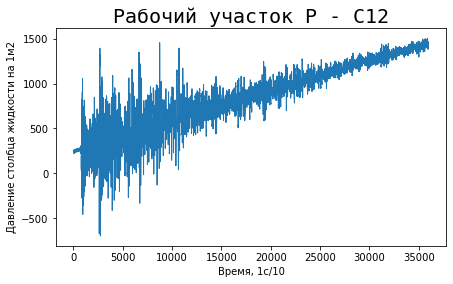

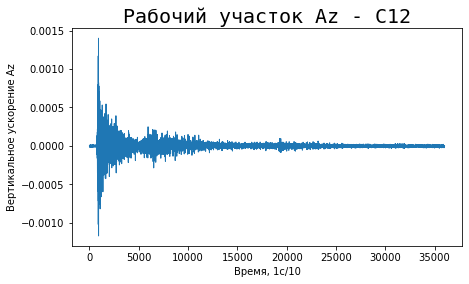

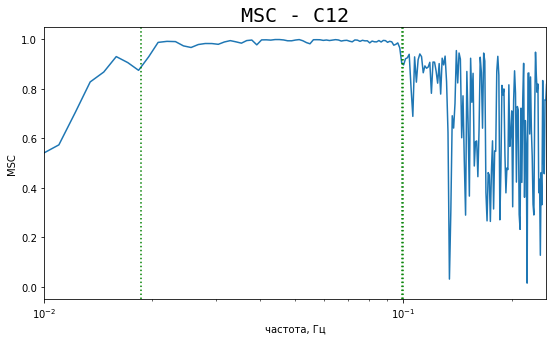

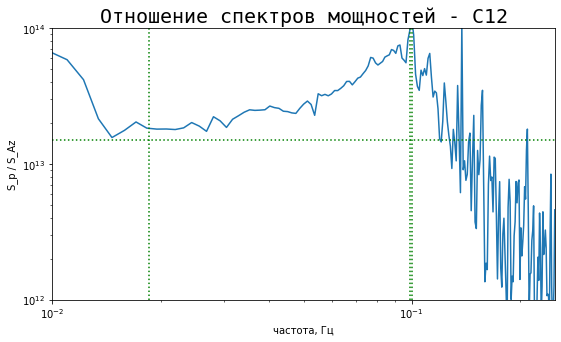

Доля хороших частот = 0.6060606060606061
Дельта = 0.5850434928716706


In [158]:
station_name = 'C12'
height = 3784
Az_path = 'az_metrics/201808190620_6h/M.KMC12.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMC12.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D13 - норм (0.27, 0.25)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


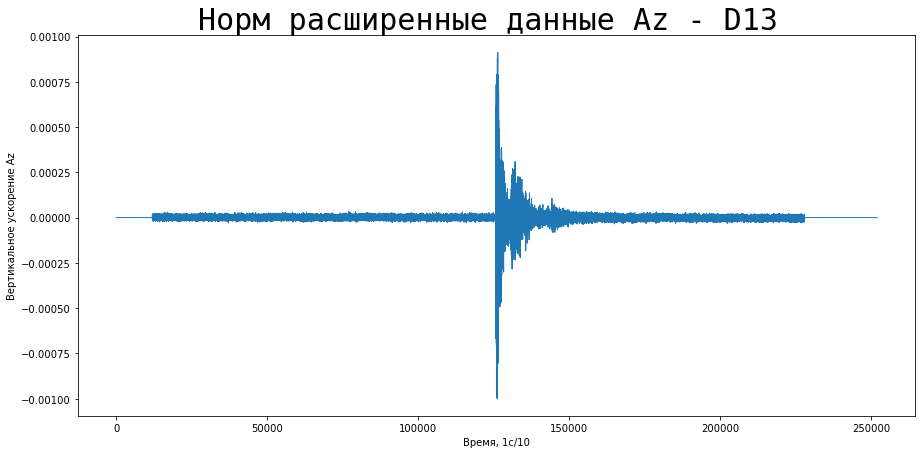

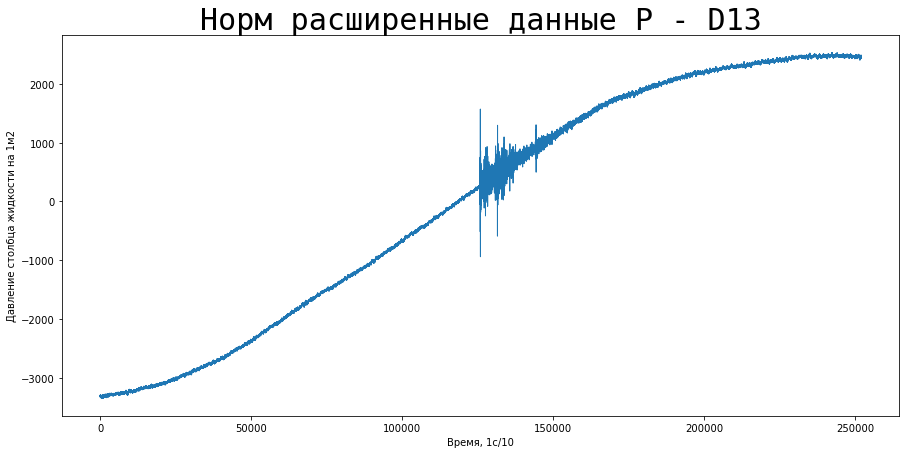

Введите промежуток начала колебаний: 125000


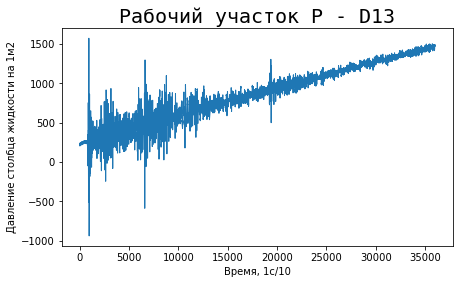

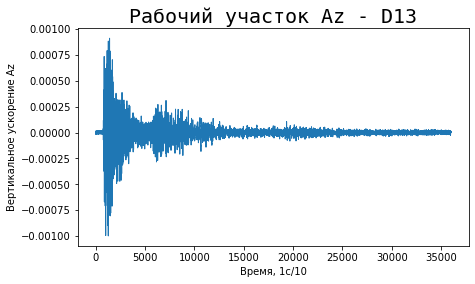

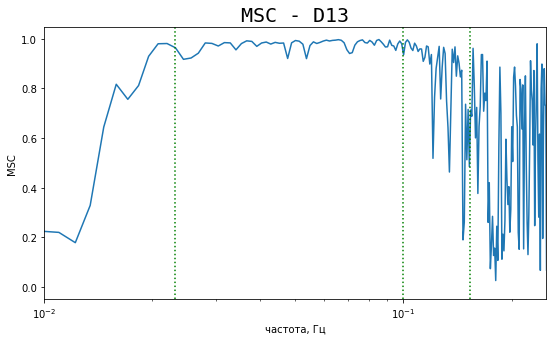

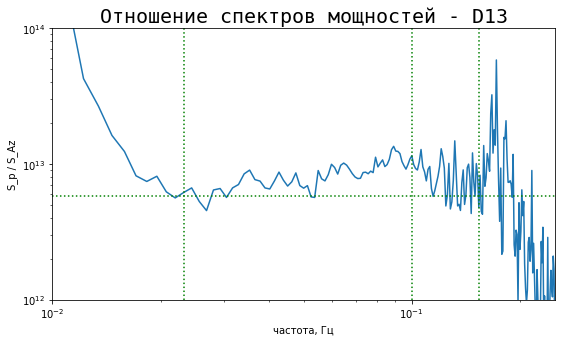

Доля хороших частот = 0.27419354838709675
Дельта = 0.2533731560326784


In [159]:
station_name = 'D13'
height = 2441
Az_path = 'az_metrics/201808190620_6h/M.KMD14.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMD14.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D14 - норм (0.27, 0.25)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


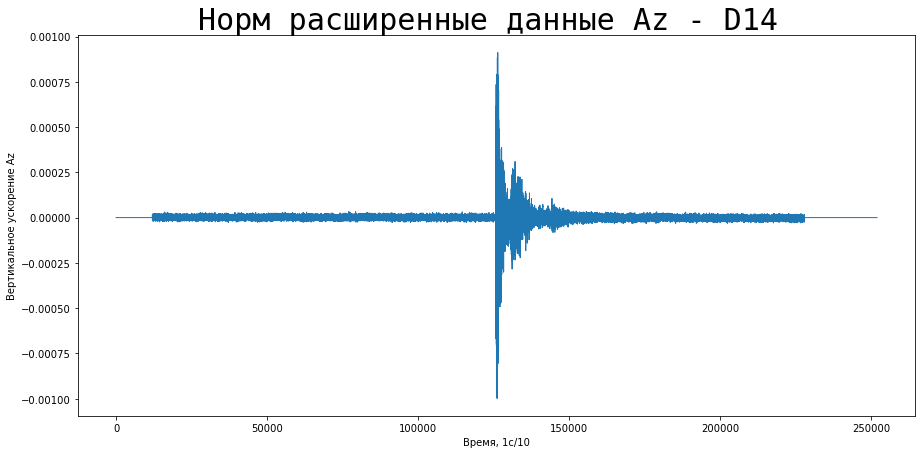

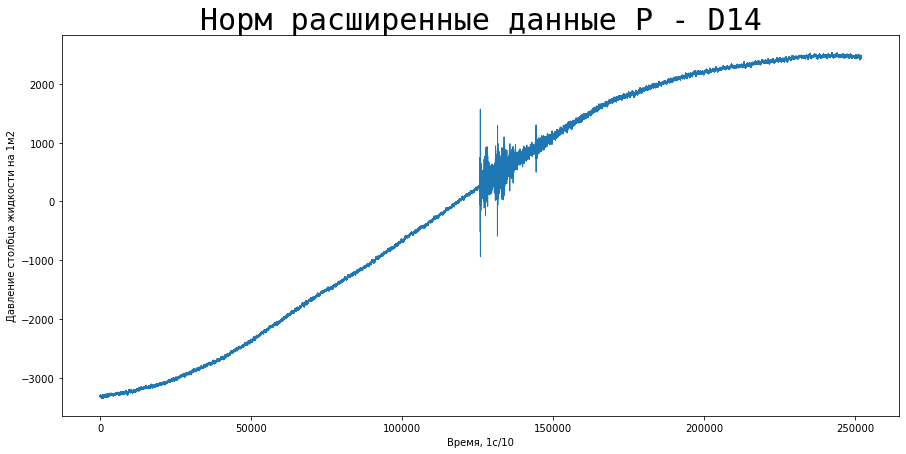

Введите промежуток начала колебаний: 125000


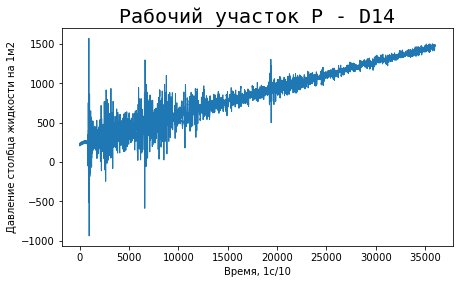

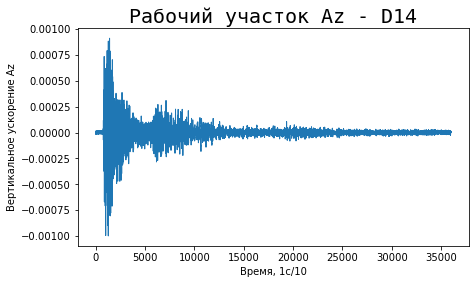

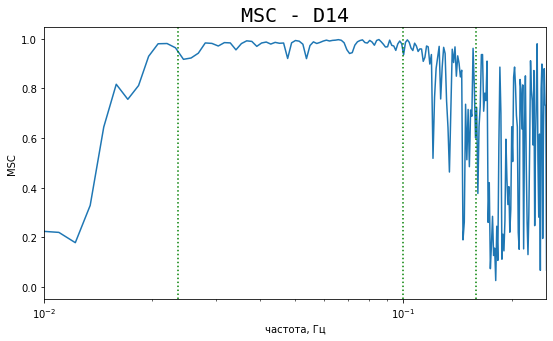

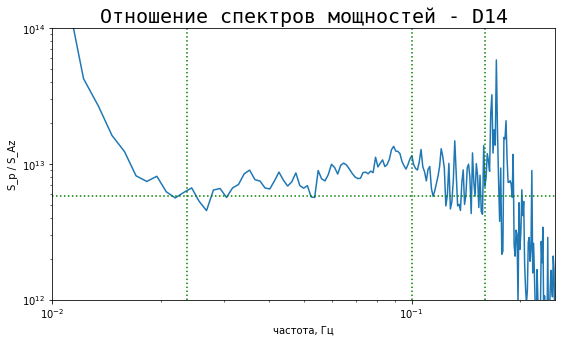

Доля хороших частот = 0.27419354838709675
Дельта = 0.2533731560326784


In [160]:
station_name = 'D14'
height = 2350
Az_path = 'az_metrics/201808190620_6h/M.KMD14.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMD14.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D15 - отлично (0.88, 0.08)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


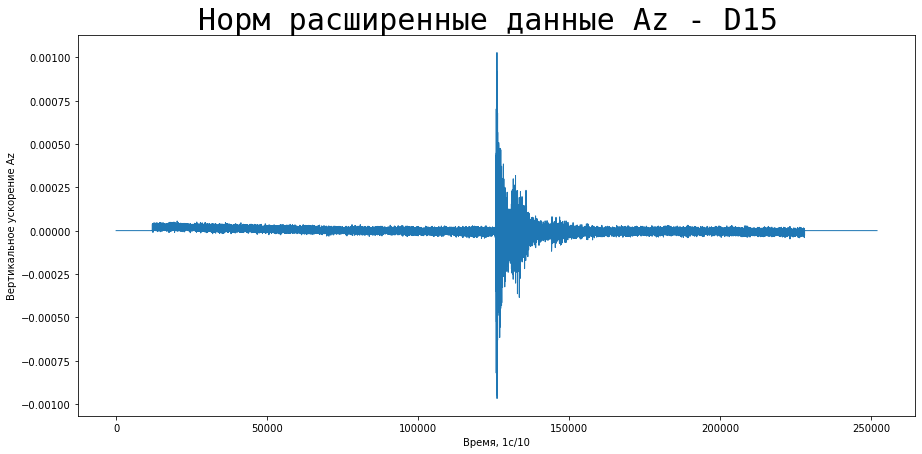

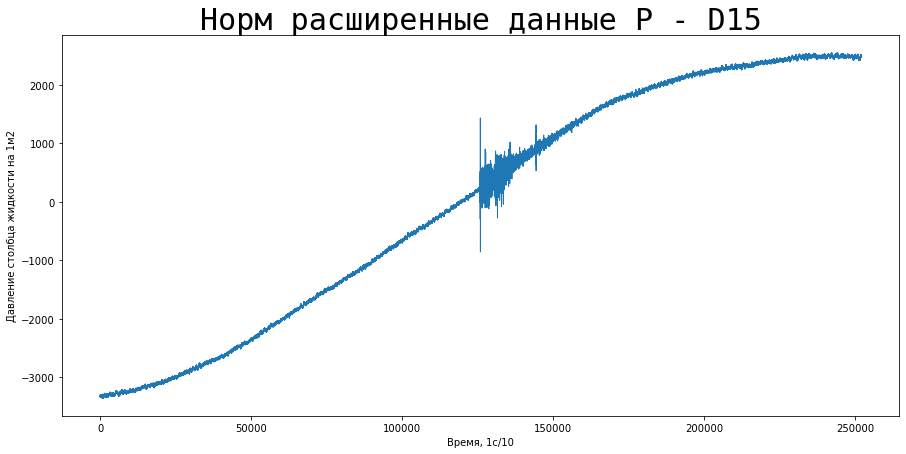

Введите промежуток начала колебаний: 125000


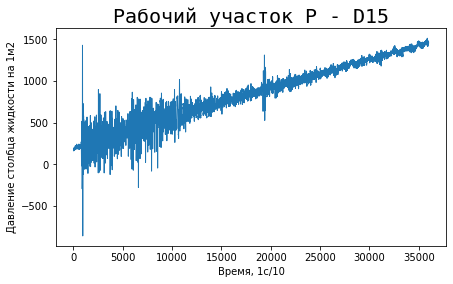

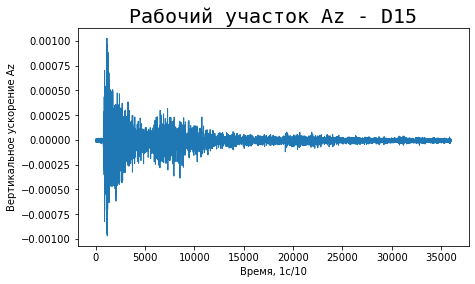

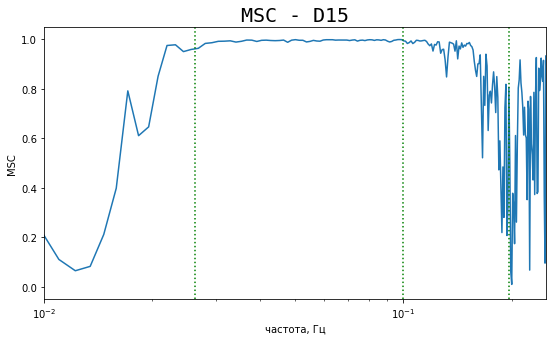

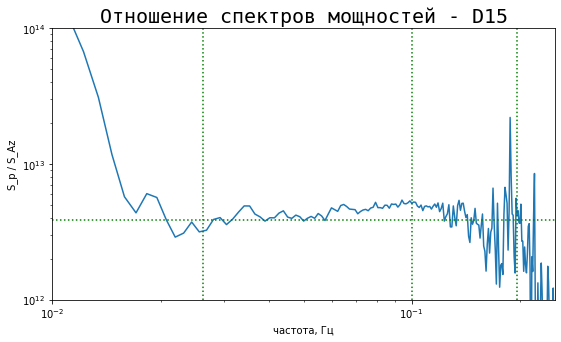

Доля хороших частот = 0.8833333333333333
Дельта = 0.08456633803878066


In [161]:
station_name = 'D15'
height = 1909
Az_path = 'az_metrics/201808190620_6h/M.KMD15.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMD15.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

## D16 - хорошо (0.86, 0.14)

Время начала измерений: (6, 0)
Время конца измерений: (13, 0)
Проверка на равенство дополненных промежутков: True


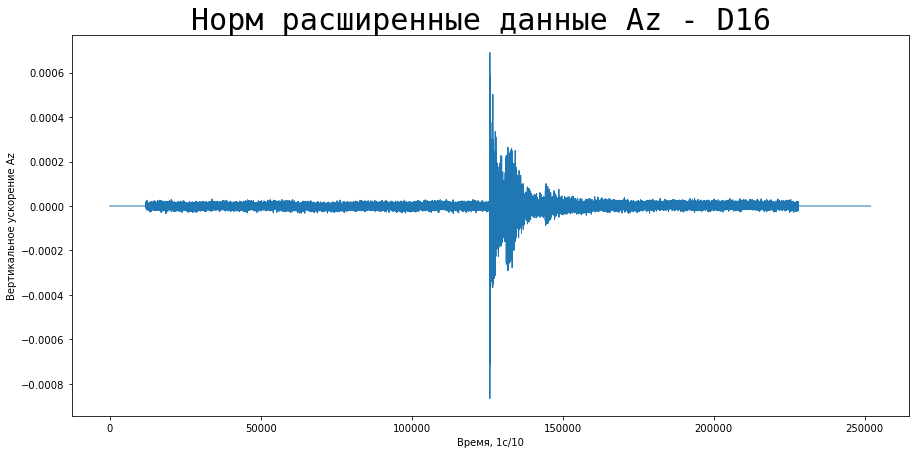

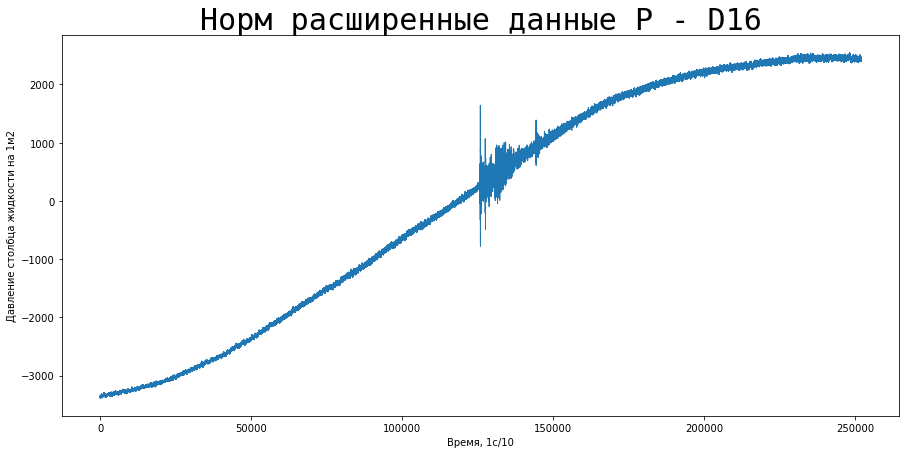

Введите промежуток начала колебаний: 125000


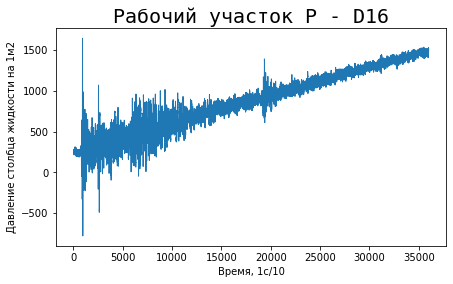

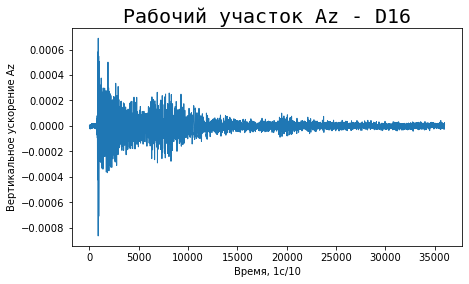

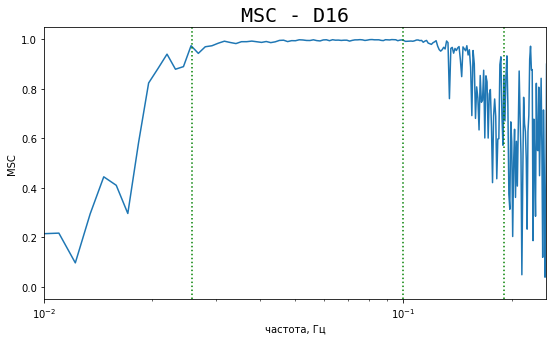

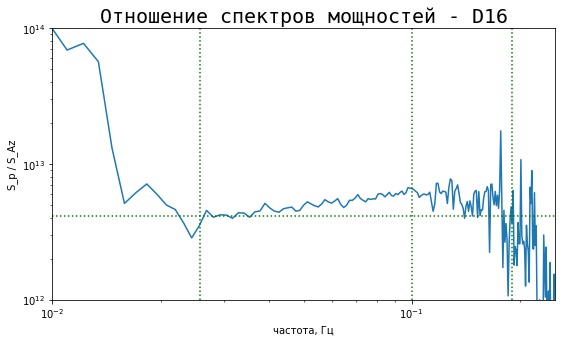

Доля хороших частот = 0.8666666666666667
Дельта = 0.14019991235356155


In [162]:
station_name = 'D16'
height = 1970
Az_path = 'az_metrics/201808190620_6h/M.KMD16.ZL.10Hz.asc.txt'
P_path = 'p_metrics/201808190600_7h/M.KMD16.Pr.txt'
P_time_start = 6, 0
P_time_stop = 13, 0
Az_time_start = 6, 20
Az_time_stop = 12, 20

develop_the_station(station_name, height, Az_path, P_path, P_time_start, P_time_stop, Az_time_start, Az_time_stop)

# Рельеф дна

In [14]:
def find_distance_in_meters(llat1,llong1,llat2,llong2):
    #pi - число pi, rad - радиус сферы (Земли)
    rad = 6372795
    
    #в радианах
    lat1 = llat1*math.pi/180.
    lat2 = llat2*math.pi/180.
    long1 = llong1*math.pi/180.
    long2 = llong2*math.pi/180.

    #косинусы и синусы широт и разницы долгот
    cl1 = math.cos(lat1)
    cl2 = math.cos(lat2)
    sl1 = math.sin(lat1)
    sl2 = math.sin(lat2)
    delta = long2 - long1
    cdelta = math.cos(delta)
    sdelta = math.sin(delta)

    #вычисления длины большого круга
    y = math.sqrt(math.pow(cl2*sdelta,2)+math.pow(cl1*sl2-sl1*cl2*cdelta,2))
    x = sl1*sl2+cl1*cl2*cdelta
    ad = math.atan2(y,x)
    dist = ad*rad

    #вычисление начального азимута
    x = (cl1*sl2) - (sl1*cl2*cdelta)
    y = sdelta*cl2
    z = math.degrees(math.atan(-y/x))

    if (x < 0):
        z = z+180.

    z2 = (z+180.) % 360. - 180.
    z2 = - math.radians(z2)
    anglerad2 = z2 - ((2*math.pi)*math.floor((z2/(2*math.pi))) )
    angledeg = (anglerad2*180.)/math.pi

    return dist

In [18]:
find_distance_in_meters(-6.246, 155.172, 33.4772, 136.9264) #papua new guinea

4819061.745814471

In [19]:
find_distance_in_meters(-18.113, -178.153, 33.4772, 136.9264) #fiji

7458183.827832893

In [20]:
find_distance_in_meters(56.004, -149.166, 33.4772, 136.9264) #alaska

6015574.629929645

In [1]:
import numpy as np
import pandas as pd

In [6]:
# загрузка файла рельефа местности
sed = np.loadtxt('data/relief_data/DONET1_136-137.5_32.5-34.dat', unpack = True)
map_data = pd.DataFrame(sed).T.rename(columns={
    0:'longitude',
    1:'latitude',
    2:'depth'
})

# загрузка файла глубин станций
stations_all = pd.read_csv('data/donet_list.csv', delimiter=';', header=None).rename(columns={
    0:'longitude',
    1:'latitude',
    2:'depth',
    3:'station'
})
stations_all['depth'] = stations_all['depth'] * (-1)
stations = stations_all[(stations_all.longitude >= map_data.longitude.min()) & 
                        (stations_all.longitude <= map_data.longitude.max()) & 
                        (stations_all.latitude >= map_data.latitude.min()) &
                        (stations_all.latitude <= map_data.latitude.max()+1)].copy()

stations['station'] = stations['station'].apply(lambda s: s[2:])
stations = stations.loc[:17,].copy()

In [7]:
stations

,longitude,latitude,depth,station
0,136.5570,33.8048,-2039,a01
1,136.6488,33.7524,-2011,a02
2,136.6037,33.6484,-2063,a03
3,136.4674,33.6781,-2054,a04
4,136.9264,33.4772,-1998,b05
5,136.9216,33.3584,-2499,b06
6,136.8072,33.3613,-1980,b07
7,136.8039,33.4664,-1924,b08
8,136.8313,33.0584,-3511,c09
9,136.9335,33.0533,-4247,c10


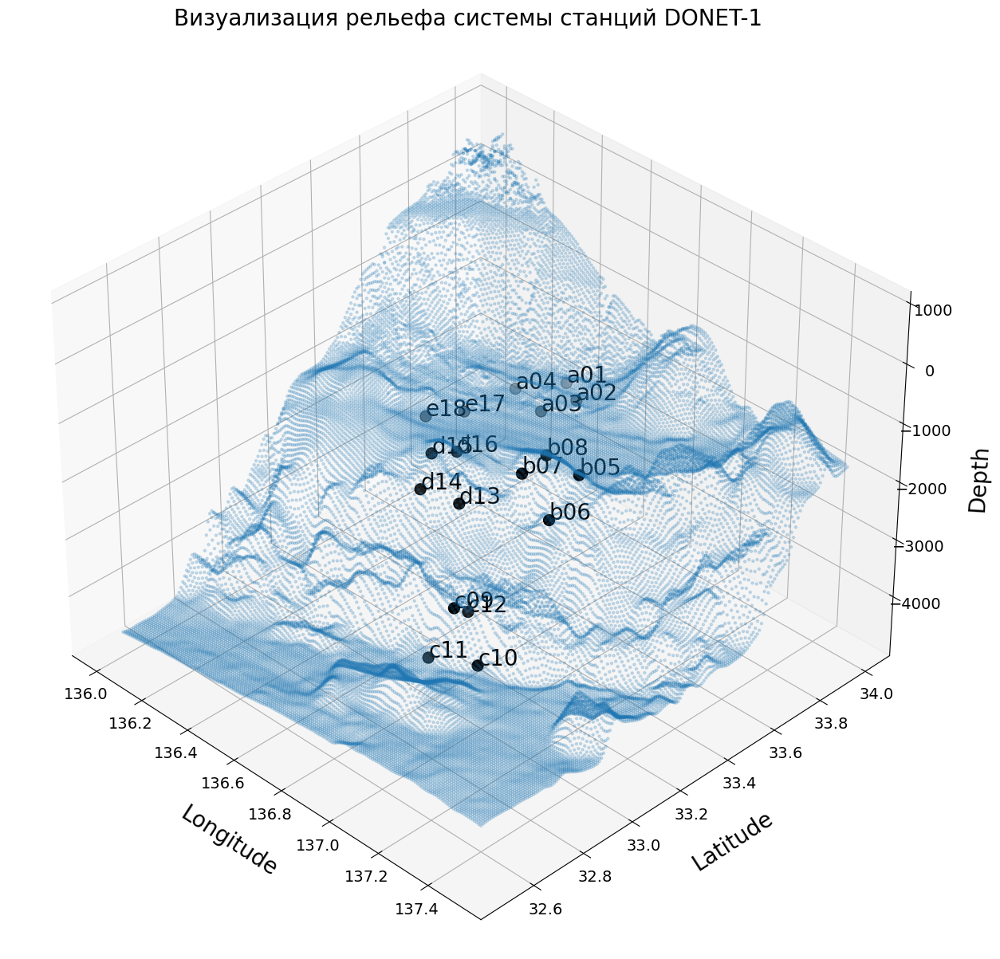

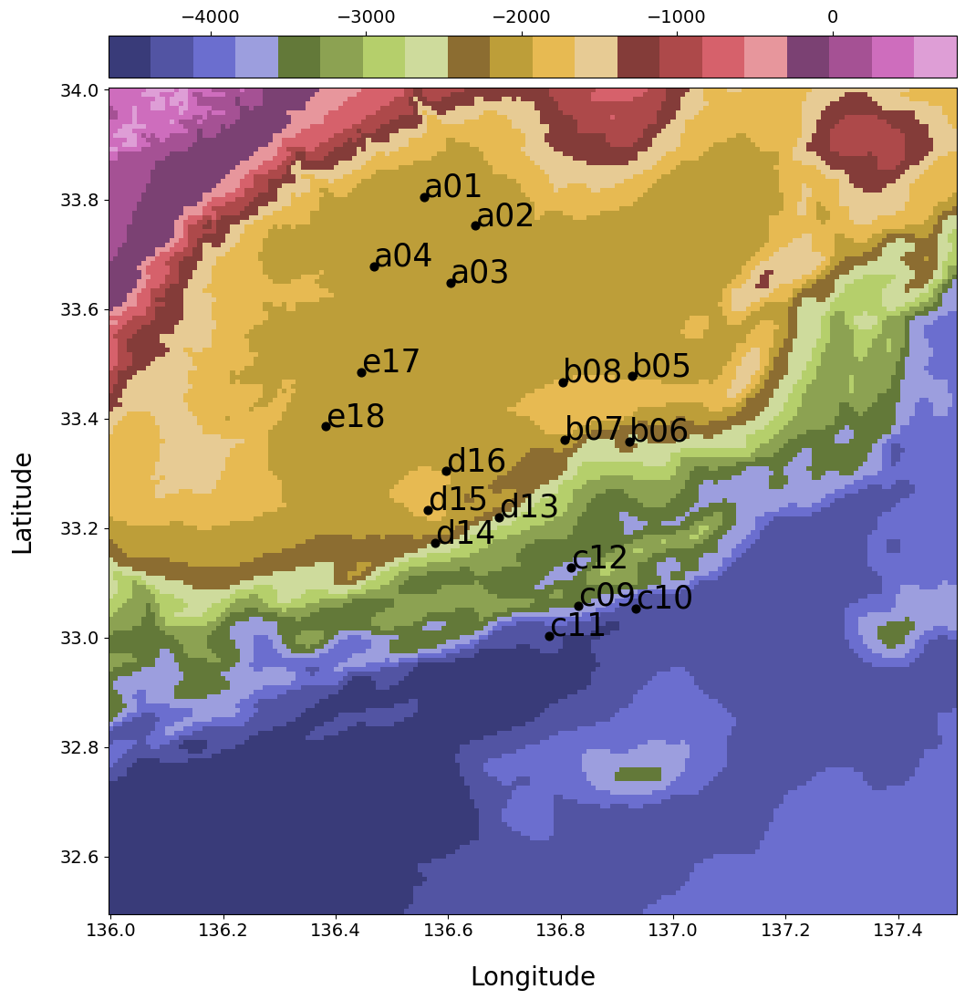

In [29]:
# graphics

# 3D - scatter
fig = plt.figure(figsize=(15,15))

ax = fig.add_subplot(111, projection='3d')
ax.view_init(azim=-45, elev=35)


ax.scatter(stations.longitude,
           stations.latitude,
           stations.depth, c='black', s=100, zorder=-1)
ax.scatter3D(map_data.longitude,
        map_data.latitude,
        map_data.depth, s=5, alpha=.2)


text = stations['station'].to_list()
for i, txt in enumerate(text):
    ax.text(stations.longitude[i], 
            stations.latitude[i], 
            stations.depth[i],
            '%s' % (txt), 
            size=20, zorder=1, color='k')
    
ax.set_title('Визуализация рельефа системы станций DONET-1', fontsize=20, pad=0)
ax.set_xlabel('Longitude', fontsize=20, labelpad=20)
ax.set_ylabel('Latitude', fontsize=20, labelpad=20)
ax.set_zlabel('Depth', fontsize=20, labelpad=20)
ax.tick_params(labelsize=14)
plt.show()
# plt.savefig('relief.png')

# color-maps
X, Y, Z = map_data.longitude, map_data.latitude, map_data.depth

x_uniq = X.nunique()
y_uniq = Y.nunique()

x = np.reshape(X.to_list(), (y_uniq, x_uniq))
y = np.reshape(Y.to_list(), (y_uniq, x_uniq))
z = np.reshape(Z.to_list(), (y_uniq, x_uniq))

# second 
fig = plt.figure(figsize=(12,14))
ax = fig.add_subplot(111)

pc = ax.pcolormesh(x, y, z, shading='auto', cmap='tab20b')
ax.tick_params(labelsize=14)
ax.set_xlabel('Longitude', fontsize=20, labelpad=20)
ax.set_ylabel('Latitude', fontsize=20, labelpad=20)
ax.scatter(stations.longitude,
           stations.latitude,
           c='black', s=40)

for i, txt in enumerate(text):
    ax.text(stations.longitude[i], 
            stations.latitude[i], 
            '%s' % (txt), 
            size=25, zorder=1, color='k')
cbar = fig.colorbar(pc, location='top', pad=0.01)
cbar.ax.tick_params(labelsize=14)
plt.show()

In [8]:
# создаем словарь глубин для более быстрого поиска глубины по коор-там
depth_dict = {}
for idx in map_data.index:
    depth_dict[str([map_data.loc[idx, 'longitude'],
               map_data.loc[idx, 'latitude']])] = map_data.loc[idx, 'depth']
    
# оси Х-У сетки
x_axe = sorted(map_data.longitude.unique())
y_axe = sorted(map_data.latitude.unique())

In [9]:
map_data

,longitude,latitude,depth
0,136.000000,32.5,-4629.0
1,136.008333,32.5,-4622.0
2,136.016667,32.5,-4616.0
3,136.025000,32.5,-4612.0
4,136.033333,32.5,-4606.0
...,...,...,...
32756,137.466667,34.0,-1691.0
32757,137.475000,34.0,-1695.0
32758,137.483333,34.0,-1699.0
32759,137.491667,34.0,-1711.0


In [15]:
# расчет градиентов для каждой точки поверхности UPDATED
shift = 1
map_data['grad'] = None
map_data['grad_east'] = None
map_data['grad_north'] = None

for idx in tqdm(map_data.index):
   
    current_X = map_data.loc[idx, 'longitude']
    current_Y = map_data.loc[idx, 'latitude']
    current_depth = map_data.loc[idx, 'depth']
    
    try:
        # точка справа по коорд сетке
        A2_x = x_axe[x_axe.index(current_X) + shift]
        A2_y = current_Y
        A2_depth = depth_dict[str([A2_x, A2_y])]

        # точка сверху по коорд сетке
        B2_x = current_X
        B2_y = y_axe[y_axe.index(current_Y) + shift]
        B2_depth = depth_dict[str([B2_x, B2_y])]
        
        # точка слева по коорд сетке
        A1_x = x_axe[x_axe.index(current_X) - shift]
        A1_y = current_Y
        A1_depth = depth_dict[str([A1_x, A1_y])]
        
        # точка снизу по коорд сетке
        B1_x = current_X
        B1_y = y_axe[y_axe.index(current_Y) - shift]
        B1_depth = depth_dict[str([B1_x, B1_y])]
        
        # Х-составлящая градиента 
        grad_X = ((A2_depth - A1_depth) / 
                  find_distance_in_meters(A2_y, A2_x, A1_y, A1_x))

        # Y-составляющая градиента
        grad_Y = ((B2_depth - B1_depth) / 
                  find_distance_in_meters(B2_y, B2_x, B1_y, B1_x))

        gradient = np.sqrt(grad_X**2 + grad_Y**2)
        map_data.at[idx, 'grad'] = gradient
        map_data.at[idx, 'grad_east'] = grad_X
        map_data.at[idx, 'grad_north'] = grad_Y
    
    # для обхода крайних точек без нужного числа соседей
    except IndexError:
        continue

  0%|          | 0/32761 [00:00<?, ?it/s]

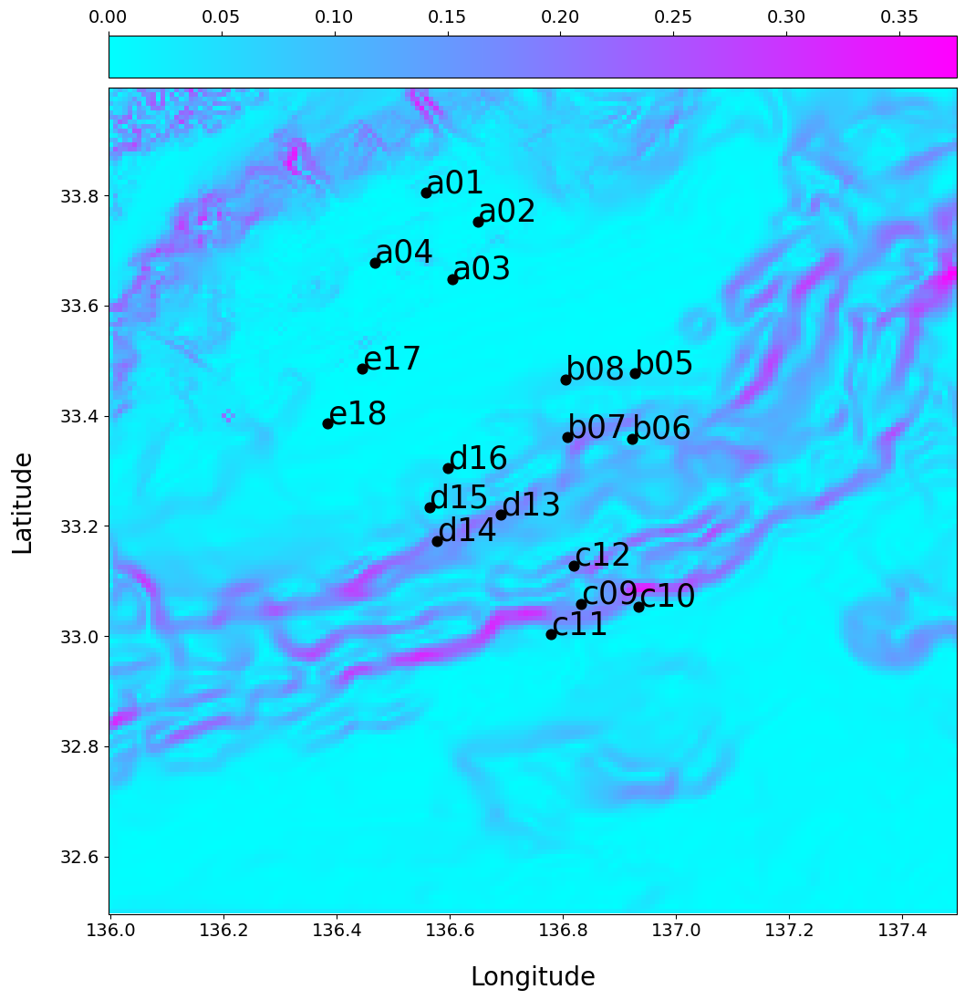

In [32]:
# gradient graphics
X, Y, Z = map_data[pd.notna(map_data.grad)].longitude, map_data[pd.notna(map_data.grad)].latitude, map_data[pd.notna(map_data.grad)].grad

x_uniq = X.nunique()
y_uniq = Y.nunique()

x = np.reshape(X.to_list(), (y_uniq, x_uniq))
y = np.reshape(Y.to_list(), (y_uniq, x_uniq))
z = np.reshape(Z.to_list(), (y_uniq, x_uniq))
fig = plt.figure(figsize=(12,14))
ax = fig.add_subplot(111)

pc = ax.pcolormesh(x, y, z, shading='auto', cmap='cool')
ax.tick_params(labelsize=14)
ax.set_xlabel('Longitude', fontsize=20, labelpad=20)
ax.set_ylabel('Latitude', fontsize=20, labelpad=20)
ax.scatter(stations.longitude,
           stations.latitude,
           c='black', s=60)

for i, txt in enumerate(text):
    ax.text(stations.longitude[i], 
            stations.latitude[i], 
            '%s' % (txt), 
            size=25, zorder=1, color='k')
cbar = fig.colorbar(pc, location='top', pad=0.01)
cbar.ax.tick_params(labelsize=14)
plt.show()

In [16]:
def find_closest_grad(x, y, df):
    '''
    x - current longitude
    y - current latitude
    returns: grad of nearest point
    '''
    closest = None
    closest_point = []
    
    for idx in df.index:
        x1 = df.loc[idx, 'longitude']
        y1 = df.loc[idx, 'latitude']
        z1 = df.loc[idx, 'depth']
        grad = df.loc[idx, 'grad']
#         metric = (x-x1)**2 + (y-y1)**2
        metric = find_distance_in_meters(y,x,y1,x1)
        if (closest == None) or (closest > metric):
            closest = metric
            closest_point = [x1, y1, z1, grad]
    
    return closest_point

stations['grad'] = stations.apply(lambda row: find_closest_grad(row.longitude, 
                                                                row.latitude, 
                                                                df=map_data)[3], axis=1)

In [17]:
# граница для "крутого склона" взята на глаз = 0.1
def find_closest_slope(x, y, df, grad_threshold=0.1):
    '''
    x - current longitude
    y - current latitude
    returns: distance to nearest slope 
    '''
    closest = None
    closest_point = []
    
    df = df[df.grad > grad_threshold]
    
    for idx in df.index:
        x1 = df.loc[idx, 'longitude']
        y1 = df.loc[idx, 'latitude']
#         metric = (x-x1)**2 + (y-y1)**2
        metric = find_distance_in_meters(y,x,y1,x1)
        if (closest == None) or (closest > metric):
            closest = metric
            closest_point = [x1, y1]
    
    if pd.isna(closest):
        return None
    else:
        return round(closest)

stations['from_slope'] = stations.apply(lambda row: find_closest_slope(row.longitude, 
                                              row.latitude, 
                                              df=map_data), axis=1)

In [18]:
stations['H_depth'] = stations['from_slope'] // abs(stations['depth'])

In [19]:
stations

,longitude,latitude,depth,station,grad,from_slope,H_depth
0,136.5570,33.8048,-2039,a01,0.024284,7809,3
1,136.6488,33.7524,-2011,a02,0.002253,15606,7
2,136.6037,33.6484,-2063,a03,0.004035,25435,12
3,136.4674,33.6781,-2054,a04,0.009796,16027,7
4,136.9264,33.4772,-1998,b05,0.042076,7080,3
5,136.9216,33.3584,-2499,b06,0.043971,1902,0
6,136.8072,33.3613,-1980,b07,0.088448,939,0
7,136.8039,33.4664,-1924,b08,0.049040,9445,4
8,136.8313,33.0584,-3511,c09,0.105648,190,0
9,136.9335,33.0533,-4247,c10,0.043737,1487,0


In [69]:
print(f'Distance btw lat neighbours {find_distance_in_meters(33.7,136,33.7,136.00833333)}')
print(f'Distance btw long neighbours {find_distance_in_meters(32.50833333,136,32.5,136)}')

Distance btw lat neighbours 771.1258712532646
Distance btw long neighbours 926.8850901173719


In [70]:
find_distance_in_meters(32.5, 136, 34,137.5)

217485.29905076968

 - Отлично видны предпосылки хорошего результата для b05,d15,d16 (А-станции не обсуждаются)
 - Также отлично видны предпосылки плохого результата для C-stations, b06,b07,b08 - явно лучше соседей

In [20]:
map_data

,longitude,latitude,depth,grad,grad_east,grad_north
0,136.000000,32.5,-4629.0,0.029962,-0.004159,-0.029672
1,136.008333,32.5,-4622.0,0.030618,0.008315,-0.029467
2,136.016667,32.5,-4616.0,0.030224,0.006396,-0.02954
3,136.025000,32.5,-4612.0,0.030159,0.006396,-0.029473
4,136.033333,32.5,-4606.0,0.030806,0.007675,-0.029835
...,...,...,...,...,...,...
32756,137.466667,34.0,-1691.0,None,None,None
32757,137.475000,34.0,-1695.0,None,None,None
32758,137.483333,34.0,-1699.0,None,None,None
32759,137.491667,34.0,-1711.0,None,None,None
